<a href="https://colab.research.google.com/github/peterwafik/Personalized_LLM-Based_Phishing_Awareness_Tool/blob/main/LLM_Based_Phishing_Awareness_Tool.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Libraries and Dataset**

In [3]:
#The 1st run should include the following pip installs, refresh the session then the 2nd run you comment them and run the libraries without them
#!pip install numpy==1.23.5 pandas==1.5.3 numba==0.56.4 matplotlib==3.6.2
#!pip install ydata-profiling
#!pip uninstall -y bigframes cudf-cu12
# import ydata_profiling
# from ydata_profiling import ProfileReport


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import pickle

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.metrics import silhouette_score, davies_bouldin_score
from collections import Counter
from sklearn.neighbors import NearestNeighbors
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential

from tensorflow.keras.layers import Dense, Dropout, Conv1D, MaxPooling1D, Flatten, LSTM, Input
from tensorflow.keras import Model

from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


# Read data from CSV file
df = pd.read_csv("/content/responses.csv")

# Step 1: Handle Missing Values
# Drop non-informative rows: remove rows with >61% missing critical column values
#df = df.dropna(thresh=int(len(df.columns) * 0.61)) #Any row with fewer than 61% populated values will be removed.
# Drop rows where the 'age' column includes no values (NaN or empty)
df = df.dropna(subset=['age'])

# Drop rows where the 'test_validity' column has a value less than 2
if 'test_validity' in df.columns:
    df = df[df['test_validity'] >= 2]
else:
    print("The 'test_validity' column does not exist in the dataset.")
# df = df.drop(columns=['test_valid'])


# Drop the "user_id" column
# df = df.drop(columns=['user_id'])


# Feature Engineering

country_to_nationality = {
    "Afghanistan": "Afghan",
    "Albania": "Albanian",
    "Algeria": "Algerian",
    "Andorra": "Andorran",
    "Italy": "Italian",
    "France": "French",
    "Germany": "German",
    "Spain": "Spanish",
    "Iran": "Iranian",
    "Sweden": "Swedish",
    "Ukraine": "Ukranian",
    "Egypt": "Egyptian"
    # Add more mappings as necessary
}

# Apply the mapping to the nationality column
df['nationality'] = df['nationality'].replace(country_to_nationality)

# Define the dictionary mapping nationalities to regions
nationality_to_region = {
    # Asia
    'Afghan': 'Asia',
    'Armenian': 'Asia',
    'Indian': 'Asia',
    'Cambodian': 'Asia',
    'Azerbaijani': 'Asia',
    'Indiana': 'Asia',


    # Europe
    'Albanian': 'Europe',
    'Austrian': 'Europe',
    'Belgian': 'Europe',
    'Croatian': 'Europe',
    'Czech': 'Europe',
    'Dutch': 'Europe',
    'Estonian': 'Europe',
    'French': 'Europe',
    'German': 'Europe',
    'Greek': 'Europe',
    'Italian': 'Europe',
    'Latvian': 'Europe',
    'Luxembourgish': 'Europe',
    'Moldovan': 'Europe',
    'Polish': 'Europe',
    'Serbian': 'Europe',
    'Slovenian': 'Europe',
    'Spanish': 'Europe',
    'Swedish': 'Europe',
    'Ukrainian': 'Europe',
    'Ukranian': 'Europe',
    'Andorran': 'Europe',
    'Cypriot': 'Europe',
    'British': 'Europe',
    'Liechtensteiner': 'Europe',



    # Middle East
    'Bahraini': 'Middle East',
    'Iranian': 'Middle East',
    'Saudi Arabia': 'Middle East',
    'Egyptian': 'Middle East',

    # Africa
    'Algerian': 'Africa',
    'Angolan': 'Africa',
    'Burundian': 'Africa',
    'South African': 'Africa',
    'Tanzanian': 'Africa',
    'Tunisian': 'Africa',
    'Ivorian': 'Africa',

    # North America
    'American': 'North America',
    'Canada': 'North America',
    'United States': 'North America',
    'Belize': 'North America',
    'Anguilla': 'North America',

    # South America
    'Argentinian': 'South America',
    'Bolivian': 'South America',
    'Brazilian': 'South America',

    # Oceania
    'Australian': 'Oceania',
    'Australia': 'Oceania',
    'New Zealander': 'Oceania',
}

# Map nationalities to regions
df['region'] = df['nationality'].map(nationality_to_region)


# Display the updated DataFrame and the countries classified as 'Unknown'
print(df)

df = df.drop(columns=['nationality'])

df_original= df.copy(deep=True)
# Define mapping rules
android_values = ['Linux aarch64', 'Linux armv7l', 'Linux armv81', 'Linux armv8l']
linux_values = ['Linux i686', 'Linux x86_64']

# Apply mapping: If value is in the predefined lists, replace it; otherwise, keep it unchanged
df['test_location'] = df['test_location'].apply(lambda x: 'Android' if x in android_values
                                                else 'Linux' if x in linux_values
                                                else x)




# Define the legitimate and phishing IDs as provided
legitimate_ids = [1, 5, 6, 17, 18, 19, 20, 21, 22, 25, 26, 32, 47, 48, 49, 50, 51, 53, 56, 57, 58, 61, 62, 63, 64, 66,
                  67, 80, 81, 82, 83, 84, 87, 88, 89, 91, 95, 97, 98, 99, 100, 103, 104, 110, 125, 126, 127, 128, 130,
                  131, 132, 135, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153,
                  154, 155, 156]
phishing_ids = [2, 3, 4, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 23, 24, 27, 28, 29, 30, 31, 33, 34, 35, 36, 37, 38, 39,
                40, 41, 42, 43, 44, 45, 46, 52, 54, 55, 59, 60, 65, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 85,
                86, 90, 92, 93, 94, 96, 101, 102, 105, 106, 107, 108, 109, 111, 112, 113, 114, 115, 116, 117, 118, 119,
                120, 121, 122, 123, 124, 129, 133, 134, 136, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167,
                168, 169, 170, 171, 172, 173, 174, 175, 176]

# Define a function to calculate the "result" based on the given logic
def calculate_result(row):
    count = 0
    # Iterate over columns in pairs (test_answer_{num}, email_id_{num})
    for num in range(1, 11):  # Assuming we have test_answer and email_id columns up to {5}
        test_answer_col = f'test_answer_{num}'
        email_id_col = f'email_id_{num}'

        # Check if columns exist to avoid KeyErrors
        if test_answer_col in row and email_id_col in row:
            test_answer = row[test_answer_col]
            email_id = row[email_id_col]

            # Apply the incrementing logic based on conditions provided
            if (test_answer == 0.0 and email_id in legitimate_ids) or (test_answer == 1.0 and email_id in phishing_ids):
                count += 1
    return count

# Apply the function to each row and create the "result" column
df['result'] = df.apply(calculate_result, axis=1)

# Interaction Features: e.g., educationLevel_id × jobField_id
#df['education_job_interaction'] = df['educationLevel_id'] * df['jobField_id']
# # Convert 'date_joined' to datetime format
# df['date_joined'] = pd.to_datetime(df['date_joined'], errors='coerce')
# # Create separate 'month' and 'day' columns
# df['month'] = df['date_joined'].dt.month
# df['day'] = df['date_joined'].dt.day
# # Optionally drop the original 'date_joined' column if no longer needed
# df = df.drop(columns=['date_joined'])
df['gender'] = df['gender'].replace('Altro', 'Other')

df_clusters = df.copy(deep=True) #####To be used in clusters since they preserve all imp features regarding both personal traits and text traits

df_actual = df.copy(deep=True)
columns_to_drop = [
    "id_1", "id_2", "id_3", "id_4", "id_5", "id_6", "id_7", "id_8", "id_9", "id_10",
    "time_taken_to_answer_1", "time_taken_to_answer_2", "time_taken_to_answer_3",
    "time_taken_to_answer_4", "time_taken_to_answer_5", "time_taken_to_answer_6",
    "time_taken_to_answer_7", "time_taken_to_answer_8", "time_taken_to_answer_9",
    "time_taken_to_answer_10", "test_answer_1", "test_answer_2", "test_answer_3",
    "test_answer_4", "test_answer_5", "test_answer_6", "test_answer_7", "test_answer_8",
    "test_answer_9", "test_answer_10", "email_id_1", "email_id_2", "email_id_3", "email_id_4", "email_id_5", "email_id_6",
    "email_id_7", "email_id_8", "email_id_9", "email_id_10", "reported_as_spam_1",
    "reported_as_spam_2", "reported_as_spam_3", "reported_as_spam_4", "reported_as_spam_5",
    "reported_as_spam_6", "reported_as_spam_7", "reported_as_spam_8", "reported_as_spam_9",
    "reported_as_spam_10", "antiPhishing_course", "education_job_interaction", "result", "work_hours_prior_test"
]



# Drop the columns
df = df_actual.drop(columns=columns_to_drop)
df = df.drop(columns=['region']) ############################################################################# For testinggggg ######################################3
df_LLM = df.copy(deep=True)
df.info()




The 'test_validity' column does not exist in the dataset.
      age  gender  years_job_experience nationality  \
0      26    Male                     0     Italian   
1      26  Female                    10     Italian   
2      50  Female                     0     Italian   
3      27  Female                     0     Italian   
4      17  Female                     0     Italian   
...   ...     ...                   ...         ...   
1491   19  Female                     0    Egyptian   
1492   23  Female                     1    Egyptian   
1493   54    Male                    28    Egyptian   
1494   90  Female                    40    Egyptian   
1495   54    Male                     1     Italian   

      computer_science_knowledge  antiPhishing_course  phishing_attack  \
0                              5                    0                0   
1                              2                    0                0   
2                              1                    0      

# **Data Exploration**

## Middle East vs. Europe

In [ ]:
import os
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Create a directory to save the visualizations
output_dir = "output_visualizations"
os.makedirs(output_dir, exist_ok=True)

# Set font sizes for the visualizations
sns.set_context("talk", font_scale=1.2)  # Adjust font scale as needed

# Filter records for "Middle East" and "Europe" from the 'region' column
middle_east_df = df[df['region'] == "Middle East"]
europe_df = df[df['region'] == "Europe"]

# Define the traits to visualize
traits = [
    'self_confidence', 'impulsivity', 'curiosity', 'risk_propensity', 'risk_perception',
    'privacy_data', 'extraversion', 'agreeableness', 'conscientiousness',
    'emotional_stability', 'openness', 'scarcity', 'consistency', 'social_proof',
    'gratitude', 'authority', 'computer_science_knowledge'
]

# Visualization: Average results between the two regions
plt.figure(figsize=(8, 5))
avg_results = pd.DataFrame({
    'Region': ['Middle East', 'Europe'],
    'Average Result': [middle_east_df['result'].mean(), europe_df['result'].mean()]
})
sns.barplot(data=avg_results, x='Region', y='Average Result', palette='coolwarm')
plt.title("Average Results Between Middle East and Europe", fontsize=22)
plt.ylabel("Average Result", fontsize=20)
plt.xlabel("Region", fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.savefig(os.path.join(output_dir, "average_results_barplot.png"))
plt.show()

# Visualizations: Distribution of each trait for both regions
for trait in traits:
    plt.figure(figsize=(12, 6))
    sns.kdeplot(middle_east_df[trait], label='Middle East', fill=True, alpha=0.5, color='blue')
    sns.kdeplot(europe_df[trait], label='Europe', fill=True, alpha=0.5, color='red')
    plt.title(f"Distribution of {trait.title()} - Middle East vs Europe", fontsize=18)
    plt.xlabel(trait.title(), fontsize=20)
    plt.ylabel("Density", fontsize=20)
    plt.legend(fontsize=18)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.savefig(os.path.join(output_dir, f"distribution_{trait}.png"))
    plt.show()

# Visualization: Average results between the two regions using a box plot
plt.figure(figsize=(8, 6))
sns.boxplot(
    data=df[df['region'].isin(["Middle East", "Europe"])],
    x='region',
    y='result',
    palette='coolwarm'
)
plt.title("Average Results Between Middle East and Europe (Box Plot)", fontsize=22)
plt.ylabel("Result", fontsize=20)
plt.xlabel("Region", fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.savefig(os.path.join(output_dir, "average_results_boxplot.png"))
plt.show()

# Visualizations: Box plots for each trait for both regions
for trait in traits:
    plt.figure(figsize=(12, 6))
    sns.boxplot(
        data=df[df['region'].isin(["Middle East", "Europe"])],
        x='region',
        y=trait,
        palette='coolwarm'
    )
    plt.title(f"{trait.title()} - Middle East vs Europe (Box Plot)", fontsize=22)
    plt.ylabel(trait.title(), fontsize=16)
    plt.xlabel("Region", fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.savefig(os.path.join(output_dir, f"boxplot_{trait}.png"))
    plt.show()


KeyError: 'region'

#**Data Preprocessing**

In [4]:
# import pandas as pd
# import numpy as np
# from sklearn.preprocessing import StandardScaler, LabelEncoder, QuantileTransformer
# from sklearn.linear_model import LogisticRegression  # Import Logistic Regression
# from sklearn.neighbors import NearestNeighbors
# from scipy.stats import kendalltau
# import matplotlib.pyplot as plt
# import seaborn as sns

# # Step 2: Separate Numerical and Categorical Columns
# numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
# categorical_columns = df.select_dtypes(include=['object']).columns.tolist()

# # Step 3: Detect Imbalanced Features and Apply Matching Quasi-Experiment
# imbalance_threshold = 0.6  # Define threshold for imbalance detection
# imbalanced_columns = []

# for column in categorical_columns:
#     # Check if the column has an imbalance
#     category_counts = df[column].value_counts(normalize=True)
#     if category_counts.iloc[0] >= imbalance_threshold:
#         imbalanced_columns.append(column)

# print("Imbalanced columns detected for matching:")
# print(imbalanced_columns)

# # Apply Propensity Score Matching (PSM) to balance data
# balanced_data = []

# for column in imbalanced_columns:
#     print(f"Balancing column using PSM: {column}")

#     # Encode the target column as binary
#     df['target_binary'] = (df[column] != df[column].value_counts().idxmax()).astype(int)

#     # Define features and target for logistic regression
#     features = [col for col in df.columns if col not in categorical_columns + ['target_binary']]
#     X = df[features].copy()
#     y = df['target_binary']

#     # Scale numerical features
#     scaler = StandardScaler()
#     X_scaled = scaler.fit_transform(X)

#     # Fit logistic regression for propensity score calculation
#     model = LogisticRegression(max_iter=500)
#     model.fit(X_scaled, y)
#     df['propensity_score'] = model.predict_proba(X_scaled)[:, 1]

#     # Separate majority and minority groups
#     majority_group = df[df['target_binary'] == 0]
#     minority_group = df[df['target_binary'] == 1]

#     # Use Nearest Neighbors for matching
#     nn = NearestNeighbors(n_neighbors=1)
#     nn.fit(majority_group[['propensity_score']])
#     _, indices = nn.kneighbors(minority_group[['propensity_score']])

#     # Select matched majority samples
#     matched_majority = majority_group.iloc[indices.flatten()]
#     balanced_group = pd.concat([minority_group, matched_majority])

#     # Append balanced data for this column
#     balanced_data.append(balanced_group.drop(columns=['target_binary', 'propensity_score']))

# # Combine all balanced datasets
# if not balanced_data:
#     raise ValueError("No imbalanced data found to balance. Check your imbalance threshold or dataset.")
# df_balanced = pd.concat(balanced_data).reset_index(drop=True)

# # Step 4: Determine Encoding Using Kendall Tau
# def determine_encoding(data, categorical_columns, numerical_columns):
#     """
#     Determines whether a categorical column should use one-hot encoding or label encoding
#     based on Kendall Tau correlation with numerical columns.
#     """
#     encoding_decisions = {}

#     for cat_col in categorical_columns:
#         high_correlation = False
#         for num_col in numerical_columns:
#             tau, p_value = kendalltau(data[cat_col].astype(str), data[num_col])
#             if abs(tau) > 0.3 and p_value < 0.05:
#                 high_correlation = True
#                 break

#         encoding_decisions[cat_col] = 'Label Encoding' if high_correlation else 'One-Hot Encoding'

#     return encoding_decisions

# encoding_decisions = determine_encoding(df_balanced, categorical_columns, numerical_columns)
# print("Encoding decisions for categorical columns:")
# print(encoding_decisions)

# # Step 5: Apply Encoding Automatically
# label_encoders = {}
# for col, encoding_type in encoding_decisions.items():
#     if encoding_type == 'Label Encoding':
#         le = LabelEncoder()
#         df_balanced[col] = le.fit_transform(df_balanced[col].astype(str))
#         label_encoders[col] = le
#     elif encoding_type == 'One-Hot Encoding':
#         # Handle one-hot encoding with reindexing to ensure all categories are present
#         one_hot = pd.get_dummies(df_balanced[col], prefix=col)

#         # Add missing categories if needed
#         all_categories = [f"{col}_{category}" for category in df[col].unique()]
#         one_hot = one_hot.reindex(columns=all_categories, fill_value=0)

#         df_balanced = pd.concat([df_balanced, one_hot], axis=1)
#         df_balanced.drop(columns=[col], inplace=True)

# # Step 5.1: Check for correlation
# correlation_matrix = df_balanced.corr()
# sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
# plt.title("Correlation Matrix")
# plt.show()

# # Step 5.2: Drop highly correlated features
# threshold = 0.9
# high_corr_features = set()

# for i in range(len(correlation_matrix.columns)):
#     for j in range(i):
#         if abs(correlation_matrix.iloc[i, j]) > threshold:
#             colname = correlation_matrix.columns[i]
#             high_corr_features.add(colname)

# print("Highly correlated features to drop:", high_corr_features)
# #df_balanced.drop(columns=high_corr_features, inplace=True)

# # Step 6: Scaling and Transformation
# quantile_transformer = QuantileTransformer(output_distribution='normal')
# df_balanced[numerical_columns] = quantile_transformer.fit_transform(df_balanced[numerical_columns])

# scaler = StandardScaler()
# df_balanced[numerical_columns] = scaler.fit_transform(df_balanced[numerical_columns])

# # Step 7: Handle Outliers by Clipping
# outlier_columns = ['self_confidence', 'risk_propensity', 'work_hours_prior_test']
# for col in outlier_columns:
#     q_low = df_balanced[col].quantile(0.01)
#     q_high = df_balanced[col].quantile(0.99)
#     df_balanced[col] = df_balanced[col].clip(lower=q_low, upper=q_high)

# # Step 8: Convert Columns to Float for Consistency
# def convert_columns_to_float(df):
#     for column in df.columns:
#         try:
#             df[column] = df[column].astype(float)
#         except ValueError:
#             print(f"Column '{column}' could not be converted to float and was skipped.")
#     return df

# df_balanced = convert_columns_to_float(df_balanced)
# df_balanced = df_balanced.fillna(0)

# # Step 9: Drop Irrelevant Columns
# columns_to_drop = [
#     "id_1", "id_2", "id_3", "id_4", "id_5", "id_6", "id_7", "id_8", "id_9", "id_10",
#     "time_taken_to_answer_1", "time_taken_to_answer_2", "time_taken_to_answer_3",
#     "time_taken_to_answer_4", "time_taken_to_answer_5", "time_taken_to_answer_6",
#     "time_taken_to_answer_7", "time_taken_to_answer_8", "time_taken_to_answer_9",
#     "time_taken_to_answer_10", "test_answer_1", "test_answer_2", "test_answer_3",
#     "test_answer_4", "test_answer_5", "test_answer_6", "test_answer_7", "test_answer_8",
#     "test_answer_9", "test_answer_10", "email_id_1", "email_id_2", "email_id_3", "email_id_4", "email_id_5", "email_id_6",
#     "email_id_7", "email_id_8", "email_id_9", "email_id_10", "reported_as_spam_1",
#     "reported_as_spam_2", "reported_as_spam_3", "reported_as_spam_4", "reported_as_spam_5",
#     "reported_as_spam_6", "reported_as_spam_7", "reported_as_spam_8", "reported_as_spam_9",
#     "reported_as_spam_10", "antiPhishing_course"
# ]

# df = df_balanced.drop(columns=columns_to_drop, errors='ignore')
# df_copy = df.copy(deep=True)

# # Step 10: Final Dataframe Check
# print("Preprocessing complete. Data is ready for further analysis or modeling:")
# print(df_copy.info())
# print(df_copy.isna().sum())


Encoding decisions for categorical columns:
{'gender': 'One-Hot Encoding', 'test_location': 'One-Hot Encoding'}


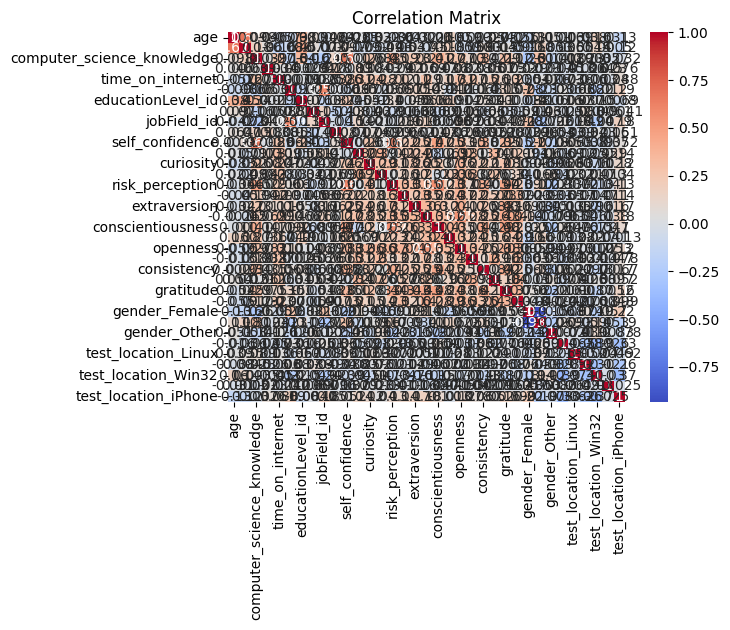

Highly correlated features to drop: {'gender_Male'}
Preprocessing complete. Data is ready for further analysis or modeling:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1496 entries, 0 to 1495
Data columns (total 35 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   age                         1496 non-null   float64
 1   years_job_experience        1496 non-null   float64
 2   computer_science_knowledge  1496 non-null   float64
 3   phishing_attack             1496 non-null   float64
 4   time_on_internet            1496 non-null   float64
 5   educationField_id           1496 non-null   float64
 6   educationLevel_id           1496 non-null   float64
 7   employmentType_id           1496 non-null   float64
 8   jobField_id                 1496 non-null   float64
 9   antiPhishing_course_ever    1496 non-null   float64
 10  self_confidence             1496 non-null   float64
 11  impulsivity            

In [5]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder, QuantileTransformer
from scipy.stats import kendalltau
import matplotlib.pyplot as plt
import seaborn as sns


# Step 2: Separate Numerical and Categorical Columns
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_columns = df.select_dtypes(include=['object']).columns.tolist()

# Step 3: Detect and Handle Imbalance by Assigning Sample Weights

# Initialize a dictionary to store weights for each instance
sample_weights = pd.Series([1.0] * len(df), index=df.index)

# Calculate sample weights for imbalanced categorical columns
imbalance_threshold = 0.8  # Define threshold for imbalance detection (e.g., 80% or more of instances in one class)

for column in categorical_columns:
    # Check if the column has an imbalance
    category_counts = df[column].value_counts(normalize=True)
    if category_counts.iloc[0] >= imbalance_threshold:  # Check if the largest class exceeds the threshold
        # Assign higher weights to minority classes
        for category, proportion in category_counts.items():  # Changed iteritems() to items()
            if proportion < imbalance_threshold:  # Only increase weight for minority classes
                # Calculate inverse proportional weight
                weight = 1 / proportion
                sample_weights[df[column] == category] *= weight


# Step 4: Determine Encoding Using Kendall Tau

def determine_encoding(data, categorical_columns, numerical_columns):
    """
    Determines whether a categorical column should use one-hot encoding or label encoding
    based on Kendall Tau correlation with numerical columns.

    Parameters:
    data (pd.DataFrame): The dataset.
    categorical_columns (list): List of categorical column names.
    numerical_columns (list): List of numerical column names.

    Returns:
    dict: Dictionary with columns and their recommended encoding method.
    """
    encoding_decisions = {}

    for cat_col in categorical_columns:
        high_correlation = False

        for num_col in numerical_columns:
            # Calculate Kendall Tau correlation
            tau, p_value = kendalltau(data[cat_col].astype(str), data[num_col])

            # Check if correlation is significant
            if abs(tau) > 0.3 and p_value < 0.05:  # Adjust threshold as needed
                high_correlation = True
                break

        # Decide encoding type based on correlation
        if high_correlation:
            encoding_decisions[cat_col] = 'Label Encoding'
        else:
            encoding_decisions[cat_col] = 'One-Hot Encoding'

    return encoding_decisions

# Example usage
encoding_decisions = determine_encoding(df, categorical_columns, numerical_columns)
print("Encoding decisions for categorical columns:")
print(encoding_decisions)

# Step 5: Apply Encoding Automatically
label_encoders = {}
for col, encoding_type in encoding_decisions.items():
    if encoding_type == 'Label Encoding':
        le = LabelEncoder()
        df[col] = le.fit_transform(df[col].astype(str))
        label_encoders[col] = le  # Save the label encoder for potential inverse transformation

    elif encoding_type == 'One-Hot Encoding':
        one_hot = pd.get_dummies(df[col], prefix=col)
        df = pd.concat([df, one_hot], axis=1)
        df.drop(columns=[col], inplace=True)

# ✅ Save Label Encoders for Later Use
with open("label_encoders.pkl", "wb") as f:
    pickle.dump(label_encoders, f)

# Step 5.1: Check for correlation
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()

# Step 5.2: Drop highly correlated features
threshold = 0.9  # Correlation threshold
high_corr_features = set()

for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > threshold:
            colname = correlation_matrix.columns[i]
            high_corr_features.add(colname)

print("Highly correlated features to drop:", high_corr_features)

# Step 6: Scaling and Transformation
quantile_transformer = QuantileTransformer(output_distribution='normal')
df[numerical_columns] = quantile_transformer.fit_transform(df[numerical_columns])

scaler = StandardScaler()
df[numerical_columns] = scaler.fit_transform(df[numerical_columns])

 # ✅ Save the fitted scaler & quantile transformer
with open("quantile_transformer.pkl", "wb") as f:
    pickle.dump(quantile_transformer, f)

with open("scaler.pkl", "wb") as f:
    pickle.dump(scaler, f)

# ✅ Save Mean & Std using fitted scaler values instead of raw data
mean_values = pd.Series(scaler.mean_, index=numerical_columns)  # Use scaler's mean_
std_values = pd.Series(scaler.scale_, index=numerical_columns)  # Use scaler's std_

mean_values.to_csv("mean_values.csv", index=True)
std_values.to_csv("std_values.csv", index=True)
# Step 7: Handle Outliers by Clipping
outlier_columns = ['age', 'years_job_experience', 'computer_science_knowledge', 'phishing_attack',
        'time_on_internet', 'educationField_id', 'educationLevel_id', 'employmentType_id',
        'jobField_id', 'antiPhishing_course_ever', 'self_confidence',
        'impulsivity', 'curiosity', 'risk_propensity', 'risk_perception', 'privacy_data',
        'extraversion', 'agreeableness', 'conscientiousness', 'emotional_stability', 'openness',
        'scarcity', 'consistency', 'social_proof', 'gratitude', 'authority']
for col in outlier_columns:
    q_low = df[col].quantile(0.10)
    q_high = df[col].quantile(0.90)
    df[col] = df[col].clip(lower=q_low, upper=q_high)

# Step 8: Convert Columns to Float for Consistency
def convert_columns_to_float(df):
    for column in df.columns:
        try:
            df[column] = df[column].astype(float)
        except ValueError:
            print(f"Column '{column}' could not be converted to float and was skipped.")
    return df

df = convert_columns_to_float(df)
df_copy = df.copy(deep=True)


# Step 10: Final Dataframe Check
print("Preprocessing complete. Data is ready for further analysis or modeling:")
print(df_copy.info())
print(df_copy.isna().sum())

# Optional: Save sample weights for clustering if needed in further analysis
print("Sample weights calculated for handling imbalance:\n", sample_weights)


In [6]:
# import pandas as pd
# import numpy as np
# import pickle
# from sklearn.preprocessing import StandardScaler, LabelEncoder, QuantileTransformer
# from scipy.stats import kendalltau
# import matplotlib.pyplot as plt
# import seaborn as sns

# def preprocess_large_dataset(df):
#     """
#     Preprocesses the input dataframe by encoding categorical variables,
#     normalizing numerical features, and handling scaling. Saves necessary
#     transformations for future use on single-row datasets.

#     Parameters:
#         df (pd.DataFrame): Input dataframe.

#     Returns:
#         pd.DataFrame: Preprocessed dataframe.
#     """

#     # ✅ Step 1: Separate Numerical and Categorical Columns
#     numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
#     categorical_columns = df.select_dtypes(include=['object']).columns.tolist()

#     # ✅ Step 2: Detect and Handle Imbalance by Assigning Sample Weights
#     sample_weights = pd.Series([1.0] * len(df), index=df.index)
#     imbalance_threshold = 0.8

#     for column in categorical_columns:
#         category_counts = df[column].value_counts(normalize=True)
#         if category_counts.iloc[0] >= imbalance_threshold:
#             for category, proportion in category_counts.items():
#                 if proportion < imbalance_threshold:
#                     weight = 1 / proportion
#                     sample_weights[df[column] == category] *= weight

#     # ✅ Step 3: Determine Encoding Using Kendall Tau
#     def determine_encoding(data, categorical_columns, numerical_columns):
#         encoding_decisions = {}
#         for cat_col in categorical_columns:
#             high_correlation = False
#             for num_col in numerical_columns:
#                 tau, p_value = kendalltau(data[cat_col].astype(str), data[num_col])
#                 if abs(tau) > 0.3 and p_value < 0.05:
#                     high_correlation = True
#                     break
#             encoding_decisions[cat_col] = 'Label Encoding' if high_correlation else 'One-Hot Encoding'
#         return encoding_decisions

#     encoding_decisions = determine_encoding(df, categorical_columns, numerical_columns)
#     print("Encoding decisions:", encoding_decisions)

#     # ✅ Step 4: Apply Encoding Automatically
#     label_encoders = {}
#     for col, encoding_type in encoding_decisions.items():
#         if encoding_type == 'Label Encoding':
#             le = LabelEncoder()
#             df[col] = le.fit_transform(df[col].astype(str))
#             label_encoders[col] = le
#         elif encoding_type == 'One-Hot Encoding':
#             one_hot = pd.get_dummies(df[col], prefix=col)
#             df = pd.concat([df, one_hot], axis=1)
#             df.drop(columns=[col], inplace=True)

#     # ✅ Save Label Encoders & One-Hot Encoded Column Names
#     with open("label_encoders.pkl", "wb") as f:
#         pickle.dump(label_encoders, f)

#     one_hot_encoded_columns = [col for col in df.columns if "_" in col and col not in numerical_columns]
#     with open("one_hot_columns.pkl", "wb") as f:
#         pickle.dump(one_hot_encoded_columns, f)

#     # ✅ Step 5: Check for Correlation and Drop Highly Correlated Features
#     correlation_matrix = df.corr()
#     sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
#     plt.title("Correlation Matrix")
#     plt.show()

#     threshold = 0.9
#     high_corr_features = set()
#     for i in range(len(correlation_matrix.columns)):
#         for j in range(i):
#             if abs(correlation_matrix.iloc[i, j]) > threshold:
#                 high_corr_features.add(correlation_matrix.columns[i])

#     print("Highly correlated features to drop:", high_corr_features)
#     df.drop(columns=list(high_corr_features), inplace=True)

#     # ✅ Step 6: Scaling and Transformation
#     quantile_transformer = QuantileTransformer(output_distribution='normal')
#     df[numerical_columns] = quantile_transformer.fit_transform(df[numerical_columns])

#     scaler = StandardScaler()
#     df[numerical_columns] = scaler.fit_transform(df[numerical_columns])

#     # ✅ Save the fitted scaler & quantile transformer
#     with open("quantile_transformer.pkl", "wb") as f:
#         pickle.dump(quantile_transformer, f)

#     with open("scaler.pkl", "wb") as f:
#         pickle.dump(scaler, f)

#     # ✅ Save Mean & Std for Future Scaling of a Single-Row Dataset
#     mean_values = pd.Series(df[numerical_columns].mean(), index=numerical_columns)
#     std_values = pd.Series(df[numerical_columns].std(), index=numerical_columns)

#     mean_values.to_csv("mean_values.csv", index=True)
#     std_values.to_csv("std_values.csv", index=True)

#     # ✅ Step 7: Handle Outliers by Clipping
#     outlier_columns = ['self_confidence', 'risk_propensity', 'work_hours_prior_test']
#     for col in outlier_columns:
#         q_low = df[col].quantile(0.01)
#         q_high = df[col].quantile(0.99)
#         df[col] = df[col].clip(lower=q_low, upper=q_high)

#     # ✅ Step 8: Ensure All Expected Columns Exist
#     expected_columns = numerical_columns + one_hot_encoded_columns
#     for col in expected_columns:
#         if col not in df.columns:
#             df[col] = 0.0

#     df = df[expected_columns]

#     # ✅ Step 9: Drop Unnecessary Columns
#     columns_to_drop = [
#         "id_1", "id_2", "time_taken_to_answer_1", "test_answer_1", "email_id_1",
#         "reported_as_spam_1", "antiPhishing_course"
#     ]
#     df.drop(columns=[col for col in columns_to_drop if col in df.columns], inplace=True)

#     # ✅ Final Checks
#     print("Final dataset information after preprocessing:")
#     print(df.info())
#     print(df.isna().sum())

#     return df

df_copy.head()
output_file_path = '/content/sample_data/df.csv'
df_copy.to_csv(output_file_path, index=False)

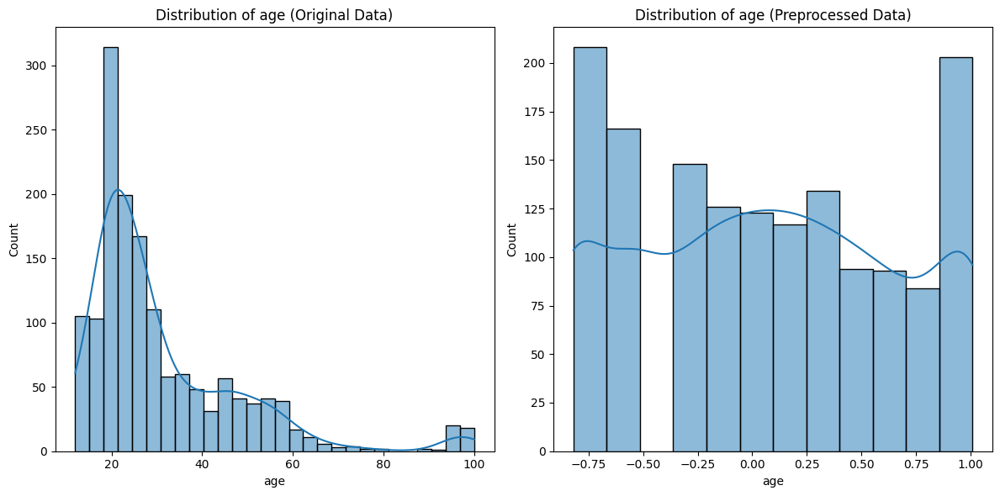

Column 'gender' not found in both dataframes.


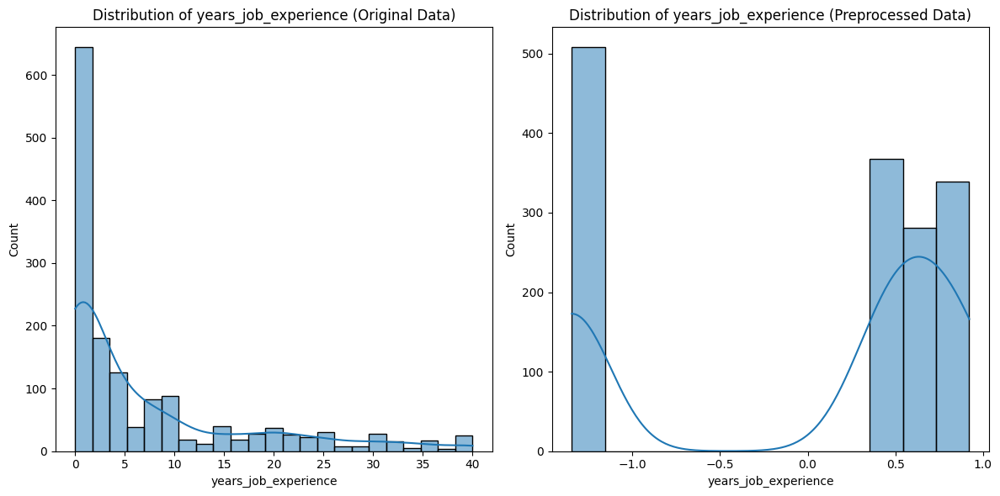

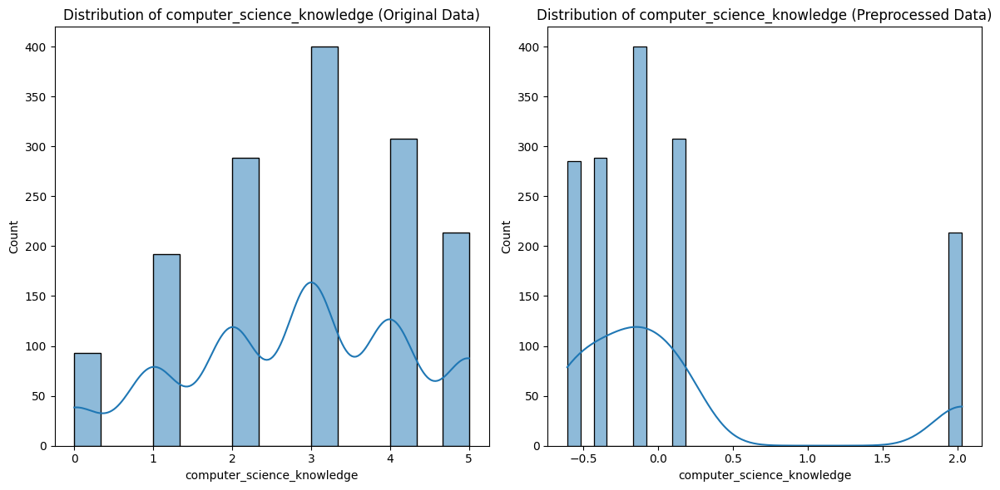

Column 'antiPhishing_course' not found in both dataframes.


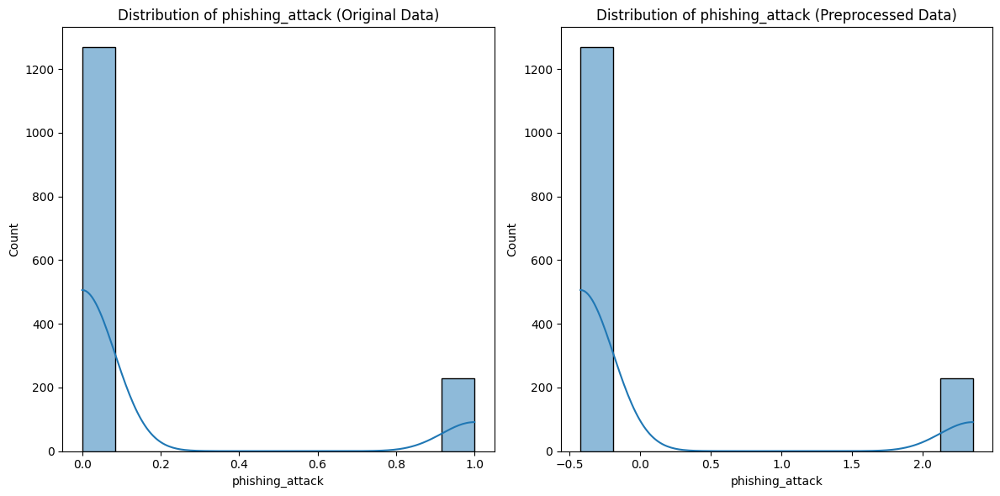

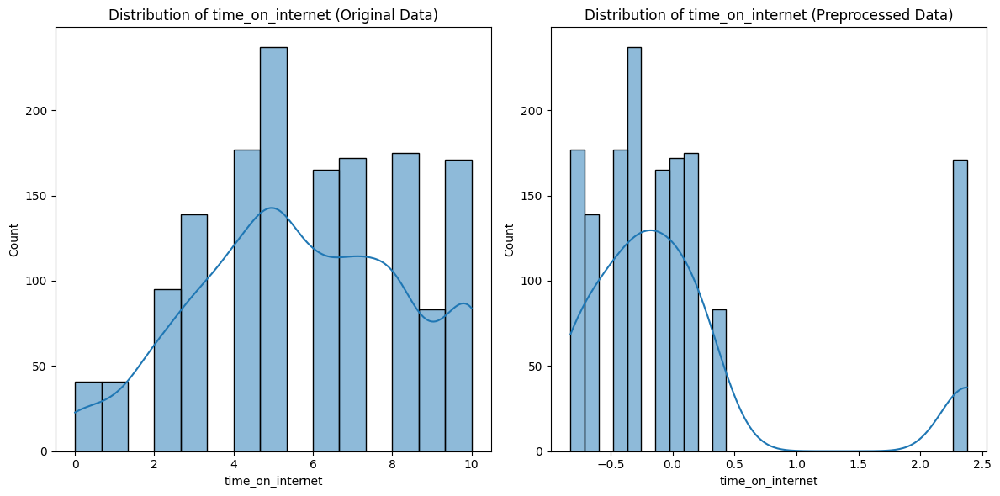

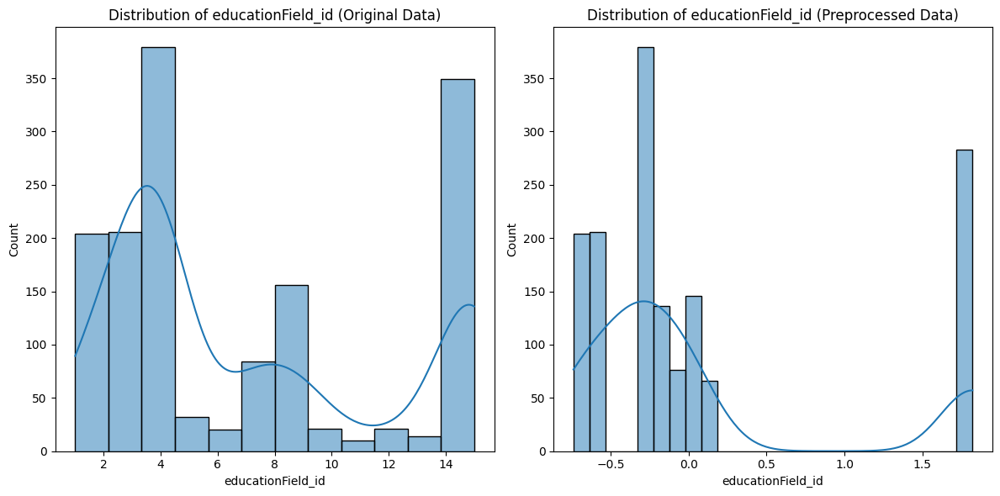

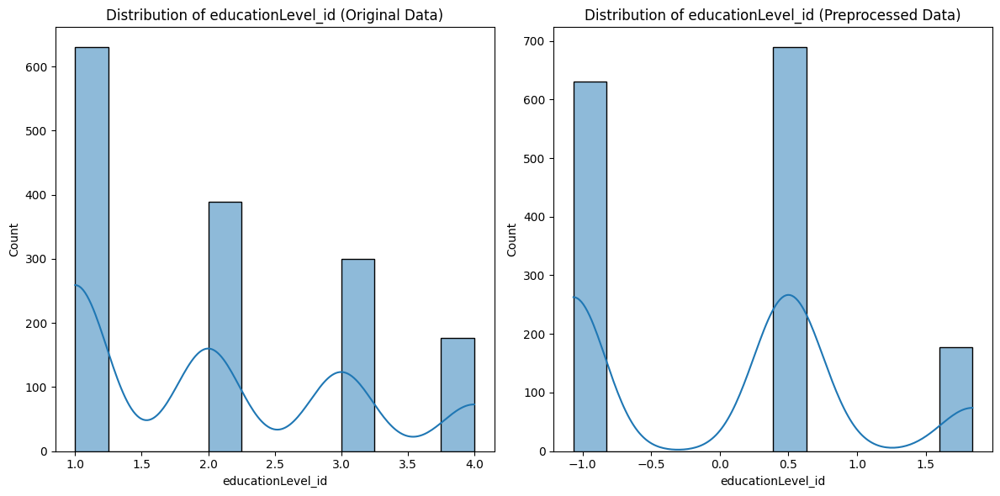

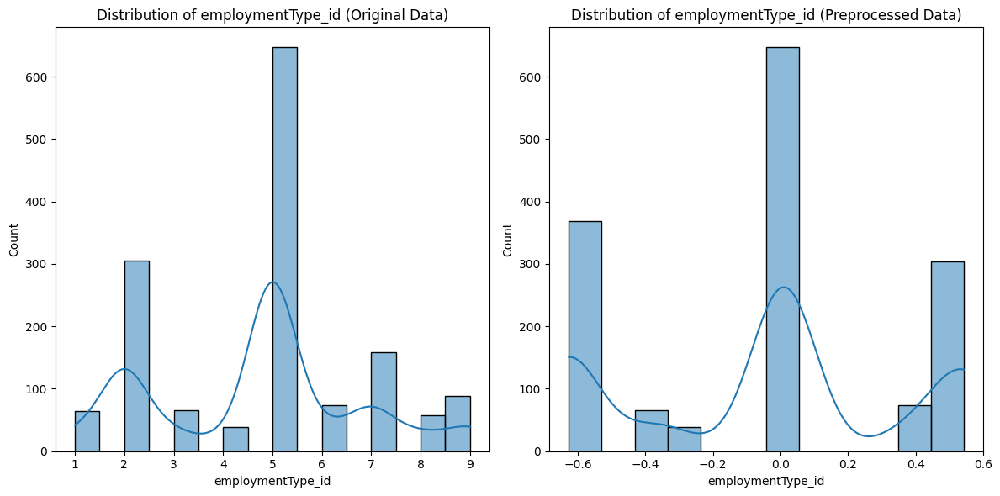

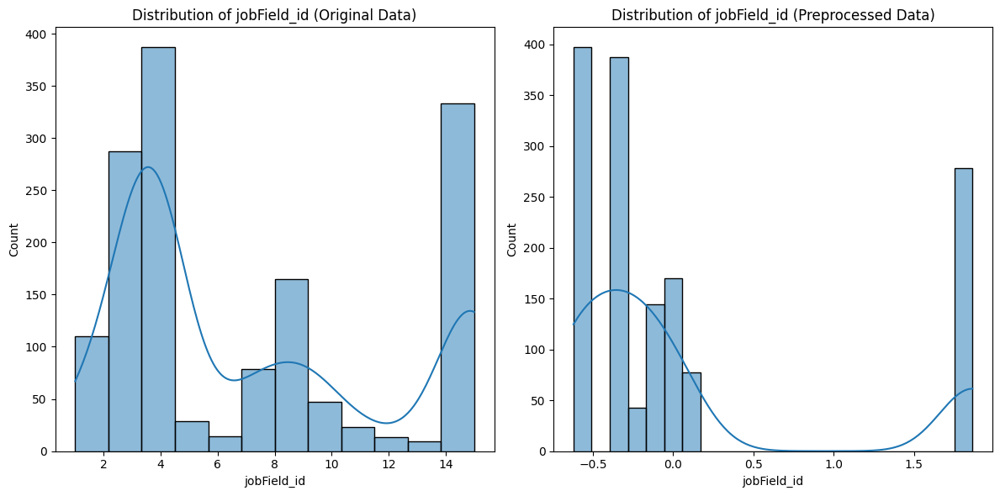

Column 'work_hours_prior_test' not found in both dataframes.


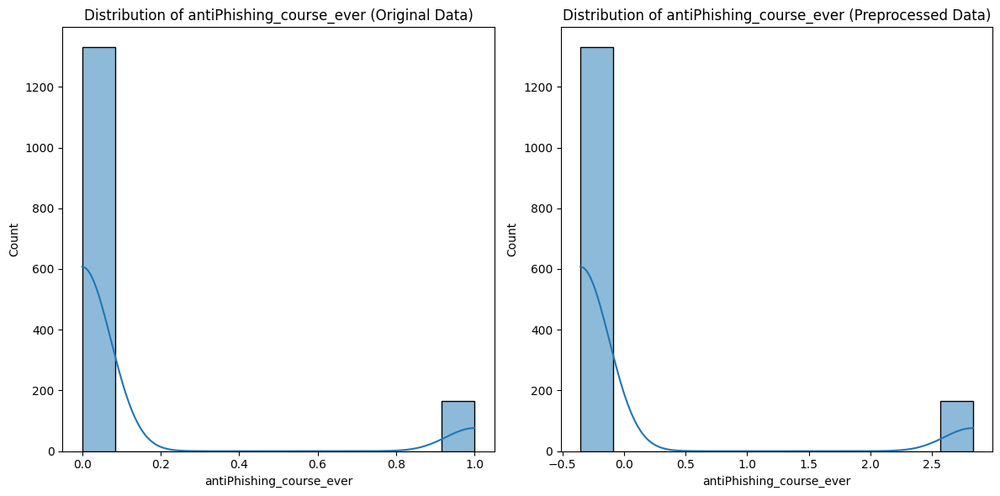

Column 'id_1' not found in both dataframes.
Column 'id_2' not found in both dataframes.
Column 'id_3' not found in both dataframes.
Column 'id_4' not found in both dataframes.
Column 'id_5' not found in both dataframes.
Column 'id_6' not found in both dataframes.
Column 'id_7' not found in both dataframes.
Column 'id_8' not found in both dataframes.
Column 'id_9' not found in both dataframes.
Column 'id_10' not found in both dataframes.
Column 'time_taken_to_answer_1' not found in both dataframes.
Column 'time_taken_to_answer_2' not found in both dataframes.
Column 'time_taken_to_answer_3' not found in both dataframes.
Column 'time_taken_to_answer_4' not found in both dataframes.
Column 'time_taken_to_answer_5' not found in both dataframes.
Column 'time_taken_to_answer_6' not found in both dataframes.
Column 'time_taken_to_answer_7' not found in both dataframes.
Column 'time_taken_to_answer_8' not found in both dataframes.
Column 'time_taken_to_answer_9' not found in both dataframes.
C

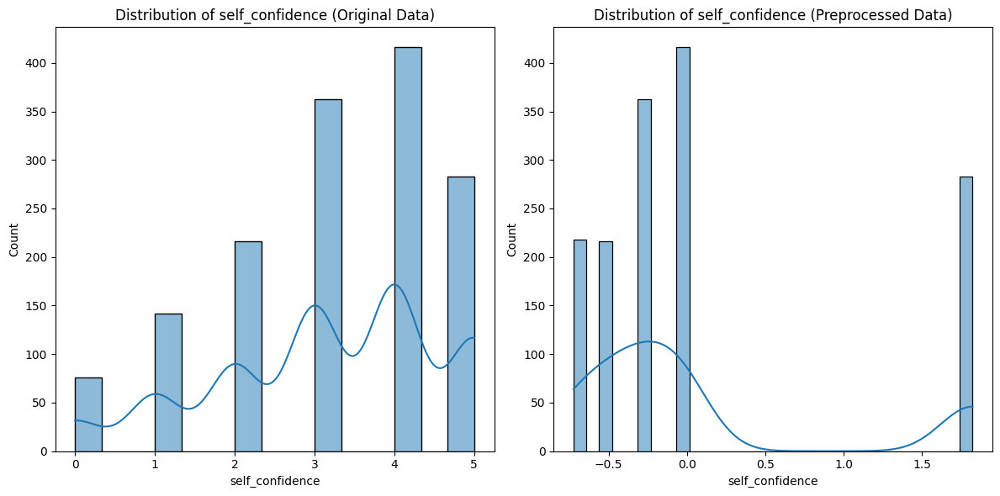

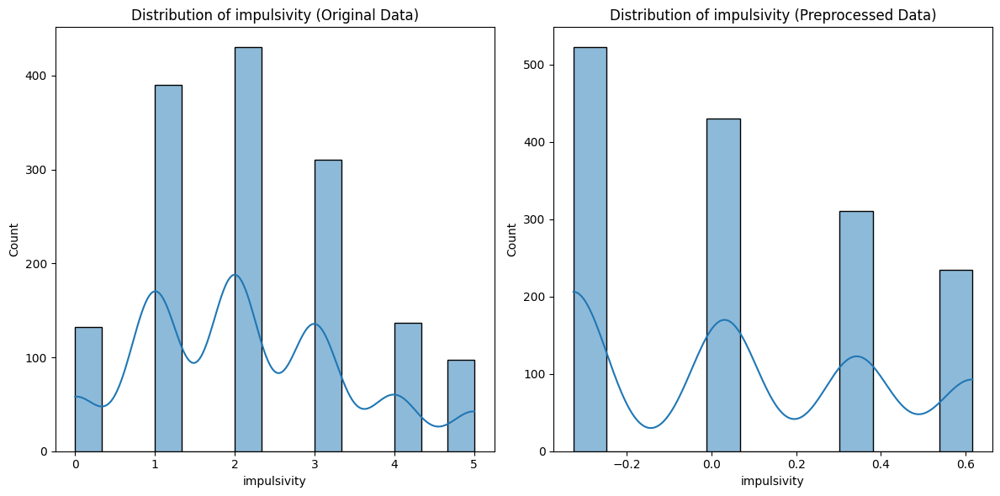

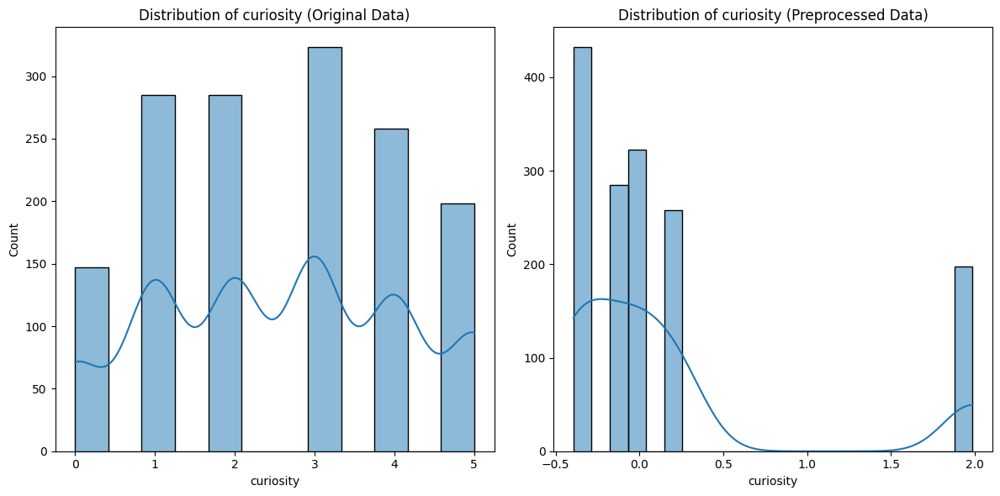

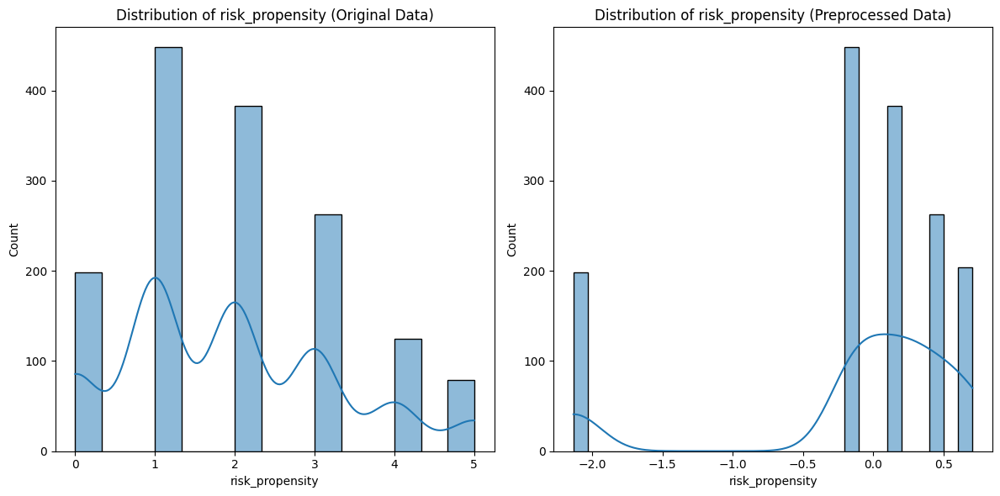

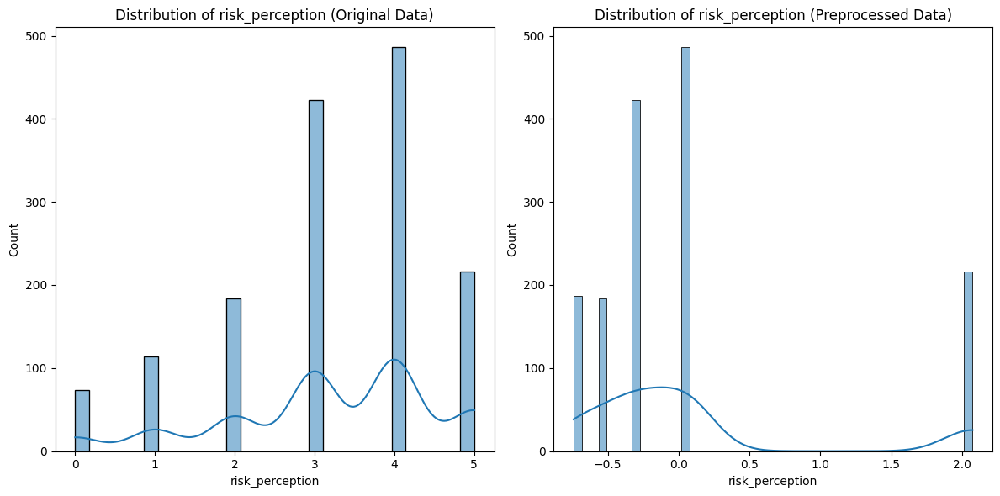

...

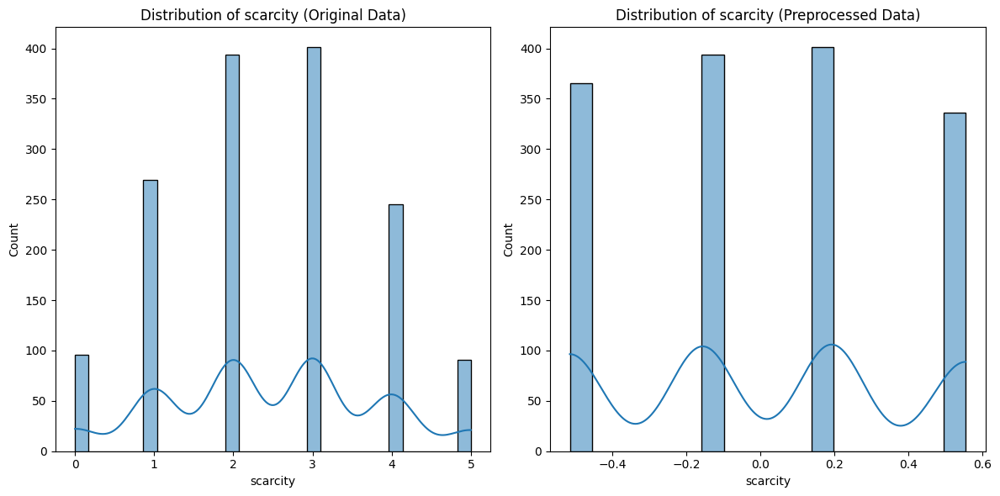

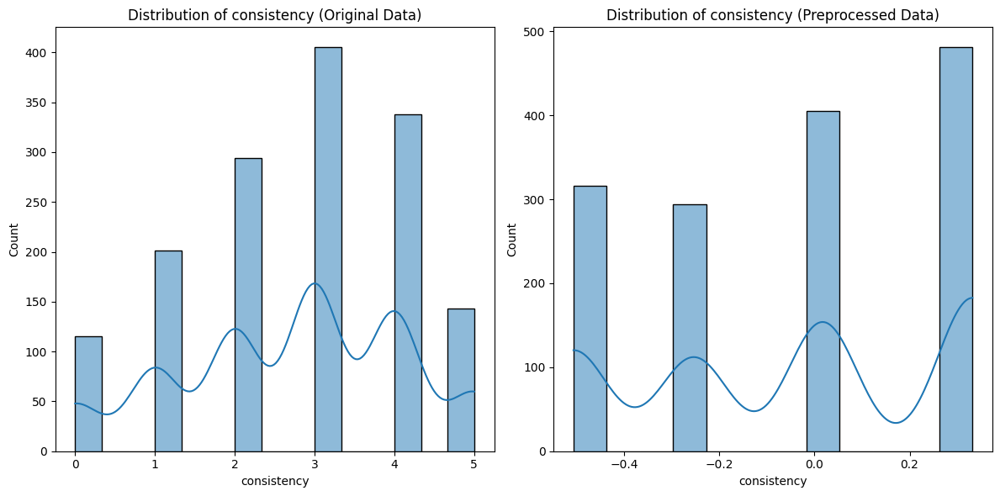

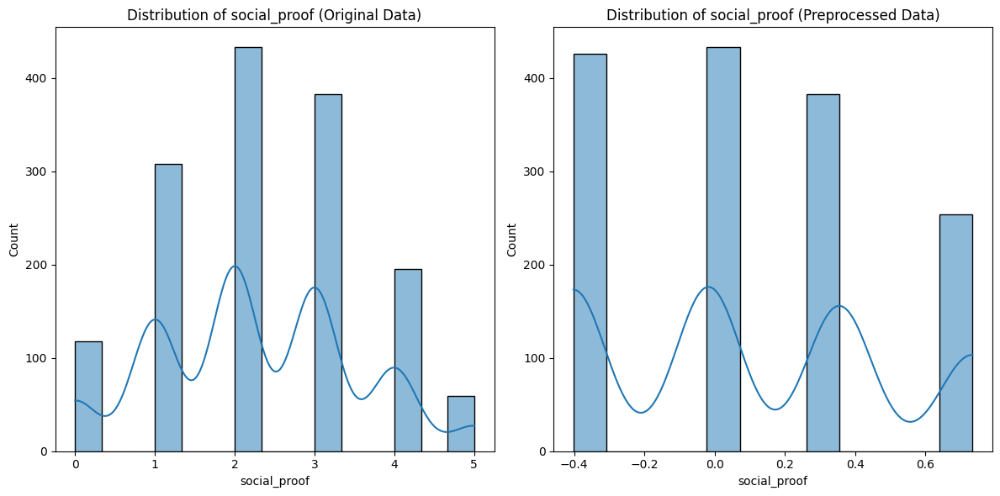

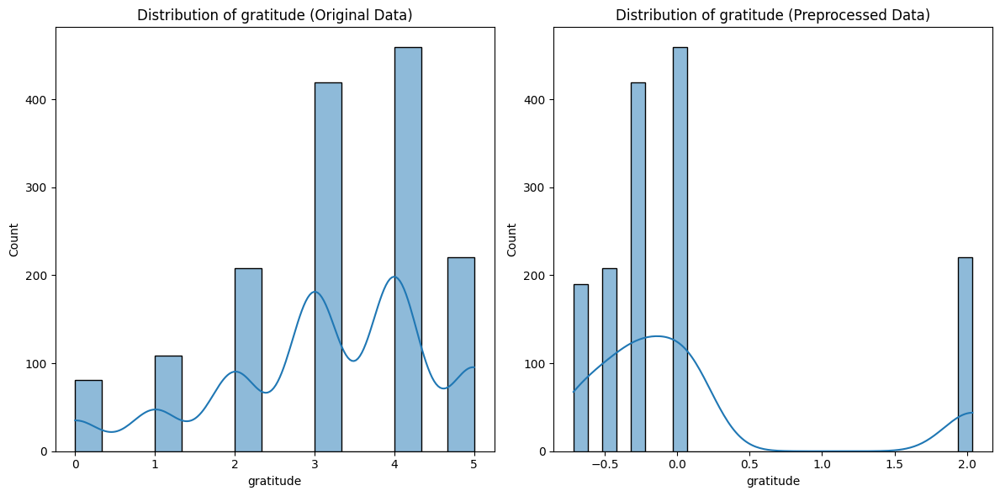

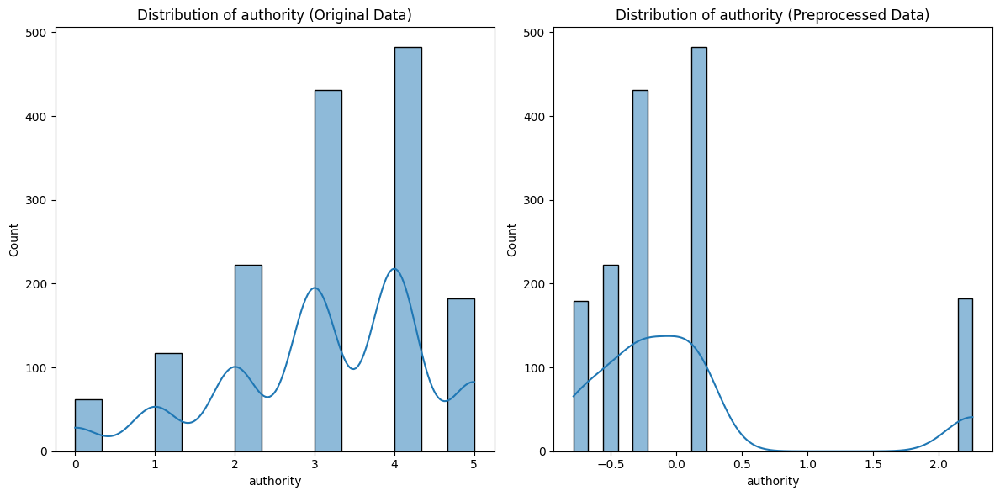

Column 'result' not found in both dataframes.
Column 'education_job_interaction' not found in both dataframes.
Column 'region' not found in both dataframes.


In [7]:
# prompt: write a code to compare the distribution of each column in both df_actual (dataset before preprocessing) and df_copy (dataset after preprocessing) using informative visualizations

import matplotlib.pyplot as plt
import seaborn as sns

def compare_distributions(df_actual, df_copy):
  """
  Compares the distribution of each column in two dataframes using histograms.

  Args:
    df_original: The original dataframe.
    df_copy: The preprocessed dataframe.
  """
  for col in df_actual.columns:
    if col in df_copy.columns:  # Check if the column exists in both dataframes
      plt.figure(figsize=(12, 6))

      plt.subplot(1, 2, 1)
      sns.histplot(df_actual[col], kde=True)
      plt.title(f'Distribution of {col} (Original Data)')

      plt.subplot(1, 2, 2)
      sns.histplot(df_copy[col], kde=True)
      plt.title(f'Distribution of {col} (Preprocessed Data)')

      plt.tight_layout()
      plt.show()
    else:
      print(f"Column '{col}' not found in both dataframes.")


# Assuming df_actual and df_copy are already defined from your previous code
compare_distributions(df_original, df_copy)

In [8]:
#df_copy = df_copy.drop(columns=['result'])
#df_copy.info()

# **Clustering**

## Dimensionality Reduction (PCA)

In [9]:
columns_with_nans = df_copy.columns[df_copy.isna().any()].tolist()
print("Columns with NaN values:", columns_with_nans)

Columns with NaN values: []


Number of components to explain 90% of the variance: 20


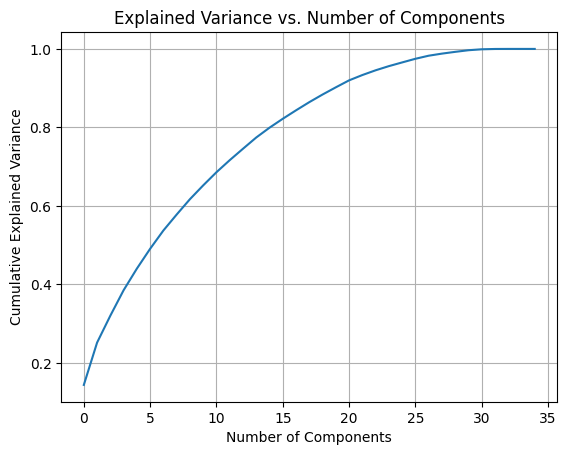

[[ 0.91657386  0.58426002 -1.3922021  ...  0.80682524 -0.37922046
   0.98909195]
 [-0.26164068 -2.10333196  0.83421733 ... -0.15877998  0.20170936
  -0.42918224]
 [ 1.95586582 -2.34299773 -0.75864132 ...  1.03875814 -0.23879068
   0.88214511]
 ...
 [-1.80903208  1.44424528  0.17078498 ... -0.18849329  0.0859249
   0.49236031]
 [ 5.07885798  0.29699928  0.93204142 ...  0.42297023 -0.756348
  -0.62092246]
 [-2.01842741  0.8833453   1.12084879 ...  0.07123278  0.36823697
   0.17480569]]


In [10]:
# Apply PCA without specifying n_components to analyze all components
pca = PCA()
pca.fit(df_copy)  # Replace df with your standardized dataset

# Calculate cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# Find the number of components that explain at least 90-95% of the variance
n_components = np.argmax(cumulative_variance >= 0.90) + 1  # Adjust the threshold as needed
print(f"Number of components to explain 90% of the variance: {n_components}")

# Plot cumulative explained variance to visualize component selection
import matplotlib.pyplot as plt
plt.plot(cumulative_variance)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs. Number of Components')
plt.grid(True)
plt.show()

pca = PCA(n_components=20)  # Choose based on explained variance
pca_features = pca.fit_transform(df_copy)
print(pca_features)


## Traditional Clustering with PCA

### Kmeans


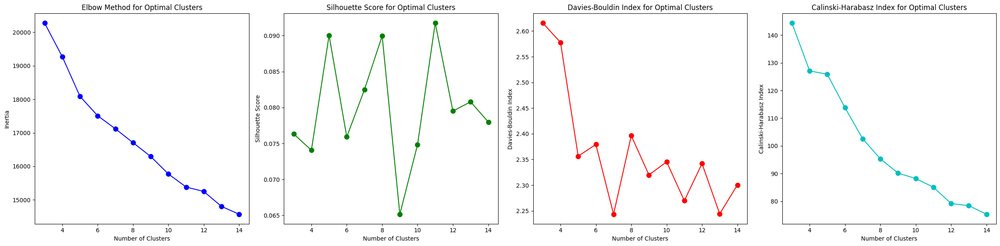

Optimal number of clusters based on silhouette score: 11
Silhouette Score for optimal clustering: 0.07742476535322002
Calinski-Harabasz Index for optimal clustering: 86.30077661162234


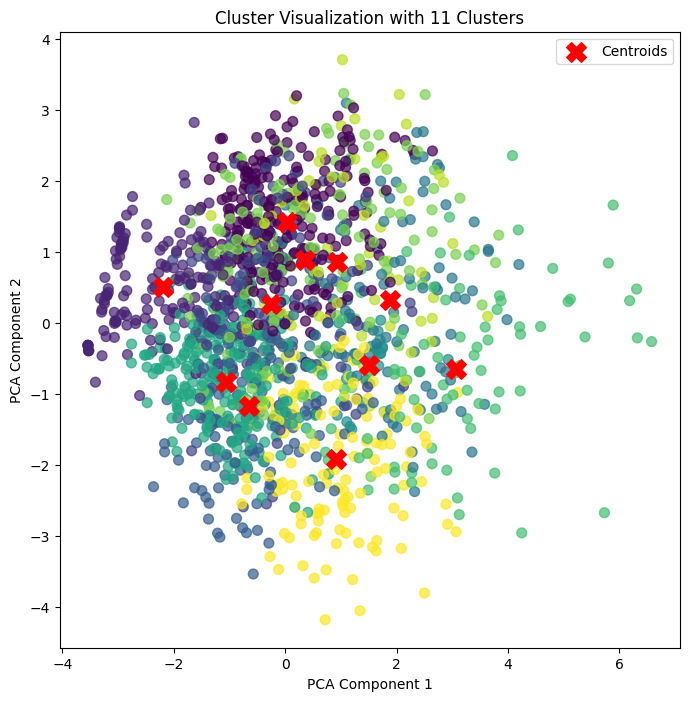

In [11]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import numpy as np

# Define range for the number of clusters
cluster_range = range(3, 15)
inertia_values = []
silhouette_scores = []
db_scores = []
calinski_scores = []

# Loop over the range to calculate metrics for each number of clusters
for n_clusters in cluster_range:
    # Create KMeans without a fixed random state for freely changing centroids
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans_labels = kmeans.fit_predict(pca_features)

    # Calculate inertia (for Elbow Method)
    inertia_values.append(kmeans.inertia_)

    # Calculate silhouette score
    silhouette_avg = silhouette_score(pca_features, kmeans_labels)
    silhouette_scores.append(silhouette_avg)

    # Calculate Davies-Bouldin score
    db_index = davies_bouldin_score(pca_features, kmeans_labels)
    db_scores.append(db_index)

    # Calculate Calinski-Harabasz Index
    calinski_harabasz = calinski_harabasz_score(pca_features, kmeans_labels)
    calinski_scores.append(calinski_harabasz)

# Plot the Elbow Method, Silhouette Scores, Davies-Bouldin Index, and Calinski-Harabasz Index
plt.figure(figsize=(24, 6))

# Plot for the Elbow Method
plt.subplot(1, 4, 1)
plt.plot(cluster_range, inertia_values, 'bo-', markersize=8)
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal Clusters')

# Plot for Silhouette Scores
plt.subplot(1, 4, 2)
plt.plot(cluster_range, silhouette_scores, 'go-', markersize=8)
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Optimal Clusters')

# Plot for Davies-Bouldin Index
plt.subplot(1, 4, 3)
plt.plot(cluster_range, db_scores, 'ro-', markersize=8)
plt.xlabel('Number of Clusters')
plt.ylabel('Davies-Bouldin Index')
plt.title('Davies-Bouldin Index for Optimal Clusters')

# Plot for Calinski-Harabasz Index
plt.subplot(1, 4, 4)
plt.plot(cluster_range, calinski_scores, 'co-', markersize=8)
plt.xlabel('Number of Clusters')
plt.ylabel('Calinski-Harabasz Index')
plt.title('Calinski-Harabasz Index for Optimal Clusters')

plt.tight_layout()
plt.show()

# Choose the optimal number of clusters based on the highest silhouette score
optimal_clusters = cluster_range[silhouette_scores.index(max(silhouette_scores))]
print(f"Optimal number of clusters based on silhouette score: {optimal_clusters}")

# Final clustering with the optimal number of clusters
kmeans_optimal = KMeans(n_clusters=optimal_clusters)
kmeans_labels_optimal = kmeans_optimal.fit_predict(pca_features)
silhouette_kmeans_optimal = silhouette_score(pca_features, kmeans_labels_optimal)
calinski_kmeans_optimal = calinski_harabasz_score(pca_features, kmeans_labels_optimal)
print(f"Silhouette Score for optimal clustering: {silhouette_kmeans_optimal}")
print(f"Calinski-Harabasz Index for optimal clustering: {calinski_kmeans_optimal}")

# Plotting the final clusters
plt.figure(figsize=(8, 8))
plt.scatter(pca_features[:, 0], pca_features[:, 1], c=kmeans_labels_optimal, cmap='viridis', s=50, alpha=0.7)
centers = kmeans_optimal.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=200, marker='X', label='Centroids')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title(f'Cluster Visualization with {optimal_clusters} Clusters')
plt.legend()
plt.show()


In [12]:
# # Clustering using KMeans
# kmeans = KMeans(n_clusters=3, random_state=42)
# kmeans_labels = kmeans.fit_predict(pca_features)
# silhouette_kmeans = silhouette_score(pca_features, kmeans_labels)
# print()
# print(f"Silhouette Score for KMeans clustering: {silhouette_kmeans}")
# kmeans_score=silhouette_kmeans
# df_copy.shape

### Aggoloromative

In [13]:
# Clustering using Agglomerative Clustering
agg_clustering = AgglomerativeClustering(n_clusters=3)
agg_labels = agg_clustering.fit_predict(pca_features)
silhouette_agg = silhouette_score(pca_features, agg_labels)

### DBScan

In [14]:
# Standardize the data
scaled_features = StandardScaler().fit_transform(pca_features)

# Clustering using DBSCAN
dbscan = DBSCAN(eps=0.1, min_samples=2)
dbscan_labels = dbscan.fit_predict(scaled_features)

# Check for valid clusters and compute silhouette score
if len(set(dbscan_labels)) > 1 and -1 not in set(dbscan_labels):
    silhouette_dbscan = silhouette_score(scaled_features, dbscan_labels)
else:
    silhouette_dbscan = -1

print(f"Silhouette Score: {silhouette_dbscan}")



Silhouette Score: -1


### Comparison Between Traditional Clustering Approaches

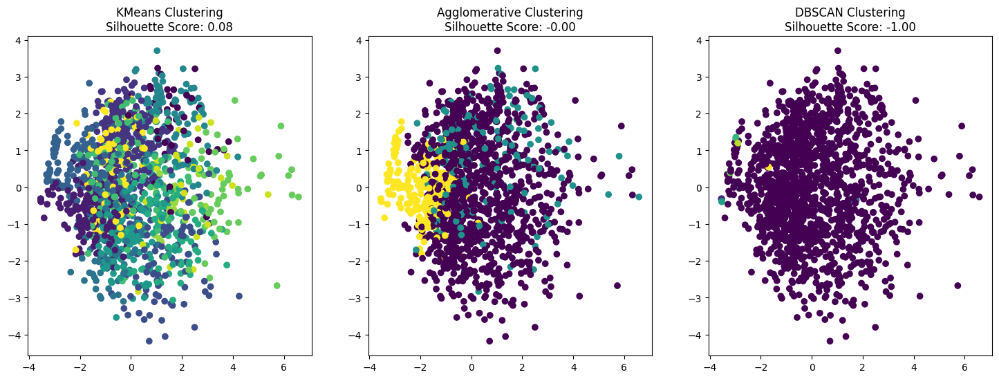

In [15]:
# Plot clustering results
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

axs[0].scatter(pca_features[:, 0], pca_features[:, 1], c=kmeans_labels)
axs[0].set_title(f'KMeans Clustering\nSilhouette Score: {silhouette_kmeans_optimal:.2f}')

axs[1].scatter(pca_features[:, 0], pca_features[:, 1], c=agg_labels)
axs[1].set_title(f'Agglomerative Clustering\nSilhouette Score: {silhouette_agg:.2f}')

axs[2].scatter(pca_features[:, 0], pca_features[:, 1], c=dbscan_labels)
axs[2].set_title(f'DBSCAN Clustering\nSilhouette Score: {silhouette_dbscan:.2f}')

plt.show()

# **Deep Clustering**

## Self-Organizing Maps (SOMs)

**Why This Method is Reliable**

*   Normalization:

Ensures metrics are on a comparable scale, preventing dominance by one metric due to its magnitude.

*   Inverse for Davies-Bouldin:

Since lower Davies-Bouldin is better, the inverse normalization ensures consistency.



*   Weighted Aggregation:

Equal weights are a starting point. Adjustments can be made based on domain knowledge.


**References:**

Jain, A. K., Murty, M. N., & Flynn, P. J. (1999). Data clustering: A review. ACM Computing Surveys, 31(3), 264-323.


Halkidi, M., Batistakis, Y., & Vazirgiannis, M. (2001). On clustering validation techniques. Journal of Intelligent Information Systems, 17(2-3), 107-145.


Milligan, G. W., & Cooper, M. C. (1985). An examination of procedures for determining the number of clusters in a data set. Psychometrika, 50(2), 159-179.


Deb, K., Pratap, A., Agarwal, S., & Meyarivan, T. (2002). A fast and elitist multi-objective genetic algorithm: NSGA-II. IEEE Transactions on Evolutionary Computation, 6(2), 182-197.

In [ ]:
!pip install minisom
# !pip install umap-learn


  Preparing metadata (setup.py) ... done
  Created wheel for minisom: filename=MiniSom-2.3.5-py3-none-any.whl size=12031 sha256=33f3997b064d817b54046fbf1bad5e652ab522ac6d612706fea682f3678462f1
  Stored in directory: /root/.cache/pip/wheels/19/db/95/5e53bc2b88a328217fdf9f2886cafbe86b0df274f4b601f572
Successfully built minisom


Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


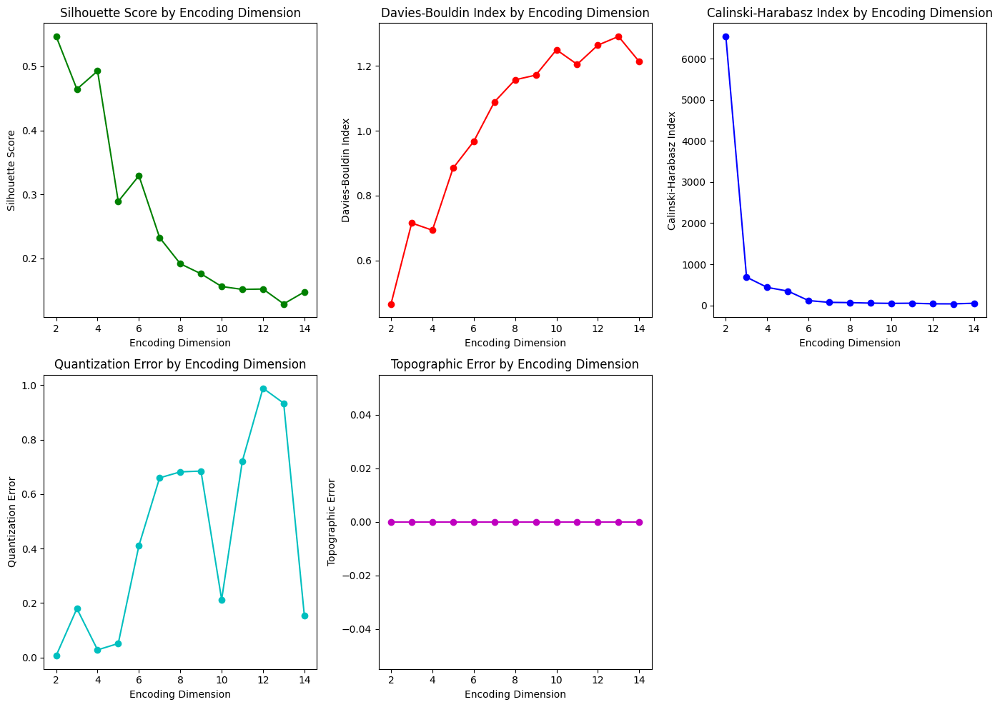

Best Encoding Dimension: 2
Best Combined Score: 1.0000
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.5467
  Davies-Bouldin Index: 0.4662
  Calinski-Harabasz Index: 6544.2224
  Quantization Error: 0.0067
  Topographic Error: 0.0000
Best K: 7
Best Clustering Metrics for K=7:
  - Silhouette Score: 0.3354
  - Davies-Bouldin Score: 0.7656
  - Calinski-Harabasz Index: 1185.4072


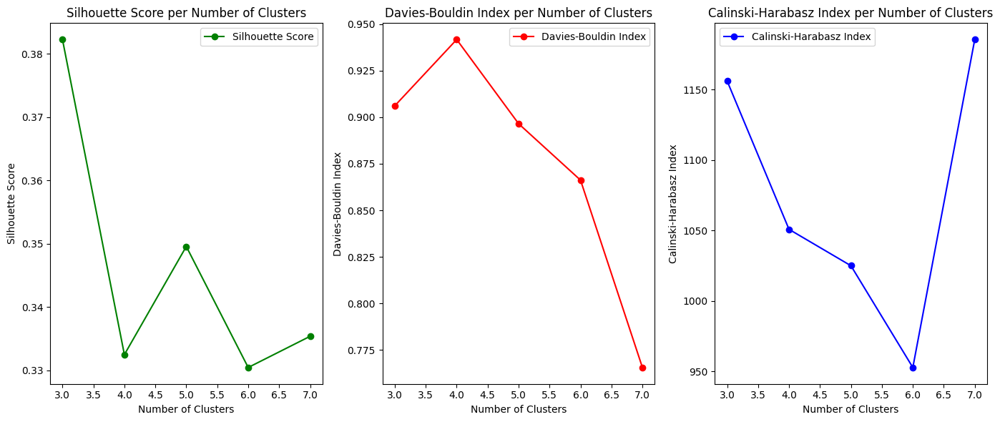

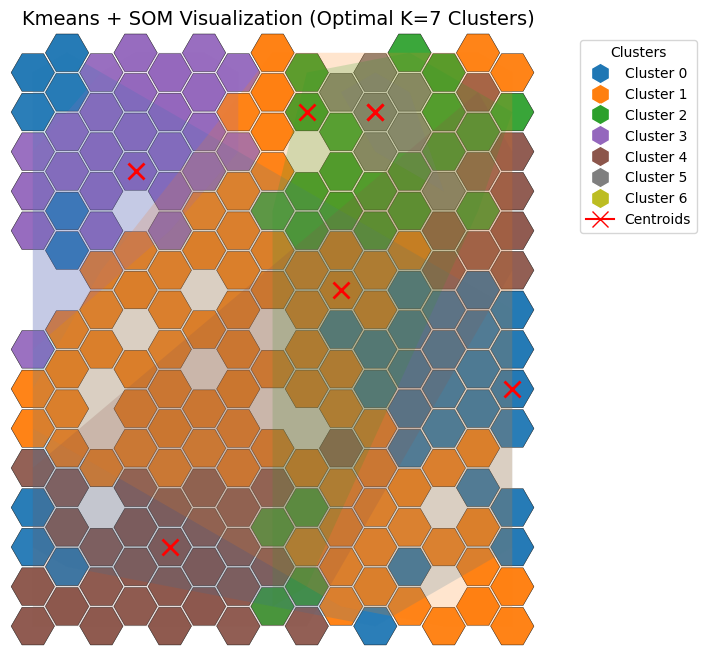

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[ 4.24051    2.0005827]
 [ 4.957173   3.3074453]
 [ 6.497574   4.039421 ]
 [ 3.0857673  3.2544665]
 [ 6.4297667  2.08416  ]
 [ 9.127045   4.7186933]
 [20.981504   8.360409 ]]
Kmeans Labels: [0 3 3 ... 2 0 2]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


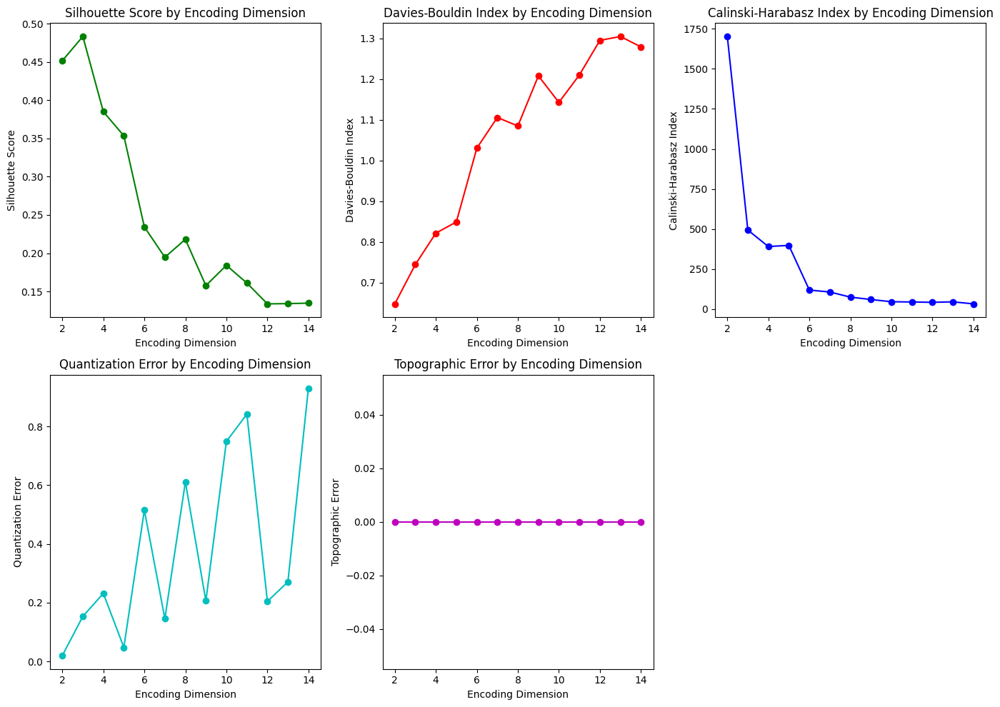

Best Encoding Dimension: 2
Best Combined Score: 0.9701
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.4515
  Davies-Bouldin Index: 0.6480
  Calinski-Harabasz Index: 1701.5247
  Quantization Error: 0.0197
  Topographic Error: 0.0000
Best K: 7
Best Clustering Metrics for K=7:
  - Silhouette Score: 0.4455
  - Davies-Bouldin Score: 0.5559
  - Calinski-Harabasz Index: 4184.5400


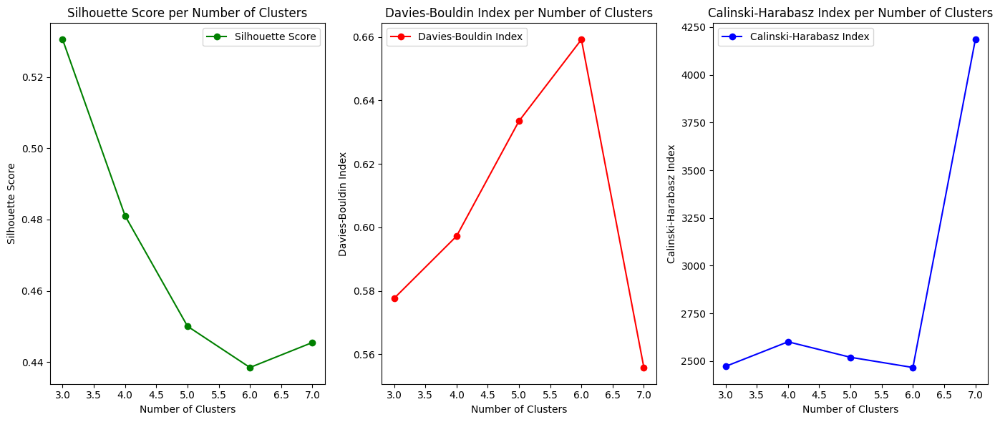

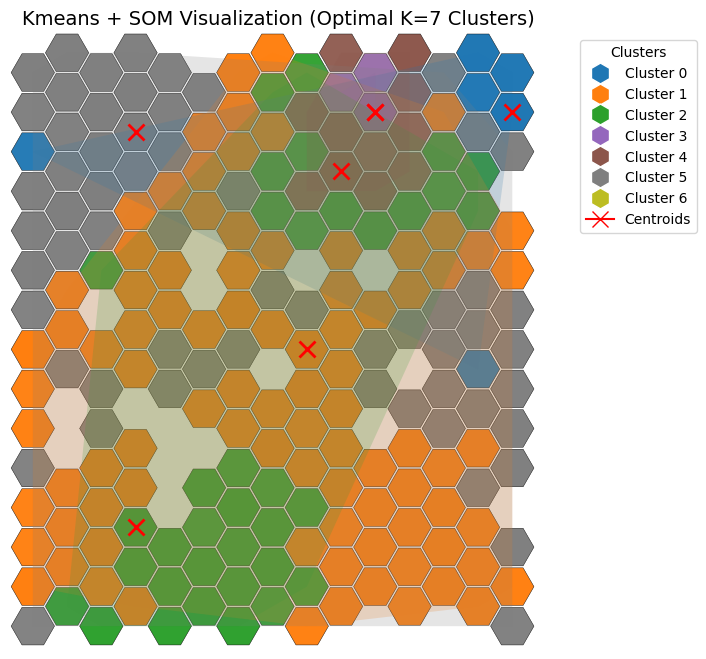

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[ 2.4395552  4.179889 ]
 [ 4.8773503  6.4164615]
 [ 6.073933   7.6860037]
 [10.5022955 12.648639 ]
 [ 7.7270722  9.44031  ]
 [ 3.7461667  5.2597036]
 [18.816038  25.73203  ]]
Kmeans Labels: [5 1 5 ... 2 5 4]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


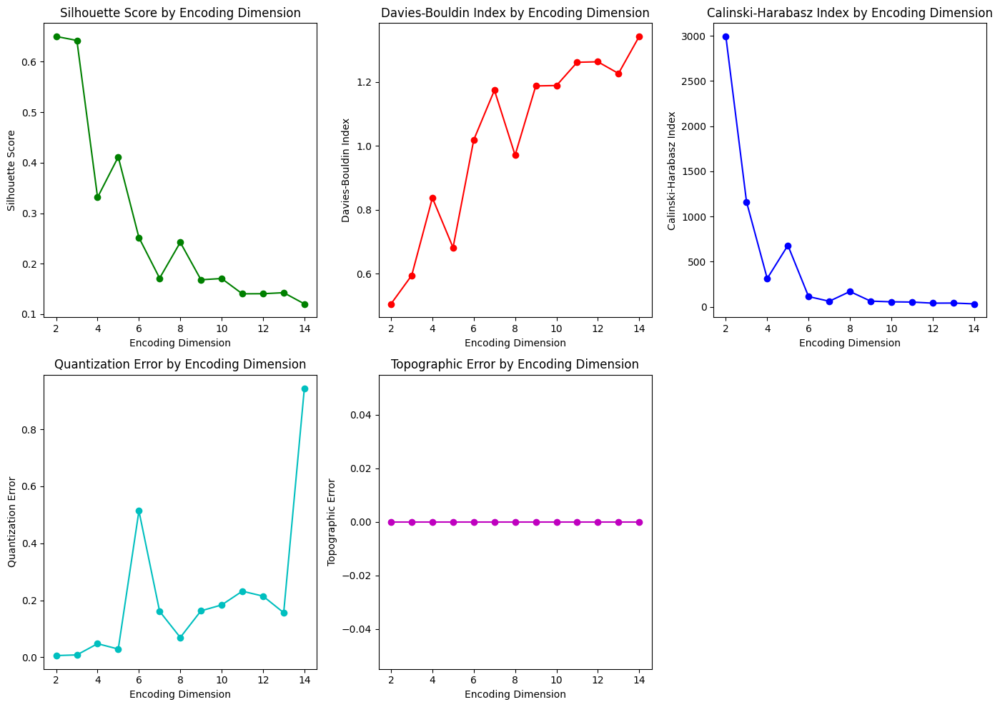

Best Encoding Dimension: 2
Best Combined Score: 1.0000
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.6500
  Davies-Bouldin Index: 0.5061
  Calinski-Harabasz Index: 2992.4818
  Quantization Error: 0.0059
  Topographic Error: 0.0000
Best K: 7
Best Clustering Metrics for K=7:
  - Silhouette Score: 0.4711
  - Davies-Bouldin Score: 0.5596
  - Calinski-Harabasz Index: 3361.5922


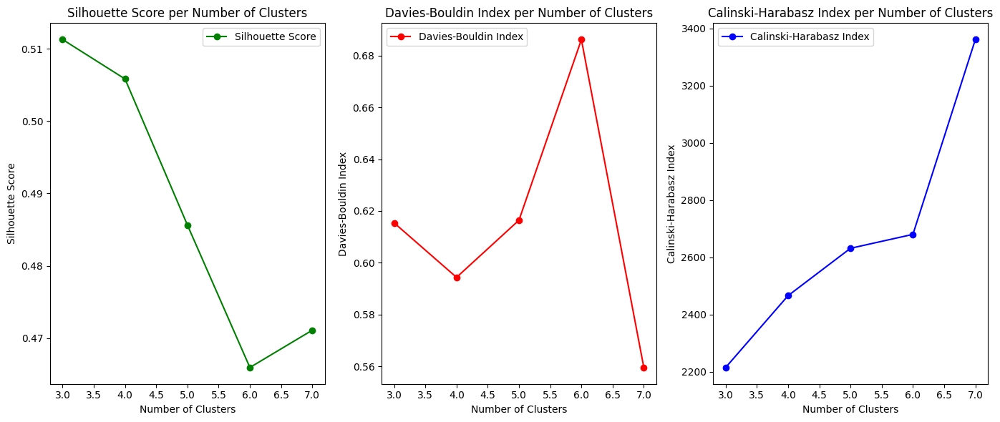

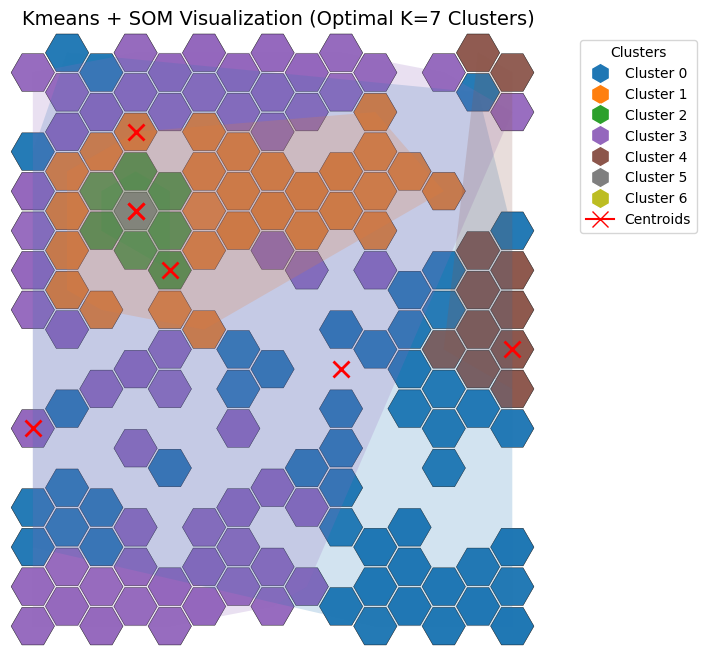

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[ 5.5386891e+00  5.4467328e-02]
 [ 7.9251776e+00  1.0509990e-02]
 [ 9.9515371e+00 -9.6857548e-08]
 [ 6.5831704e+00  4.6849977e-02]
 [ 4.4263172e+00  2.8529239e-01]
 [ 1.2912191e+01  0.0000000e+00]
 [ 2.0180174e+01  0.0000000e+00]]
Kmeans Labels: [4 3 3 ... 1 4 1]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


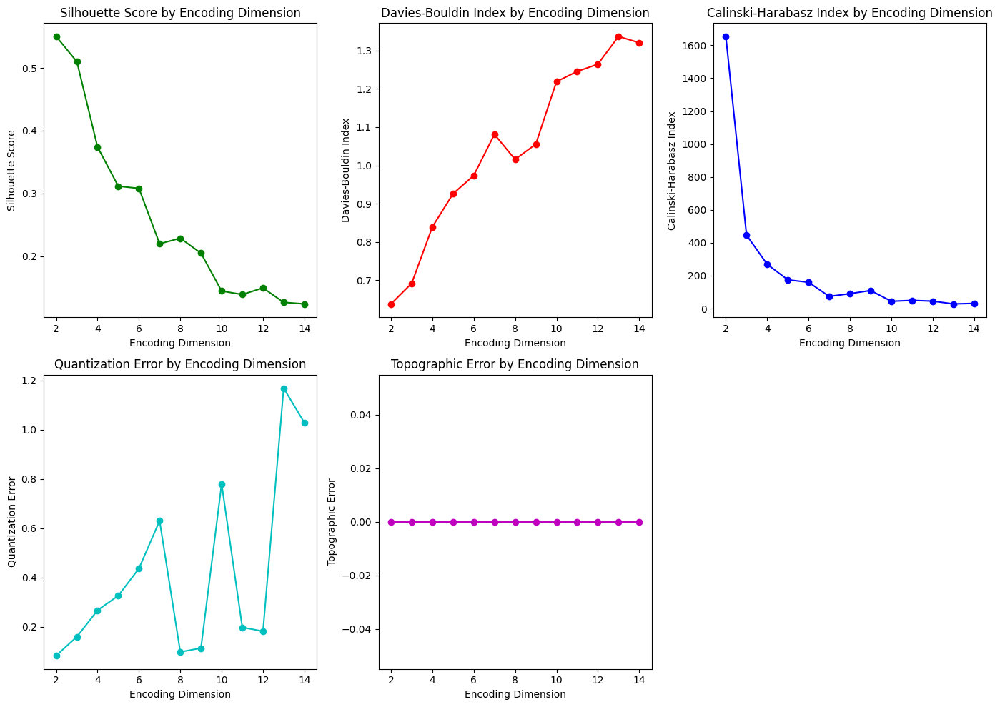

Best Encoding Dimension: 2
Best Combined Score: 1.0000
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.5500
  Davies-Bouldin Index: 0.6382
  Calinski-Harabasz Index: 1653.5589
  Quantization Error: 0.0838
  Topographic Error: 0.0000
Best K: 7
Best Clustering Metrics for K=7:
  - Silhouette Score: 0.5355
  - Davies-Bouldin Score: 0.4665
  - Calinski-Harabasz Index: 5650.6161


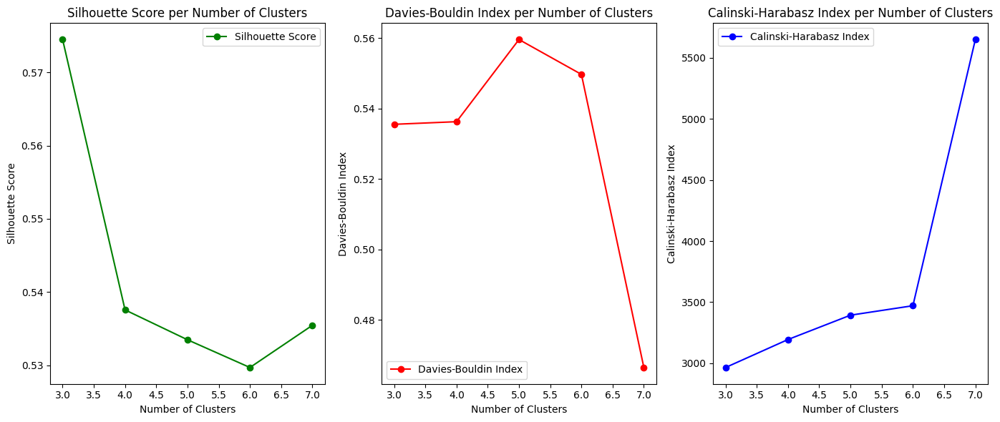

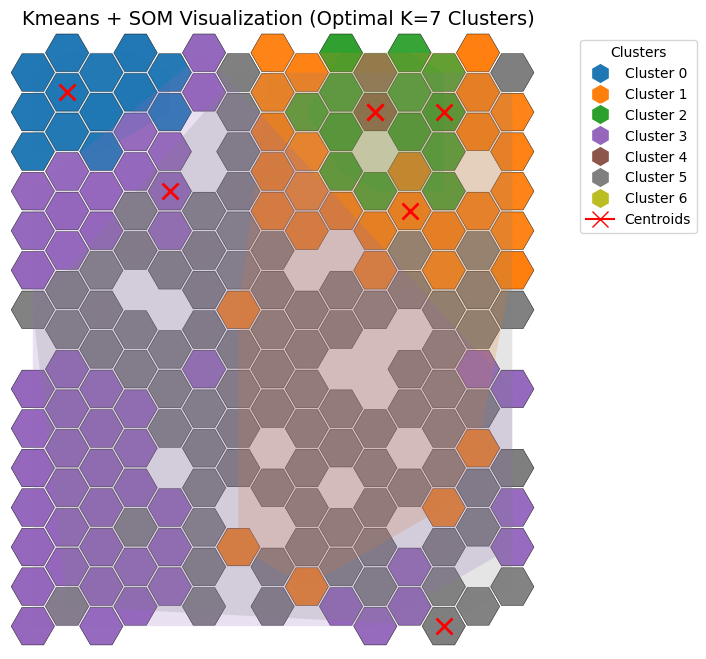

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[ 6.808308  0.      ]
 [11.658581  0.      ]
 [14.727796  0.      ]
 [ 8.306729  0.      ]
 [18.902489  0.      ]
 [ 9.792537  0.      ]
 [32.155083  0.      ]]
Kmeans Labels: [3 3 3 ... 1 0 2]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


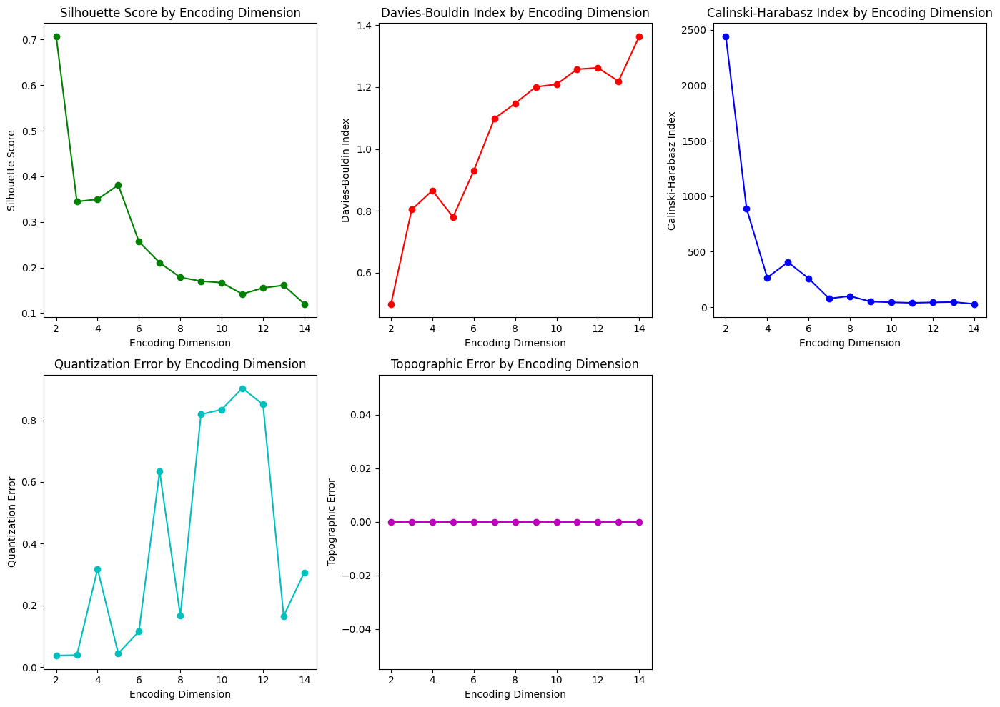

Best Encoding Dimension: 2
Best Combined Score: 1.0000
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.7069
  Davies-Bouldin Index: 0.4994
  Calinski-Harabasz Index: 2440.9211
  Quantization Error: 0.0371
  Topographic Error: 0.0000
Best K: 4
Best Clustering Metrics for K=4:
  - Silhouette Score: 0.4069
  - Davies-Bouldin Score: 0.7218
  - Calinski-Harabasz Index: 1957.6409


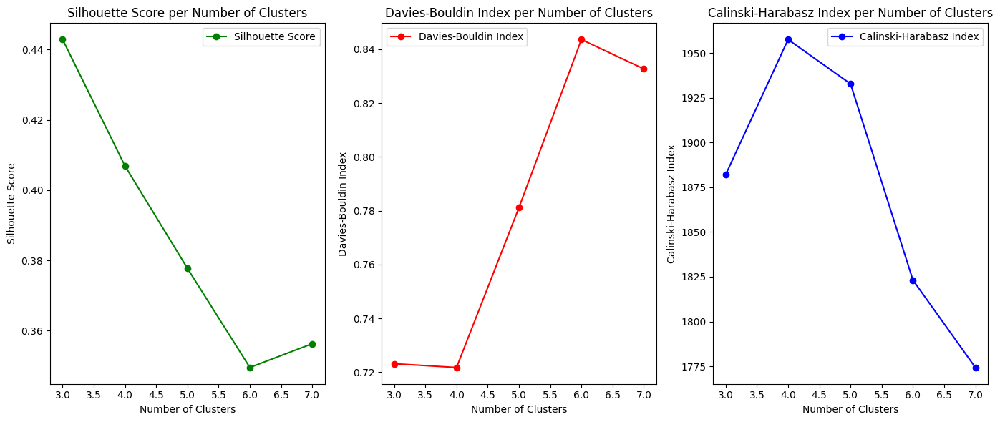

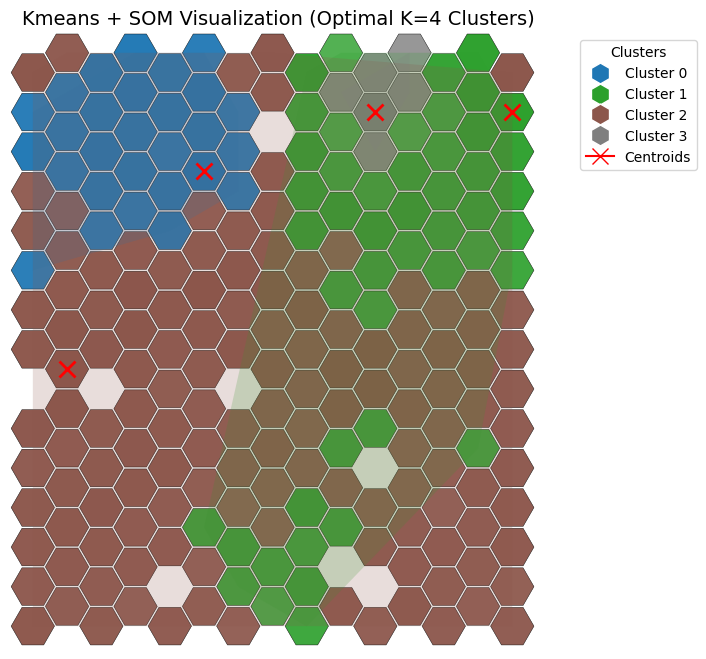

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[2.379591  2.2876902]
 [4.9558144 4.401715 ]
 [3.7487168 3.2038069]
 [7.688482  6.7606807]]
Kmeans Labels: [0 2 0 ... 1 0 1]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


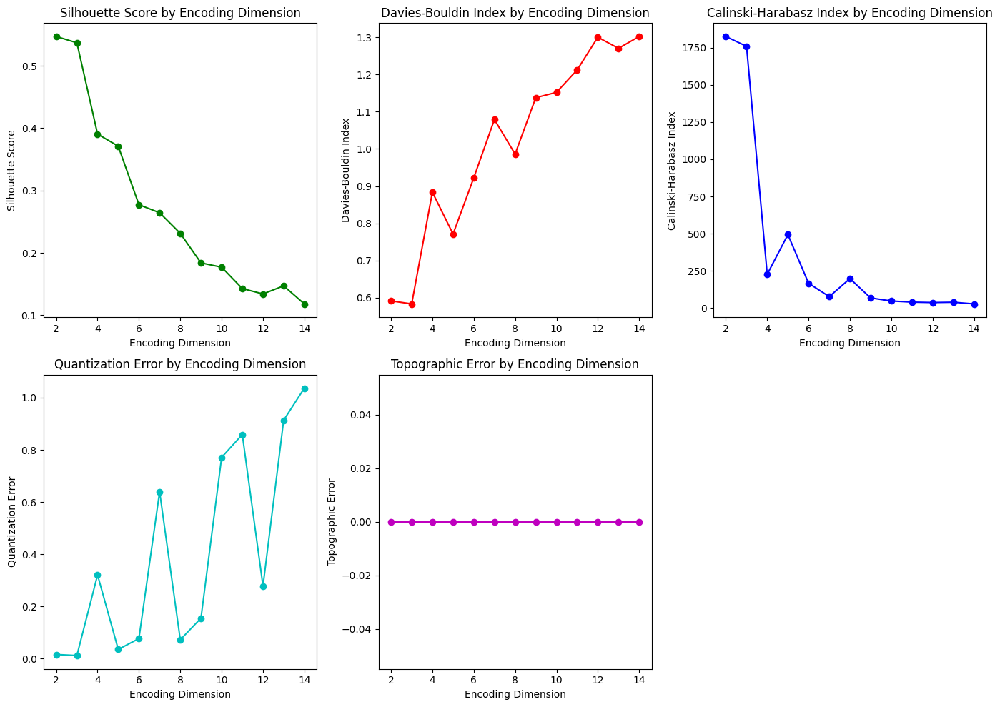

Best Encoding Dimension: 2
Best Combined Score: 0.9961
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.5471
  Davies-Bouldin Index: 0.5916
  Calinski-Harabasz Index: 1824.6975
  Quantization Error: 0.0162
  Topographic Error: 0.0000
Best K: 5
Best Clustering Metrics for K=5:
  - Silhouette Score: 0.5450
  - Davies-Bouldin Score: 0.4388
  - Calinski-Harabasz Index: 3872.3415


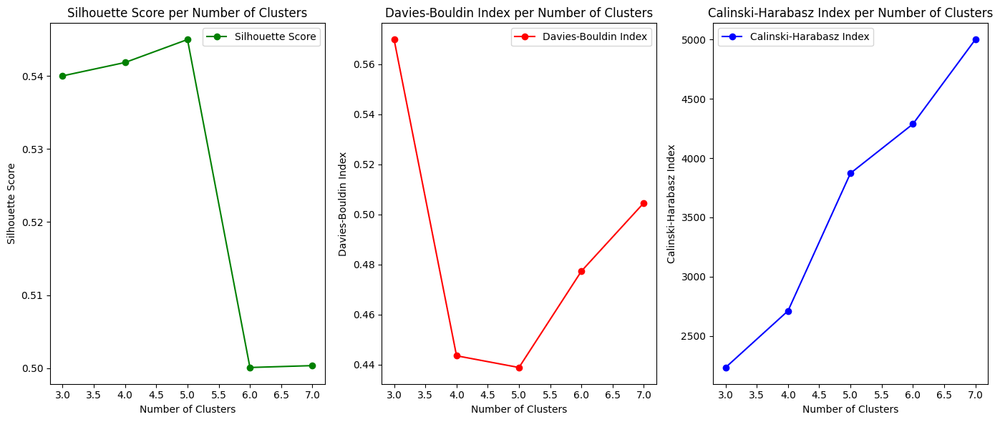

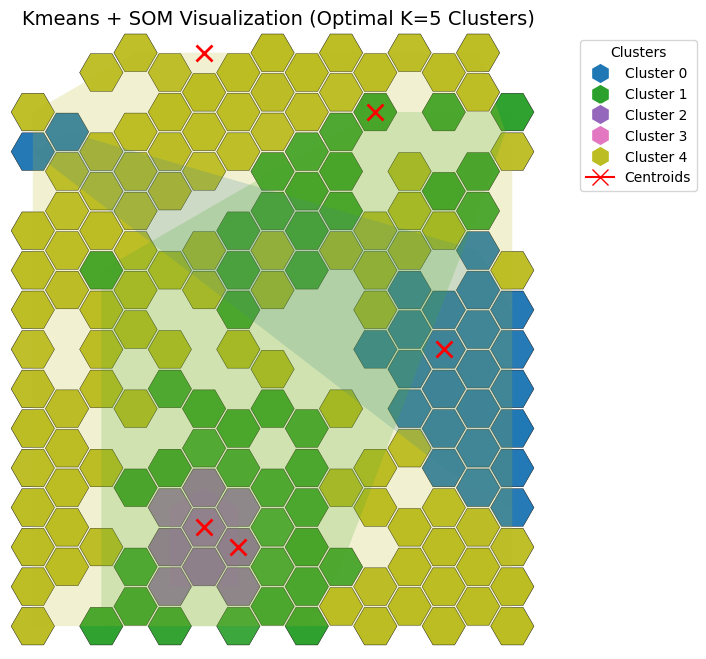

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[4.8365960e+00 6.7312300e-02]
 [8.0965033e+00 2.9454419e-02]
 [1.1679484e+01 3.7763044e-03]
 [2.5348070e+01 3.8662002e+00]
 [6.3711653e+00 3.9291270e-02]]
Kmeans Labels: [4 4 4 ... 1 0 1]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


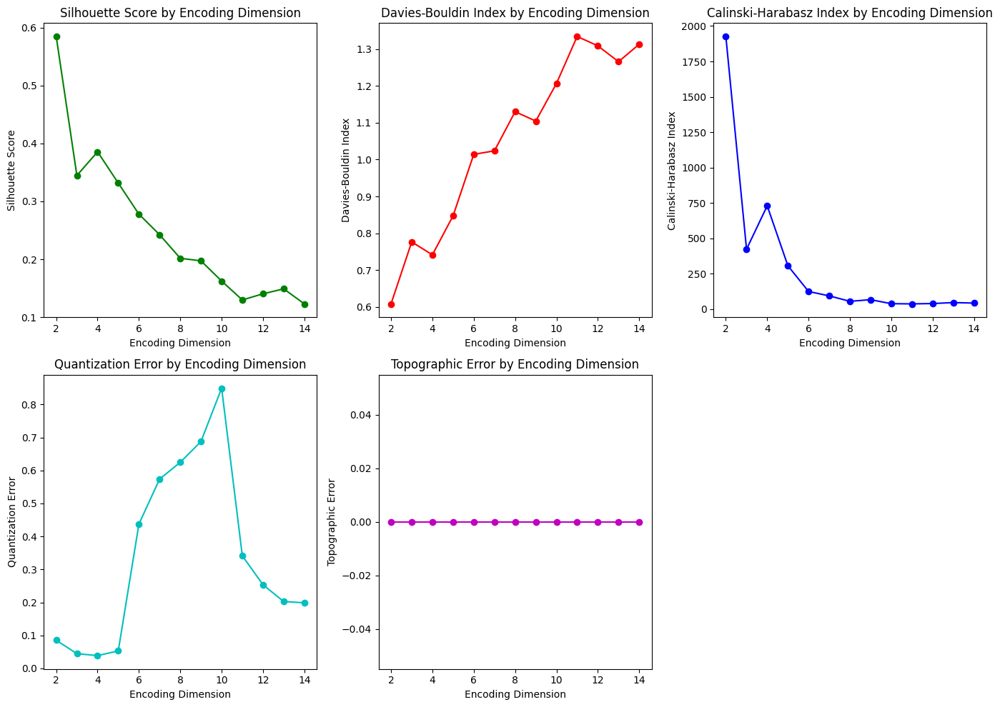

Best Encoding Dimension: 2
Best Combined Score: 1.0000
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.5849
  Davies-Bouldin Index: 0.6082
  Calinski-Harabasz Index: 1926.5073
  Quantization Error: 0.0855
  Topographic Error: 0.0000
Best K: 3
Best Clustering Metrics for K=3:
  - Silhouette Score: 0.4830
  - Davies-Bouldin Score: 0.6704
  - Calinski-Harabasz Index: 1988.3854


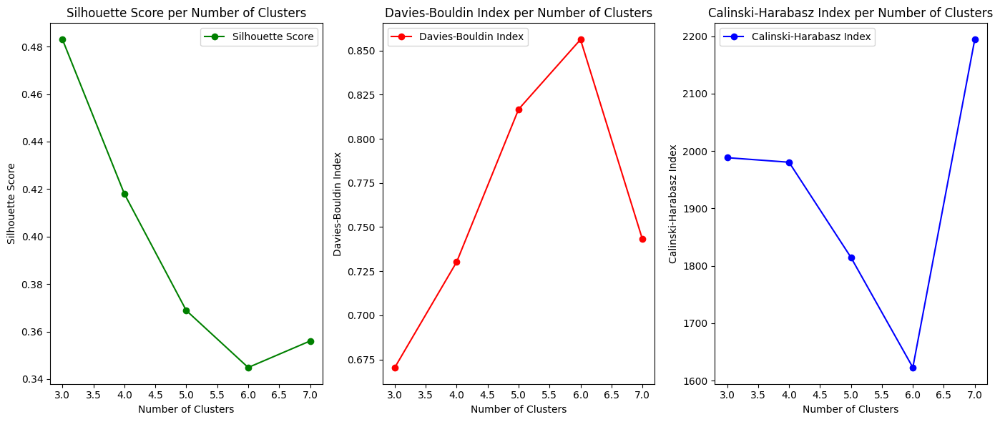

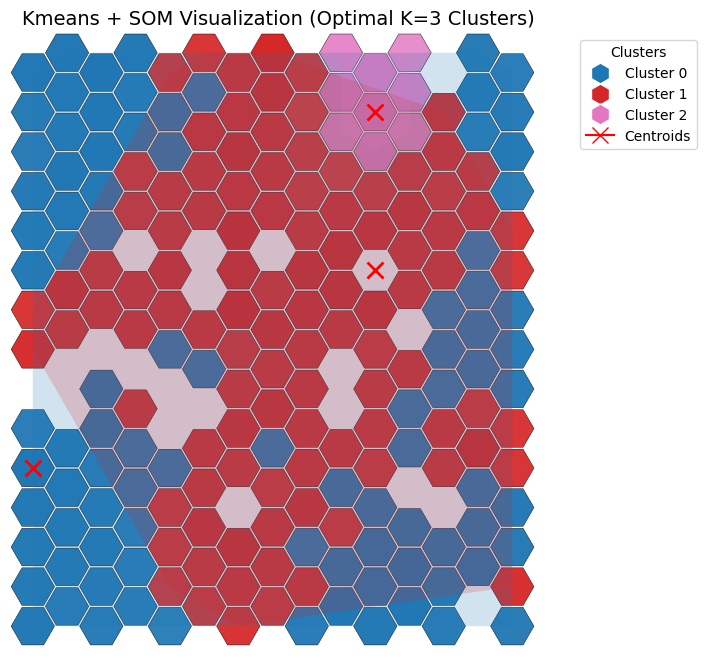

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[ 2.349155   5.013315 ]
 [ 2.3592923  7.4060063]
 [ 3.0346293 11.932037 ]]
Kmeans Labels: [0 1 0 ... 1 0 1]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


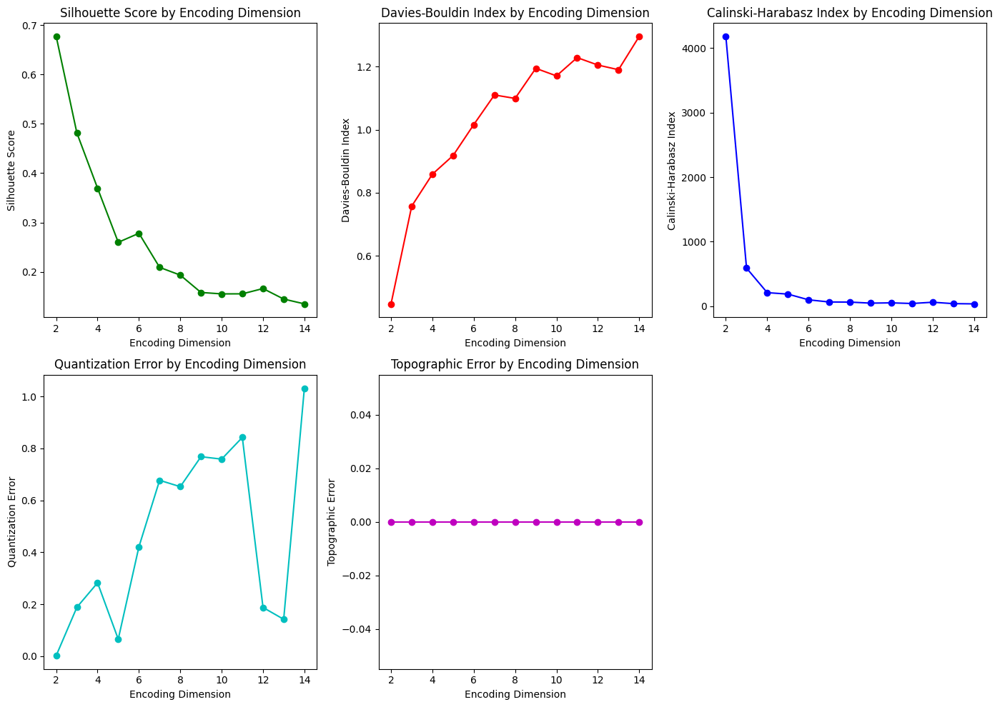

Best Encoding Dimension: 2
Best Combined Score: 1.0000
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.6768
  Davies-Bouldin Index: 0.4478
  Calinski-Harabasz Index: 4180.4532
  Quantization Error: 0.0023
  Topographic Error: 0.0000
Best K: 3
Best Clustering Metrics for K=3:
  - Silhouette Score: 0.5022
  - Davies-Bouldin Score: 0.6239
  - Calinski-Harabasz Index: 1911.0372


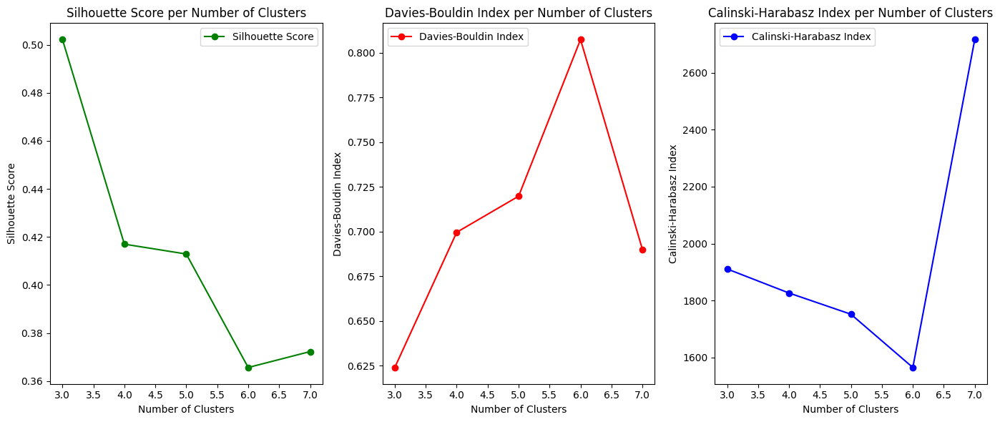

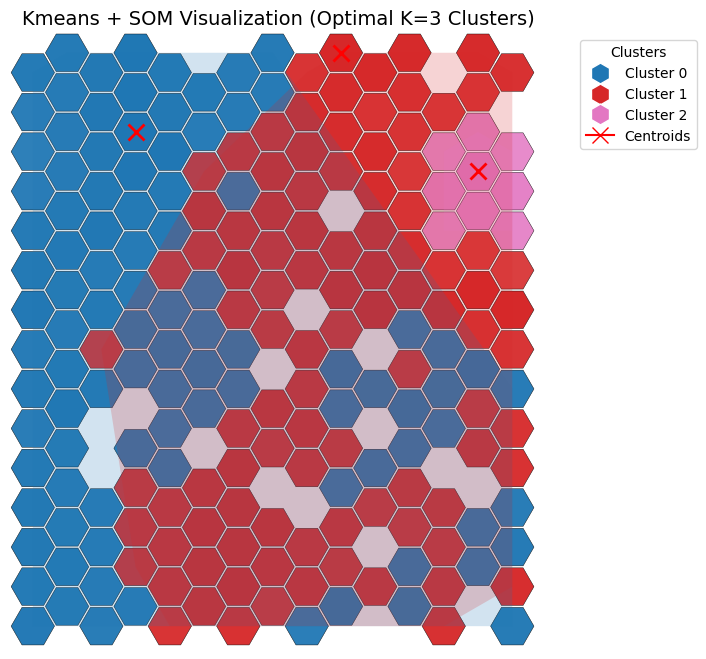

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[ 2.503035   4.4713464]
 [ 4.005684   6.397313 ]
 [ 7.2452393 10.329039 ]]
Kmeans Labels: [0 1 0 ... 1 0 1]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


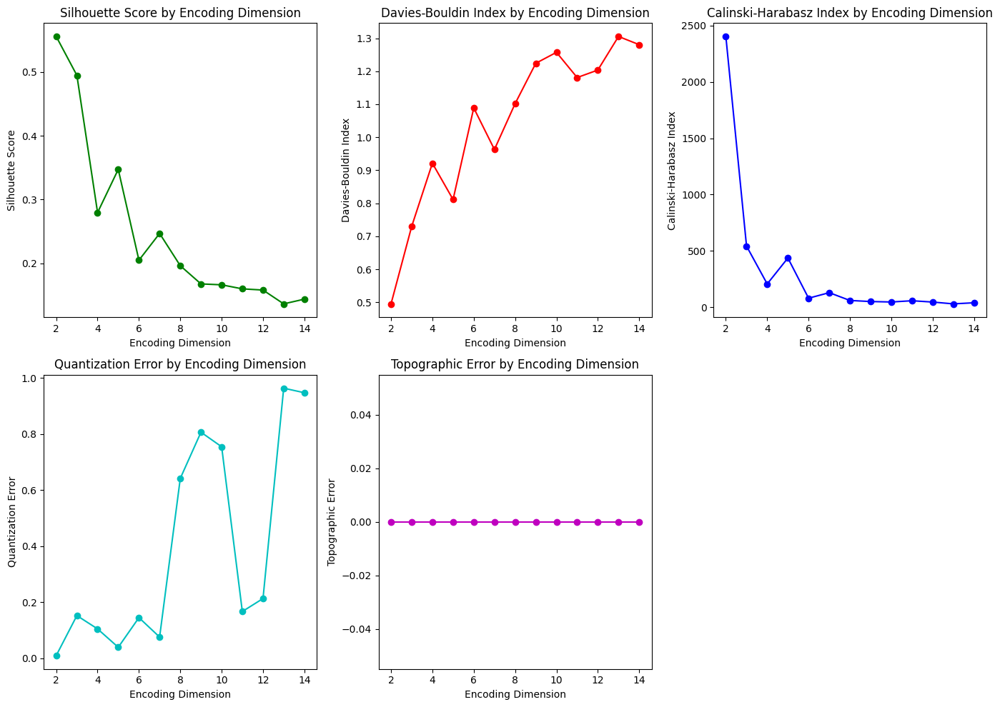

Best Encoding Dimension: 2
Best Combined Score: 1.0000
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.5559
  Davies-Bouldin Index: 0.4953
  Calinski-Harabasz Index: 2402.9249
  Quantization Error: 0.0100
  Topographic Error: 0.0000
Best K: 4
Best Clustering Metrics for K=4:
  - Silhouette Score: 0.4387
  - Davies-Bouldin Score: 0.6762
  - Calinski-Harabasz Index: 2473.7930


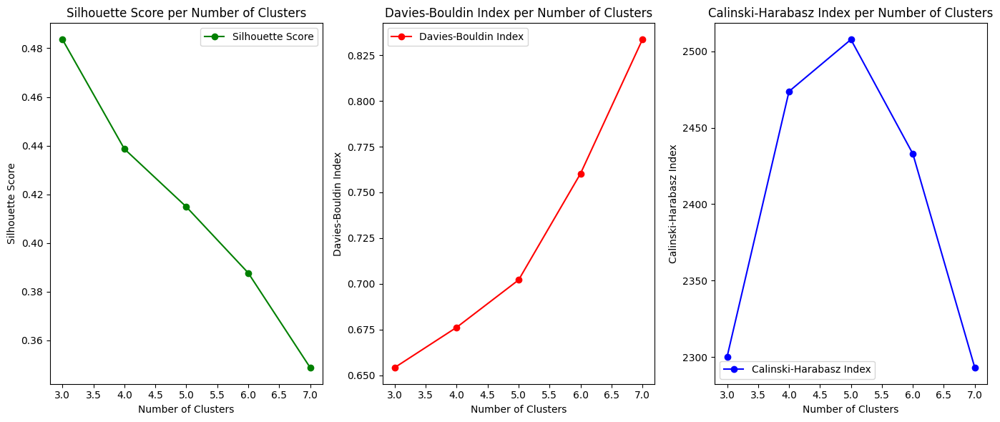

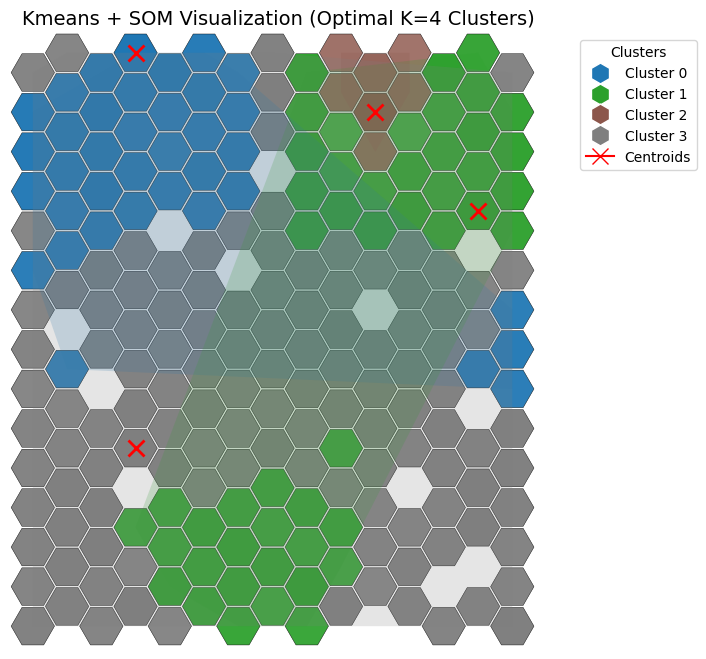

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[ 4.1511006  1.6198093]
 [ 8.126244   2.2581086]
 [11.903198   3.085878 ]
 [ 6.1289697  1.8198966]]
Kmeans Labels: [3 3 0 ... 1 0 1]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


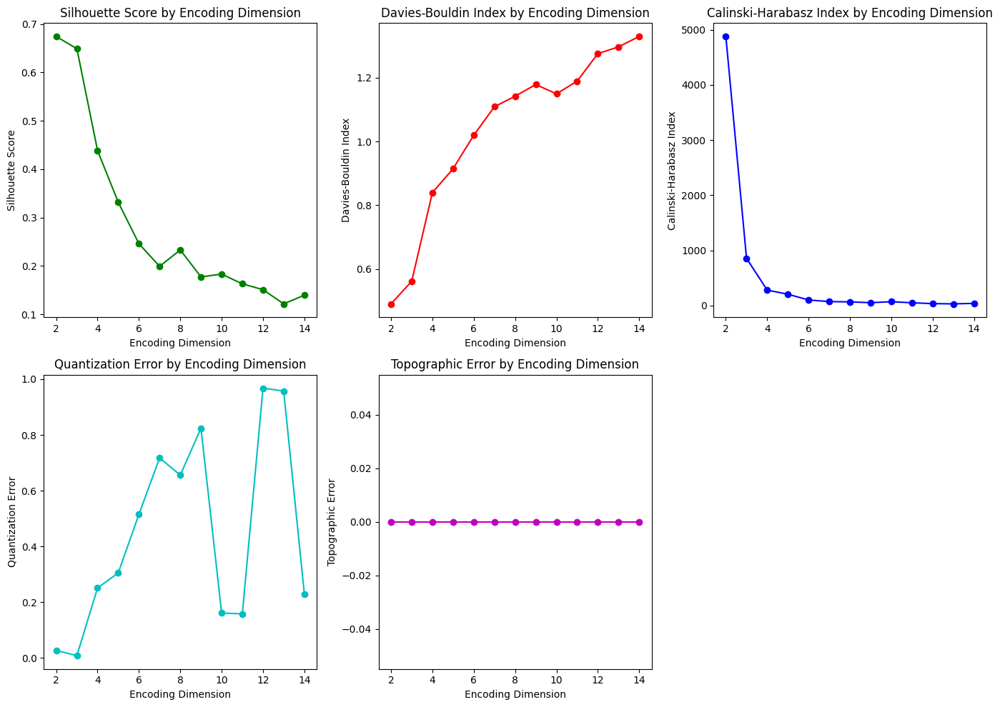

Best Encoding Dimension: 2
Best Combined Score: 1.0000
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.6743
  Davies-Bouldin Index: 0.4910
  Calinski-Harabasz Index: 4876.3474
  Quantization Error: 0.0267
  Topographic Error: 0.0000
Best K: 3
Best Clustering Metrics for K=3:
  - Silhouette Score: 0.5723
  - Davies-Bouldin Score: 0.5302
  - Calinski-Harabasz Index: 3209.2681


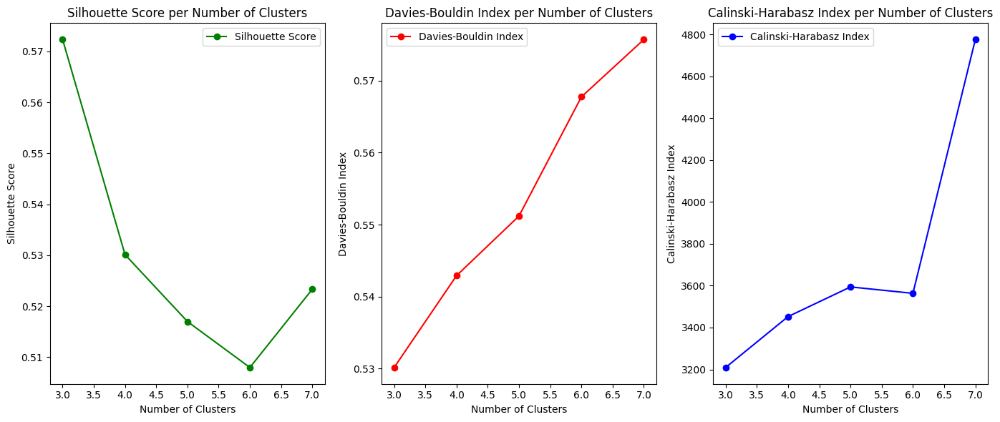

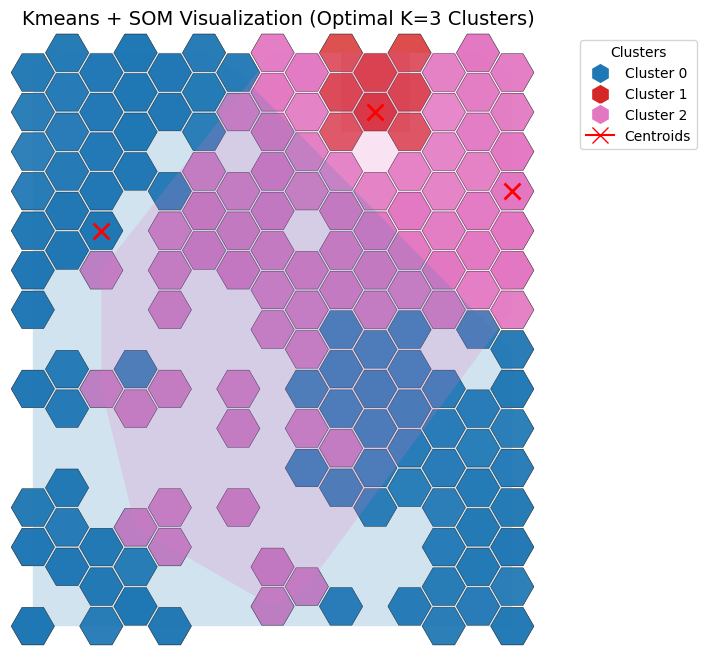

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[5.9216638e+00 1.3115983e-02]
 [1.3264961e+01 9.7938813e-04]
 [8.2305336e+00 2.5872778e-02]]
Kmeans Labels: [0 2 0 ... 2 0 2]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


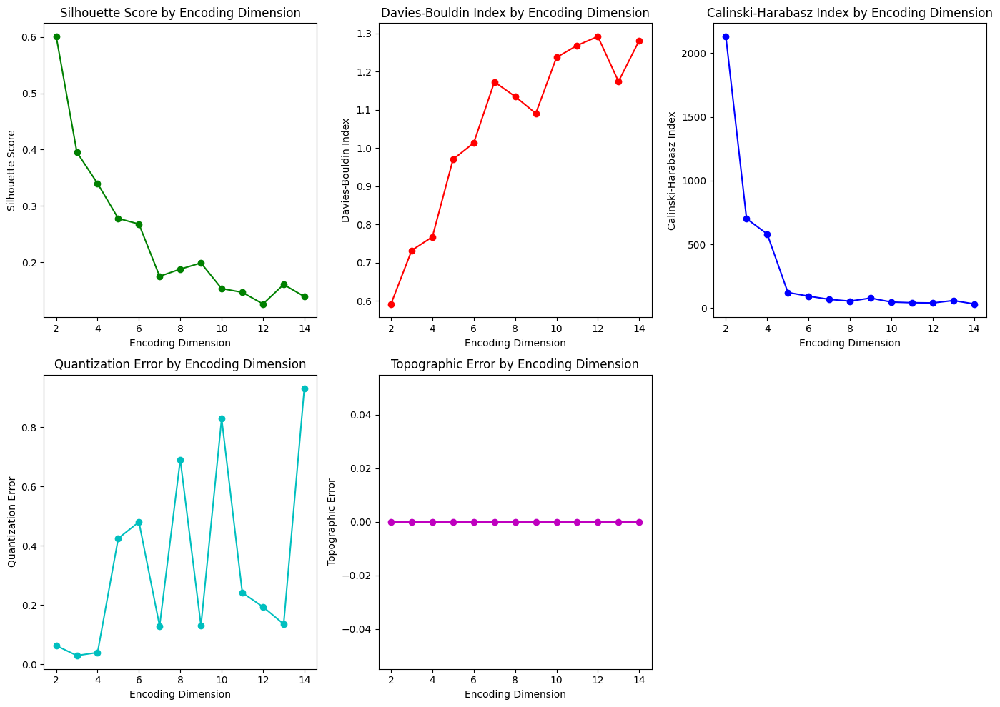

Best Encoding Dimension: 2
Best Combined Score: 1.0000
Best Clustering Metrics (at the time of dimension scanning):
  Silhouette Score: 0.6008
  Davies-Bouldin Index: 0.5919
  Calinski-Harabasz Index: 2130.3893
  Quantization Error: 0.0633
  Topographic Error: 0.0000
Best K: 7
Best Clustering Metrics for K=7:
  - Silhouette Score: 0.4643
  - Davies-Bouldin Score: 0.5526
  - Calinski-Harabasz Index: 3416.9574


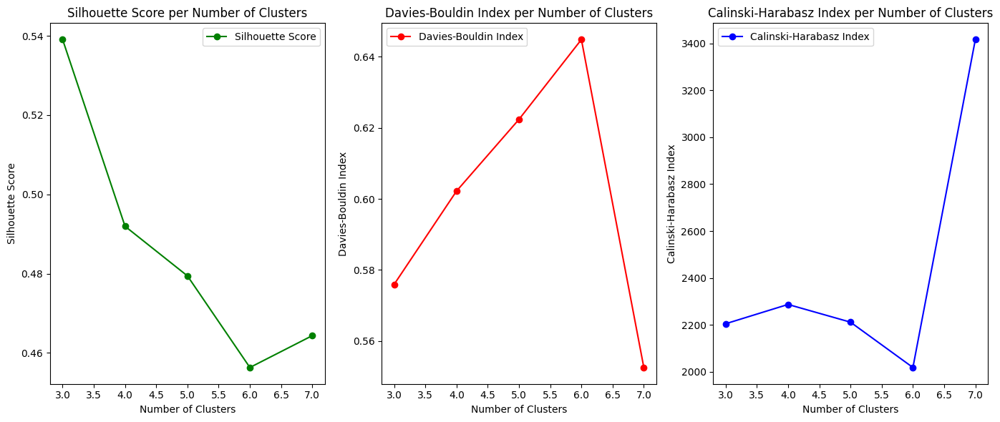

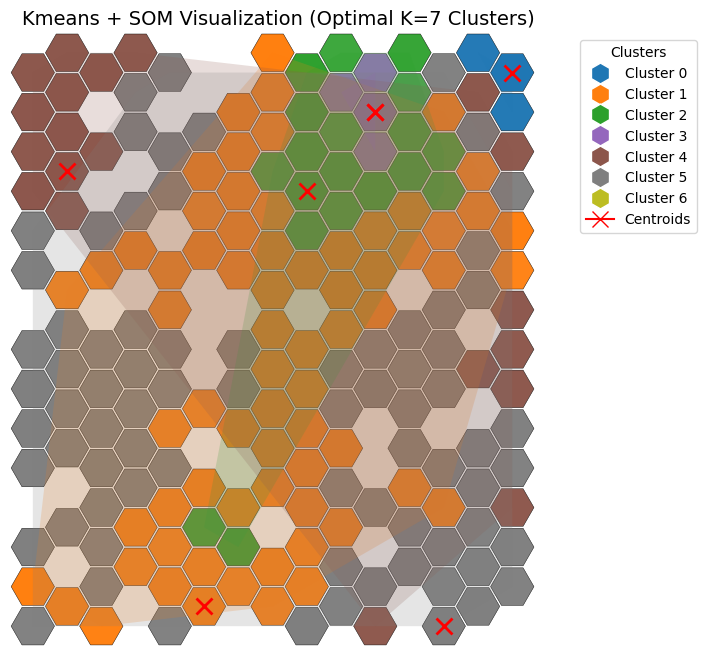

Optimal Latent Features Matrix (Shape): (1496, 2)

Centroids of the Best KMeans Clustering:
 [[ 0.15207525  3.9351172 ]
 [ 0.17157026  6.693054  ]
 [ 0.16270661  8.050509  ]
 [ 0.28598535 10.621212  ]
 [ 0.07082779  4.8703966 ]
 [ 0.10398786  5.694786  ]
 [ 1.8718103  20.193     ]]
Kmeans Labels: [4 1 4 ... 2 0 2]
Reproducibility Settings:
Random Seed: 42
Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5
SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100
Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error
--------------------------------------------------


KeyboardInterrupt: 

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Input, Dense, Dropout, GaussianNoise, BatchNormalization, Add
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from minisom import MiniSom
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from scipy.spatial import ConvexHull
from matplotlib.patches import RegularPolygon, Polygon
from matplotlib.collections import PatchCollection
from matplotlib.colors import ListedColormap

# Set reproducibility settings
os.environ['TF_DETERMINISTIC_OPS'] = '1'
seed = 42
np.random.seed()
tf.random.set_seed(seed)

# Function to print reproducibility settings once
def print_reproducibility_settings():
    print("Reproducibility Settings:")
    print(f"Random Seed: {seed}")
    print("Autoencoder Settings: Learning Rate: 0.00005, Batch Size: 50, Epochs: 30, Early Stopping Patience: 5")
    print("SOM Settings: Dimensions: (10, 10), Sigma: 0.5, Learning Rate: 0.5, Training Iterations: 100")
    print("Clustering Evaluation Metrics: Silhouette, Davies-Bouldin, Calinski-Harabasz, Quantization Error, Topographic Error")
    print("-" * 50)

# Function to evaluate clustering metrics per encoding dim
def calculate_metrics(latent_features, flat_labels, som):
    silhouette_avg = silhouette_score(latent_features, flat_labels)
    davies_bouldin_avg = davies_bouldin_score(latent_features, flat_labels)
    calinski_harabasz_avg = calinski_harabasz_score(latent_features, flat_labels)
    quantization_error = np.mean([np.linalg.norm(x - som.get_weights()[som.winner(x)]) for x in latent_features])
    topographic_error = np.mean([
        1 if np.linalg.norm(
            np.array(som.winner(x)) - np.array(som.winner(som.get_weights()[som.winner(x)]))
        ) > 1 else 0
        for x in latent_features
    ])

    return silhouette_avg, davies_bouldin_avg, calinski_harabasz_avg, quantization_error, topographic_error

def find_best_encoding_dimension(df, encoding_dims, som_dim=(15, 15), learning_rate=0.00005, epochs=200, patience=5, batch_size=1496):
    """
    Enhanced version:
      - Standardize data before training
      - Reduced Gaussian noise (from 0.1 to 0.05)
      - Reduced dropout (from 0.1 to 0.05)
      - Lowered SOM sigma (from 2.0 to 1.0)
      - Increased AE epochs to 100
    """
    # 1) Standardize data
    scaler = StandardScaler()
    df_scaled = scaler.fit_transform(df)

    best_encoding_dim, best_latent_features, best_som = None, None, None
    best_combined_score = -1

    # Lists to store metrics for visualization
    silhouette_scores = []
    db_scores = []
    calinski_scores = []
    quantization_errors = []
    topographic_errors = []

    for encoding_dim in encoding_dims:
        input_dim = df_scaled.shape[1]
        input_layer = Input(shape=(input_dim,))

        # 2) Reduce Gaussian noise to preserve more structure
        x = GaussianNoise(0.05)(input_layer)
        # Enhanced Encoder with residual connections and batch normalization
        x1 = Dense(256, activation="relu")(x)
        x1 = BatchNormalization()(x1)
        x2 = Dense(128, activation="relu")(x1)
        x2 = BatchNormalization()(x2)
        x3 = Dense(64, activation="relu")(x2)
        x3 = BatchNormalization()(x3)
        # Residual connection: Add input (projected to 64 dims) to x3
        residual = Dense(64, activation="relu")(x1)  # Project to match dimensions
        x3 = Add()([x3, residual])
        encoder_output = Dense(encoding_dim, activation="relu")(x3)
        # Refine latent features with a small MLP
        latent = Dense(32, activation="relu")(encoder_output)
        latent = BatchNormalization()(latent)

        # Enhanced Decoder
        x = Dense(64, activation="relu")(latent)
        x = BatchNormalization()(x)
        x = Dense(128, activation="relu")(x)
        x = BatchNormalization()(x)
        x = Dense(256, activation="relu")(x)
        x = BatchNormalization()(x)
        decoder = Dense(input_dim, activation="sigmoid")(x)

        # Compile the autoencoder
        autoencoder = Model(inputs=input_layer, outputs=decoder)
        autoencoder.compile(optimizer=Adam(learning_rate=learning_rate), loss="mse")

        # Train the autoencoder
        early_stopping = EarlyStopping(monitor='val_loss', patience=patience, restore_best_weights=True)
        lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3)
        autoencoder.fit(
            df_scaled, df_scaled,
            epochs=epochs,
            batch_size=batch_size,
            shuffle=True,
            validation_split=0.3,
            callbacks=[early_stopping, lr_scheduler],
            verbose=0  # you can switch to 1 if you want logs
        )

        # Extract latent features
        encoder_model = Model(inputs=input_layer, outputs=latent)
        latent_features = encoder_model.predict(df_scaled, verbose=0)

        # 4) Lower sigma to encourage tighter clustering
        # Pre-train SOM for better initialization
        som = MiniSom(som_dim[0], som_dim[1], 32, sigma=0.5, learning_rate=0.5, random_seed=seed)  # 32 from MLP output
        som.random_weights_init(latent_features)
        # 5) Keep high training iterations if you want deeper convergence
        som.train_random(latent_features, 20000)

        # Map each data point to SOM clusters
        labels = np.array([som.winner(x) for x in latent_features])
        flat_labels = np.unique(labels, axis=0, return_inverse=True)[1]

        # Calculate clustering metrics
        (silhouette_avg, davies_bouldin_avg, calinski_harabasz_avg,
         quantization_error, topographic_error) = calculate_metrics(latent_features, flat_labels, som)

        # Append metrics for visualization
        silhouette_scores.append(silhouette_avg)
        db_scores.append(davies_bouldin_avg)
        calinski_scores.append(calinski_harabasz_avg)
        quantization_errors.append(quantization_error)
        topographic_errors.append(topographic_error)

    # Normalize metrics for combined score calculation
    silhouette_norm = (silhouette_scores - np.min(silhouette_scores)) / (np.max(silhouette_scores) - np.min(silhouette_scores))
    calinski_norm = (calinski_scores - np.min(calinski_scores)) / (np.max(calinski_scores) - np.min(calinski_scores))
    davies_norm = (np.max(db_scores) - db_scores) / (np.max(db_scores) - np.min(db_scores))  # Inverse for minimization

    # Calculate combined scores
    combined_scores = 0.33 * silhouette_norm + 0.33 * calinski_norm + 0.34 * davies_norm

    # Find the best encoding dimension
    best_index = np.argmax(combined_scores)
    best_combined_score = combined_scores[best_index]
    best_encoding_dim = encoding_dims[best_index]
    # NOTE: If you want the actual best latent features and SOM at best_index,
    #       move the model code outside or store the best after each iteration.
    # For simplicity, let's just re-run for best dim (like "lazy" approach):
    # Retrain with the best encoding dimension
    input_dim = df_scaled.shape[1]
    input_layer = Input(shape=(input_dim,))
    x = Dense(256, activation="relu")(input_layer)
    x = Dense(128, activation="relu")(x)
    x = Dense(64, activation="relu")(x)
    latent = Dense(best_encoding_dim, activation="relu")(x)
    x = Dense(64, activation="relu")(latent)
    x = Dense(128, activation="relu")(x)
    x = Dense(256, activation="relu")(x)
    decoded = Dense(input_dim, activation="sigmoid")(x)
    autoencoder = Model(inputs=input_layer, outputs=decoded)
    autoencoder.compile(optimizer=Adam(learning_rate=learning_rate), loss="mse")
    autoencoder.fit(
        df_scaled, df_scaled,
        epochs=epochs,
        batch_size=batch_size,
        shuffle=True,
        validation_split=0.3,
        callbacks=[EarlyStopping(monitor='val_loss', patience=patience, restore_best_weights=True),
                   ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3)],
        verbose=0
    )
    encoder_model = Model(inputs=input_layer, outputs=latent)
    best_latent_features = encoder_model.predict(df_scaled)

    best_som = MiniSom(som_dim[0], som_dim[1], best_encoding_dim, sigma=2.0, learning_rate=0.005, random_seed=seed)
    best_som.random_weights_init(best_latent_features)
    best_som.train_random(best_latent_features, 20000)

    # Visualization of metrics
    plt.figure(figsize=(14, 10))

    plt.subplot(2, 3, 1)
    plt.plot(encoding_dims, silhouette_scores, 'g-o')
    plt.xlabel('Encoding Dimension')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Score by Encoding Dimension')

    plt.subplot(2, 3, 2)
    plt.plot(encoding_dims, db_scores, 'r-o')
    plt.xlabel('Encoding Dimension')
    plt.ylabel('Davies-Bouldin Index')
    plt.title('Davies-Bouldin Index by Encoding Dimension')

    plt.subplot(2, 3, 3)
    plt.plot(encoding_dims, calinski_scores, 'b-o')
    plt.xlabel('Encoding Dimension')
    plt.ylabel('Calinski-Harabasz Index')
    plt.title('Calinski-Harabasz Index by Encoding Dimension')

    plt.subplot(2, 3, 4)
    plt.plot(encoding_dims, quantization_errors, 'c-o')
    plt.xlabel('Encoding Dimension')
    plt.ylabel('Quantization Error')
    plt.title('Quantization Error by Encoding Dimension')

    plt.subplot(2, 3, 5)
    plt.plot(encoding_dims, topographic_errors, 'm-o')
    plt.xlabel('Encoding Dimension')
    plt.ylabel('Topographic Error')
    plt.title('Topographic Error by Encoding Dimension')

    plt.tight_layout()
    plt.show()

    # Print the best results
    print(f"Best Encoding Dimension: {best_encoding_dim}")
    print(f"Best Combined Score: {best_combined_score:.4f}")
    print("Best Clustering Metrics (at the time of dimension scanning):")
    print(f"  Silhouette Score: {silhouette_scores[best_index]:.4f}")
    print(f"  Davies-Bouldin Index: {db_scores[best_index]:.4f}")
    print(f"  Calinski-Harabasz Index: {calinski_scores[best_index]:.4f}")
    print(f"  Quantization Error: {quantization_errors[best_index]:.4f}")
    print(f"  Topographic Error: {topographic_errors[best_index]:.4f}")

    return best_encoding_dim, best_latent_features, best_som

# Function to find the optimal K in KMeans
def find_best_k(latent_features, k_range):
    best_k = None
    best_labels = None
    best_centroids = None
    best_metrics = None
    silhouette_scores = []
    db_scores = []
    calinski_scores = []

    # Iterate over the range of K values
    for k in k_range:
        # Perform KMeans clustering
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(latent_features)

        # Calculate clustering metrics
        silhouette_avg = silhouette_score(latent_features, labels)
        davies_bouldin_avg = davies_bouldin_score(latent_features, labels)
        calinski_harabasz_avg = calinski_harabasz_score(latent_features, labels)

        silhouette_scores.append(silhouette_avg)
        db_scores.append(davies_bouldin_avg)
        calinski_scores.append(calinski_harabasz_avg)

    # Normalize metrics
    silhouette_scores = np.array(silhouette_scores)
    db_scores = np.array(db_scores)
    calinski_scores = np.array(calinski_scores)

    # Silhouette Score: Higher is better (normalize to [0, 1])
    silhouette_norm = (silhouette_scores - silhouette_scores.min()) / (silhouette_scores.max() - silhouette_scores.min())

    # Davies-Bouldin Index: Lower is better (invert and normalize to [0, 1])
    db_norm = 1 - (db_scores - db_scores.min()) / (db_scores.max() - db_scores.min())

    # Calinski-Harabasz Index: Higher is better (normalize to [0, 1])
    calinski_norm = (calinski_scores - calinski_scores.min()) / (calinski_scores.max() - calinski_scores.min())

    # Weighted Aggregation (Equal weights as default)
    combined_scores = (silhouette_norm + db_norm + calinski_norm) / 3

    # Identify the best K
    best_k_idx = np.argmax(combined_scores)
    best_k = k_range[best_k_idx]
    kmeans = KMeans(n_clusters=best_k, random_state=42)
    best_labels = kmeans.fit_predict(latent_features)
    best_centroids = kmeans.cluster_centers_
    best_metrics = (silhouette_scores[best_k_idx], db_scores[best_k_idx], calinski_scores[best_k_idx])

    # Print results for the optimal K
    if best_metrics:
        print(f"Best K: {best_k}")
        print(f"Best Clustering Metrics for K={best_k}:")
        print(f"  - Silhouette Score: {best_metrics[0]:.4f}")
        print(f"  - Davies-Bouldin Score: {best_metrics[1]:.4f}")
        print(f"  - Calinski-Harabasz Index: {best_metrics[2]:.4f}")

    # Plot metrics per number of clusters
    plt.figure(figsize=(14, 6))

    plt.subplot(1, 3, 1)
    plt.plot(k_range, silhouette_scores, 'g-o', label='Silhouette Score')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Score per Number of Clusters')
    plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(k_range, db_scores, 'r-o', label='Davies-Bouldin Index')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Davies-Bouldin Index')
    plt.title('Davies-Bouldin Index per Number of Clusters')
    plt.legend()

    plt.subplot(1, 3, 3)
    plt.plot(k_range, calinski_scores, 'b-o', label='Calinski-Harabasz Index')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Calinski-Harabasz Index')
    plt.title('Calinski-Harabasz Index per Number of Clusters')
    plt.legend()

    plt.tight_layout()
    plt.show()

    return best_k, best_labels, best_centroids, best_metrics[0] if best_metrics else None

# Update visualization function to use best K
def visualize_som_clusters_with_best_k(latent_features, kmeans_labels, som, som_dim=(10, 10), best_k=None, centroids=None):
    # Create color map for clusters
    base_cmap = plt.cm.tab10  # Use a color map with enough colors for clusters

    # Define hexagon grid parameters
    hex_radius = 1  # size of each hexagon
    offset_x = 3/2 * hex_radius  # horizontal offset for each cell in a row
    offset_y = np.sqrt(3) * hex_radius  # vertical offset between rows

    # Map SOM winners to cluster labels
    winner_to_cluster = {som.winner(latent_features[i]): kmeans_labels[i] for i in range(len(latent_features))}

    # Initialize plot
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.set_aspect('equal')

    # Create lists to store hexagons and cluster hull points
    hexagons = []
    cluster_hulls = {cluster: [] for cluster in np.unique(kmeans_labels)}

    # Draw hexagonal grid with gradient color for each cluster
    for i in range(som_dim[0]):
        for j in range(som_dim[1]):
            # Calculate hexagon position
            x = i * offset_x
            y = j * offset_y if i % 2 == 0 else j * offset_y + offset_y / 2

            # Determine the cluster label for this cell
            cluster_label = winner_to_cluster.get((i, j), -1)
            if cluster_label == -1:
                continue  # Skip unassigned cells

            # Calculate color intensity for gradient effect (distance from centroid)
            cell_features = np.array([som.get_weights()[i, j]])
            centroid = centroids[cluster_label]
            dist_to_centroid = np.linalg.norm(cell_features - centroid)
            color_intensity = min(1, dist_to_centroid / max(np.linalg.norm(latent_features - centroid, axis=1)))
            facecolor = base_cmap(cluster_label / best_k)
            # Adjust alpha based on distance
            facecolor = (facecolor[0], facecolor[1], facecolor[2], 1 - color_intensity)

            # Create hexagon
            hexagon = RegularPolygon(
                (x, y), numVertices=6, radius=hex_radius * 0.95,
                orientation=np.radians(30), edgecolor='black', linewidth=0.3,
                facecolor=facecolor
            )
            hexagons.append(hexagon)

            # Add this cell to the cluster hull points
            cluster_hulls[cluster_label].append([x, y])

    # Add all hexagons to the plot
    hex_collection = PatchCollection(hexagons, match_original=True)
    ax.add_collection(hex_collection)

    # Draw shaded convex hulls around clusters
    for cluster, points in cluster_hulls.items():
        if len(points) > 2:  # ConvexHull requires at least 3 points
            hull_points = np.array(points)
            hull = ConvexHull(hull_points)
            hull_polygon = Polygon(hull_points[hull.vertices], closed=True, facecolor=base_cmap(cluster / best_k), alpha=0.2)
            ax.add_patch(hull_polygon)

    # Mark centroids if provided
    if centroids is not None:
        for idx, centroid in enumerate(centroids):
            centroid_winner = som.winner(centroid)
            centroid_x = centroid_winner[0] * offset_x
            centroid_y = centroid_winner[1] * offset_y + (offset_y / 2 if centroid_winner[0] % 2 != 0 else 0)
            ax.plot(centroid_x, centroid_y, 'x', color='red', markersize=12, markeredgewidth=2, label='Centroid' if idx == 0 else "")

    # Adjust plot limits and title
    ax.set_xlim(-hex_radius, som_dim[0] * offset_x)
    ax.set_ylim(-hex_radius, som_dim[1] * offset_y)
    ax.axis('off')
    ax.set_title(f"Kmeans + SOM Visualization (Optimal K={best_k} Clusters)", fontsize=14)

    # Add a legend to describe clusters
    handles = [
        plt.Line2D([0], [0], marker='h', color='w', markerfacecolor=base_cmap(i / best_k), markersize=15,
                   label=f'Cluster {i}') for i in range(best_k)
    ]
    handles.append(plt.Line2D([0], [0], marker='x', color='red', markersize=12, label='Centroids'))
    ax.legend(handles=handles, bbox_to_anchor=(1.05, 1), loc='upper left', title="Clusters", fontsize=10)

    plt.show()

def main_clustering_pipeline(df, encoding_dims, som_dim=(15, 15), learning_rate=0.00005, epochs=200, patience=5, batch_size=1496, k_range=range(3, 8)):
    print_reproducibility_settings()
    best_encoding_dim, best_latent_features, best_som = find_best_encoding_dimension(
        df, encoding_dims, som_dim, learning_rate, epochs, patience, batch_size
    )

    best_k, kmeans_labels, centroids, s = find_best_k(best_latent_features, k_range)
    visualize_som_clusters_with_best_k(best_latent_features, kmeans_labels, best_som, som_dim, best_k, centroids)

    print("Optimal Latent Features Matrix (Shape):", best_latent_features.shape)
    print("\nCentroids of the Best KMeans Clustering:\n", centroids)

    return best_latent_features, best_som, kmeans_labels, centroids, best_k, s

def main_loop():
    # Execute pipeline
    encoding_dims = range(2, 15)
    latent_features_matrix, som_weights_matrix, kmeans_labels, centroids, best_k, silhouette = main_clustering_pipeline(
        df_copy, encoding_dims
    )
    print("Kmeans Labels:", kmeans_labels)
    return latent_features_matrix, som_weights_matrix, kmeans_labels, centroids, best_k, silhouette

while True:
    latent_features_matrix, som_weights_matrix, kmeans_labels, centroids, best_k, silhouette = main_loop()
    if silhouette > 0.64 and best_k > 2:
        break


latent_features: [[ 0.          3.3339074 ]
 [ 0.         21.1989    ]
 [ 0.          0.71554154]
 ...
 [ 0.         14.408482  ]
 [ 0.          1.333213  ]
 [ 0.         27.370415  ]]
som_weights: <minisom.MiniSom object at 0x7ec1eeb82710>
labels: [0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

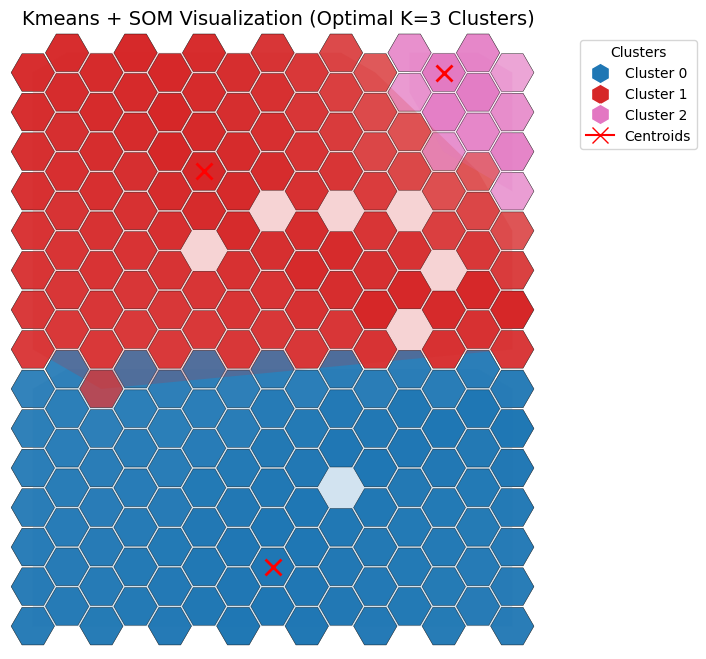

1496

In [ ]:
print("latent_features:",np.array(latent_features_matrix))
print("som_weights:",np.array(som_weights_matrix))
print("labels:",kmeans_labels.tolist())
print("centroids", centroids)
#print("som:",som)
# Best Clustering Metrics for K=3:
# Silhouette Score: 0.9116786122322083, Davies-Bouldin Score: 0.5249973709662115, Calinski-Harabasz Index: 1255.0099599754637

print(f"Latent Features Shape: {np.array(latent_features_matrix).shape}")
print(f"SOM Weights Shape: {np.array(som_weights_matrix).shape}")

visualize_som_clusters_with_best_k(latent_features_matrix, kmeans_labels, som_weights_matrix, best_k=3, som_dim=(15, 15), centroids=centroids)
len(kmeans_labels.tolist())


In [ ]:
# Save to CSV
pd.DataFrame(latent_features_matrix).to_csv("latent_features.csv", index=False)
pd.DataFrame(kmeans_labels).to_csv("labels.csv", index=False)
pd.DataFrame(centroids).to_csv("centroids.csv", index=False)


# Load from CSV
retrieved_latent_features = pd.read_csv("latent_features.csv").values
retrieved_labels = pd.read_csv("labels.csv").values
retrieved_centroids = pd.read_csv("centroids.csv").values


# Save the entire som object
with open("som_weights.pkl", "wb") as file:
    pickle.dump(som_weights_matrix, file)

# Load the som object later
with open("som_weights.pkl", "rb") as file:
    som_loaded = pickle.load(file)

## GANs/Kmeans

In [ ]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate Gap Statistic manually
def calculate_gap_statistic(data, n_clusters, n_refs=10):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(data)
    actual_inertia = kmeans.inertia_

    # Generate random reference datasets and calculate their inertia
    ref_inertias = []
    for _ in range(n_refs):
        random_data = np.random.uniform(low=np.min(data, axis=0), high=np.max(data, axis=0), size=data.shape)
        kmeans_ref = KMeans(n_clusters=n_clusters, random_state=42)
        kmeans_ref.fit(random_data)
        ref_inertias.append(kmeans_ref.inertia_)

    gap_statistic = np.log(np.mean(ref_inertias)) - np.log(actual_inertia)
    return gap_statistic

# Function to find the best GAN latent space
def find_best_gan_latent_space(df, encoding_dims, cluster_range, learning_rate=0.00005, epochs=10):
    best_encoding_dim = None
    best_combined_score = -1
    best_latent_features = None
    metrics_store = []

    for encoding_dim in encoding_dims:
        input_dim = df.shape[1]

        # Define GAN components
        generator_input = Input(shape=(encoding_dim,))
        generator_output = Dense(input_dim, activation="relu")(generator_input)
        generator = Model(inputs=generator_input, outputs=generator_output)

        discriminator_input = Input(shape=(input_dim,))
        discriminator_output = Dense(1, activation="sigmoid")(discriminator_input)
        discriminator = Model(inputs=discriminator_input, outputs=discriminator_output)

        # Compile discriminator
        discriminator.compile(optimizer=Adam(learning_rate=learning_rate), loss="binary_crossentropy")

        # GAN model
        gan_input = Input(shape=(encoding_dim,))
        generated_data = generator(gan_input)
        discriminator.trainable = False
        gan_output = discriminator(generated_data)
        gan = Model(gan_input, gan_output)
        gan.compile(optimizer=Adam(learning_rate=learning_rate), loss="binary_crossentropy")

        # Generate latent features
        latent_features = generator.predict(np.random.normal(0, 1, (len(df), encoding_dim)))

        # Evaluate clustering for the given encoding dimension
        silhouette_scores = []
        db_scores = []
        calinski_scores = []

        for n_clusters in cluster_range:
            kmeans = KMeans(n_clusters=n_clusters, random_state=42)
            labels = kmeans.fit_predict(latent_features)

            # Calculate metrics
            silhouette_avg = silhouette_score(latent_features, labels)
            db_index = davies_bouldin_score(latent_features, labels)
            calinski_harabasz = calinski_harabasz_score(latent_features, labels)

            silhouette_scores.append(silhouette_avg)
            db_scores.append(db_index)
            calinski_scores.append(calinski_harabasz)

        # Compute a combined score
        combined_score = max(silhouette_scores) - min(db_scores) + max(calinski_scores)

        # Store the best encoding dimension
        if combined_score > best_combined_score:
            best_combined_score = combined_score
            best_encoding_dim = encoding_dim
            best_latent_features = latent_features
            metrics_store = {
                "Encoding Dimension": encoding_dim,
                "Silhouette Scores": silhouette_scores,
                "Davies-Bouldin Scores": db_scores,
                "Calinski-Harabasz Scores": calinski_scores,
            }

    # Output metrics for the best encoding dimension
    print(f"Best Encoding Dimension: {best_encoding_dim}")
    print(f"Metrics for Best Encoding Dimension:")
    print(metrics_store)

    return best_encoding_dim, best_latent_features

def evaluate_clusters(latent_features, cluster_range):
    # Initialize lists to store metrics for each k
    silhouette_scores = []
    db_scores = []
    calinski_scores = []

    # Initialize variables to store the best k and corresponding metrics
    best_k = None
    best_silhouette_score = -float('inf')
    best_combined_score = -float('inf')
    best_metrics = None

    for k in cluster_range:
        # Perform KMeans clustering
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(latent_features)

        # Calculate clustering metrics
        silhouette_avg = silhouette_score(latent_features, labels)
        db_index = davies_bouldin_score(latent_features, labels)
        calinski_harabasz = calinski_harabasz_score(latent_features, labels)

        # Store the metrics for plotting
        silhouette_scores.append(silhouette_avg)
        db_scores.append(db_index)
        calinski_scores.append(calinski_harabasz)

        # Compute a combined score (higher silhouette, lower DB, higher CH)
        combined_score = silhouette_avg - db_index + calinski_harabasz

        # Update the best k if this combined score is better
        if combined_score > best_combined_score:
            best_combined_score = combined_score
            best_k = k
            best_silhouette_score = silhouette_avg
            best_metrics = {
                "Silhouette Score": silhouette_avg,
                "Davies-Bouldin Index": db_index,
                "Calinski-Harabasz Index": calinski_harabasz,
            }

    # Visualization of evaluation metrics
    plt.figure(figsize=(18, 6))

    # Plot for Silhouette Score
    plt.subplot(1, 3, 1)
    plt.plot(cluster_range, silhouette_scores, 'go-', label='Silhouette Score')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Score vs Number of Clusters')
    plt.legend()

    # Plot for Davies-Bouldin Index
    plt.subplot(1, 3, 2)
    plt.plot(cluster_range, db_scores, 'ro-', label='Davies-Bouldin Index')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Davies-Bouldin Index')
    plt.title('Davies-Bouldin Index vs Number of Clusters')
    plt.legend()

    # Plot for Calinski-Harabasz Index
    plt.subplot(1, 3, 3)
    plt.plot(cluster_range, calinski_scores, 'bo-', label='Calinski-Harabasz Index')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Calinski-Harabasz Index')
    plt.title('Calinski-Harabasz Index vs Number of Clusters')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Print the best k and corresponding metrics
    print(f"Optimal Number of Clusters (k): {best_k}")
    print(f"Silhouette Score for Optimal k: {best_silhouette_score}")
    print("Best Metrics for Optimal k:")
    for metric_name, value in best_metrics.items():
        print(f"  - {metric_name}: {value:.4f}")

    return best_k, best_metrics, best_silhouette_score


# Main function to integrate all steps
def main_clustering_pipeline(df, encoding_dims, cluster_range, learning_rate=0.00005, epochs=50):
    best_encoding_dim, best_latent_features = find_best_gan_latent_space(df, encoding_dims, cluster_range, learning_rate, epochs)
    optimal_k, best_metrics, silhouette_score = evaluate_clusters(best_latent_features, cluster_range)
    print(f"Optimal number of clusters: {optimal_k}")
    print(f"Silhouette Score for optimal k: {silhouette_score}")

    return best_latent_features, optimal_k, best_metrics, silhouette_score

def main_gan_loop():

    # Range of cluster numbers to evaluate
    cluster_range = range(2, 15)
    encoding_dims = range(2, 15)
    best_latent_features, optimal_k, best_metrics, silhouette_score = main_clustering_pipeline(df_copy, encoding_dims, cluster_range)

    # Print final results
    print(f"Optimal Number of Clusters: {optimal_k}")
    print("Metrics for the Optimal k:")
    print(best_metrics)
    return best_latent_features, optimal_k, silhouette_score

while True:
    latent_features, k, silhouette = main_gan_loop()
    if (silhouette > 0.4 and k>2):  # Example condition
        break


## Autoencoders/KMeans

In [ ]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate the Gap Statistic manually
def calculate_gap_statistic(data, n_clusters, n_refs=10):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(data)
    actual_inertia = kmeans.inertia_

    # Generate random reference datasets and calculate their inertia
    ref_inertias = []
    for _ in range(n_refs):
        random_data = np.random.uniform(low=np.min(data, axis=0), high=np.max(data, axis=0), size=data.shape)
        kmeans_ref = KMeans(n_clusters=n_clusters, random_state=42)
        kmeans_ref.fit(random_data)
        ref_inertias.append(kmeans_ref.inertia_)

    gap_statistic = np.log(np.mean(ref_inertias)) - np.log(actual_inertia)
    return gap_statistic

# Step 1: Define the best encoding dimension function
def find_best_encoding_dimension(df, encoding_dims, cluster_range, learning_rate=0.00005, epochs=20):
    best_encoding_dim = None
    best_silhouette_score = -1
    best_latent_features = None
    history_all = []

    for encoding_dim in encoding_dims:
        input_dim = df.shape[1]
        input_layer = Input(shape=(input_dim,))
        encoder = Dense(encoding_dim, activation="relu")(input_layer)
        decoder = Dense(input_dim, activation="sigmoid")(encoder)
        autoencoder = Model(inputs=input_layer, outputs=decoder)
        autoencoder.compile(optimizer=Adam(learning_rate=learning_rate), loss="mse")

        # Early stopping callback to prevent overfitting
        early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

        # Train the autoencoder with early stopping
        history = autoencoder.fit(
            df, df,
            epochs=epochs,
            batch_size=50,
            shuffle=True,
            verbose=1,
            validation_split=0.3,
            callbacks=[early_stopping]
        )
        history_all.append(history.history)

        # Extract and display the latent features
        encoder_model = Model(inputs=input_layer, outputs=encoder)
        latent_features = encoder_model.predict(df)

        # Assess with silhouette score and track best encoding dimension
        for n_clusters in cluster_range:
            kmeans = KMeans(n_clusters=n_clusters, random_state=42)
            labels = kmeans.fit_predict(latent_features)
            score = silhouette_score(latent_features, labels)
            if score > best_silhouette_score:
                best_silhouette_score = score
                best_encoding_dim = encoding_dim
                best_latent_features = latent_features

    # Plot loss and validation loss for each encoding dimension
    plt.figure(figsize=(12, 8))
    for i, history in enumerate(history_all):
        plt.plot(history['loss'], label=f'Encoding Dim {encoding_dims[i]} - Training Loss')
        plt.plot(history['val_loss'], '--', label=f'Encoding Dim {encoding_dims[i]} - Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss for Different Encoding Dimensions')
    plt.legend()
    plt.show()

    return best_encoding_dim, np.array(best_latent_features)

# Step 2: Perform clustering with multi-metric evaluation
def evaluate_clusters(latent_features, cluster_range):
    inertia_values, bic_scores, calinski_scores, gap_stats, silhouette_scores, db_scores = [], [], [], [], [], []

    for k in cluster_range:
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(latent_features)

        # Inertia for Elbow Method
        inertia_values.append(kmeans.inertia_)

        # BIC
        n_features = latent_features.shape[1]
        bic = np.log(len(latent_features)) * k * n_features - 2 * np.log(kmeans.inertia_)
        bic_scores.append(bic)

        # Calinski-Harabasz Index
        calinski = calinski_harabasz_score(latent_features, labels)
        calinski_scores.append(calinski)

        # Gap Statistic
        gap_stat = calculate_gap_statistic(latent_features, k)
        gap_stats.append(gap_stat)

        # Silhouette Score
        silhouette = silhouette_score(latent_features, labels)
        silhouette_scores.append(silhouette)

        # Davies-Bouldin Index
        db_index = davies_bouldin_score(latent_features, labels)
        db_scores.append(db_index)

    # Plot clustering evaluation metrics
    plt.figure(figsize=(10, 10))

    plt.subplot(2, 3, 1)
    plt.plot(cluster_range, inertia_values, 'bo-')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia')
    plt.title('Elbow Method for Optimal Clusters')

    plt.subplot(2, 3, 2)
    plt.plot(cluster_range, silhouette_scores, 'go-')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Score for Optimal Clusters')

    plt.subplot(2, 3, 3)
    plt.plot(cluster_range, db_scores, 'ro-')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Davies-Bouldin Index')
    plt.title('Davies-Bouldin Index for Optimal Clusters')

    plt.subplot(2, 3, 4)
    plt.plot(cluster_range, calinski_scores, 'mo-')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Calinski-Harabasz Index')
    plt.title('Calinski-Harabasz Index for Optimal Clusters')

    plt.subplot(2, 3, 5)
    plt.plot(cluster_range, gap_stats, 'co-')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Gap Statistic')
    plt.title('Gap Statistic for Optimal Clusters')

    plt.subplot(2, 3, 6)
    plt.plot(cluster_range, bic_scores, 'yo-')
    plt.xlabel('Number of Clusters')
    plt.ylabel('BIC')
    plt.title('BIC for Optimal Clusters')

    plt.tight_layout()
    plt.show()

    # Determine optimal k based on silhouette score
    optimal_k = cluster_range[np.argmax(silhouette_scores)]
    return optimal_k

# Main function to integrate all steps
def main_clustering_pipeline(df, encoding_dims, cluster_range, learning_rate=0.00005, epochs=20):
    best_encoding_dim, best_latent_features = find_best_encoding_dimension(df, encoding_dims, cluster_range, learning_rate, epochs)
    print(f"Best Encoding Dimension: {best_encoding_dim}")

    # Evaluate clusters for the optimal latent space
    optimal_k = evaluate_clusters(best_latent_features, cluster_range)
    print(f"Optimal number of clusters based on silhouette score: {optimal_k}")

    # Final clustering with optimal k
    kmeans_optimal = KMeans(n_clusters=optimal_k, random_state=42)
    kmeans_labels = kmeans_optimal.fit_predict(best_latent_features)

    # Calculate final scores for optimal k
    silhouette_optimal = silhouette_score(best_latent_features, kmeans_labels)
    db_index_optimal = davies_bouldin_score(best_latent_features, kmeans_labels)
    calinski_optimal = calinski_harabasz_score(best_latent_features, kmeans_labels)
    gap_stat_optimal = calculate_gap_statistic(best_latent_features, optimal_k)

    # Print the final scores
    print("\nFinal Clustering Evaluation Metrics for Optimal k =", optimal_k)
    print(f"Silhouette Score: {silhouette_optimal}")
    print(f"Davies-Bouldin Index: {db_index_optimal}")
    print(f"Calinski-Harabasz Index: {calinski_optimal}")
    print(f"Gap Statistic: {gap_stat_optimal}")

    # Visualization of final clusters
    plt.figure(figsize=(10, 8))
    plt.scatter(best_latent_features[:, 0], best_latent_features[:, 1], c=kmeans_labels, cmap='viridis', s=50, alpha=0.7)
    plt.scatter(kmeans_optimal.cluster_centers_[:, 0], kmeans_optimal.cluster_centers_[:, 1], c='red', s=200, marker='X', label='Centroids')
    plt.xlabel('Latent Feature 1')
    plt.ylabel('Latent Feature 2')
    plt.title(f'Final Cluster Visualization with {optimal_k} Clusters')
    plt.legend()
    plt.show()
    return best_latent_features, optimal_k, silhouette_optimal
def main_auto_loop():
  # Run the main clustering pipeline
  encoding_dims = range(2, 15)  # Range of encoding dimensions to test
  cluster_range = range(2, 12)  # Range of possible cluster numbers
  best_latent_features, optimal_k, silhouette_optimal = main_clustering_pipeline(df_copy, encoding_dims, cluster_range)
  return best_latent_features, optimal_k, silhouette_optimal

while(True):
  latent_features, optimal_k, silhouette_optimal=main_auto_loop()
  if(optimal_k==4 and silhouette_optimal>0.65):
    break

In [ ]:
###########################################################################The One#######################################################################################
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate the Gap Statistic manually
def calculate_gap_statistic(data, n_clusters, n_refs=10):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(data)
    actual_inertia = kmeans.inertia_

    # Generate random reference datasets and calculate their inertia
    ref_inertias = []
    for _ in range(n_refs):
        random_data = np.random.uniform(low=np.min(data, axis=0), high=np.max(data, axis=0), size=data.shape)
        kmeans_ref = KMeans(n_clusters=n_clusters, random_state=42)
        kmeans_ref.fit(random_data)
        ref_inertias.append(kmeans_ref.inertia_)

    gap_statistic = np.log(np.mean(ref_inertias)) - np.log(actual_inertia)
    return gap_statistic

# Step 1: Define the best encoding dimension function
def find_best_encoding_dimension(df, encoding_dims, cluster_range, learning_rate=0.00005, epochs=20):
    best_encoding_dim = None
    best_silhouette_score = -1
    best_latent_features = None

    for encoding_dim in encoding_dims:
        input_dim = df.shape[1]
        input_layer = Input(shape=(input_dim,))
        encoder = Dense(encoding_dim, activation="relu")(input_layer)
        decoder = Dense(input_dim, activation="sigmoid")(encoder)
        autoencoder = Model(inputs=input_layer, outputs=decoder)
        autoencoder.compile(optimizer=Adam(learning_rate=learning_rate), loss="mse")

        # Early stopping callback to prevent overfitting
        early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

        # Train the autoencoder with early stopping
        history = autoencoder.fit(
            df, df,
            epochs=epochs,
            batch_size=50,
            shuffle=True,
            verbose=1,
            validation_split=0.3,
            callbacks=[early_stopping]
        )

        # Extract and display the latent features
        encoder_model = Model(inputs=input_layer, outputs=encoder)
        latent_features = encoder_model.predict(df)
        print(f"\nLatent Features for encoding dimension {encoding_dim}:\n", latent_features.tolist())

        # Assess with silhouette score and track best encoding dimension
        for n_clusters in cluster_range:
            kmeans = KMeans(n_clusters=n_clusters, random_state=42)
            labels = kmeans.fit_predict(latent_features)
            score = silhouette_score(latent_features, labels)
            if score > best_silhouette_score:
                best_silhouette_score = score
                best_encoding_dim = encoding_dim
                best_latent_features = latent_features

    # Plot loss and validation loss
    plt.figure(figsize=(8, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss per Epoch')
    plt.legend()
    plt.show()

    return best_encoding_dim, np.array(best_latent_features)  # Return as NumPy array for compatibility

# Step 2: Perform clustering with multi-metric evaluation
def evaluate_clusters(latent_features, cluster_range):
    bic_scores, calinski_scores, gap_stats, silhouette_scores, elbow_inertia = [], [], [], [], []

    for k in cluster_range:
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(latent_features)

        # BIC
        inertia = kmeans.inertia_
        n_features = latent_features.shape[1]
        bic = np.log(len(latent_features)) * k * n_features - 2 * np.log(inertia)
        bic_scores.append(bic)

        # Calinski-Harabasz
        calinski = calinski_harabasz_score(latent_features, labels)
        calinski_scores.append(calinski)

        # Gap Statistic
        gap_stat = calculate_gap_statistic(latent_features, k)
        gap_stats.append(gap_stat)

        # Silhouette Score
        silhouette = silhouette_score(latent_features, labels)
        silhouette_scores.append(silhouette)

        # Elbow Method
        elbow_inertia.append(inertia)

    # Determine the optimal k based on each metric
    optimal_k_bic = cluster_range[np.argmax(bic_scores)]
    optimal_k_calinski = cluster_range[np.argmax(calinski_scores)]
    optimal_k_gap = cluster_range[np.argmax(gap_stats)]
    optimal_k_silhouette = cluster_range[np.argmax(silhouette_scores)]
    optimal_k_elbow = cluster_range[np.argmax(np.diff(np.diff(elbow_inertia)))] + 2

    # Determine the final k by consensus
    metrics = {'bic': optimal_k_bic, 'calinski': optimal_k_calinski, 'gap': optimal_k_gap, 'elbow': optimal_k_elbow, 'silhouette': optimal_k_silhouette}
    optimal_k = max(set(metrics.values()), key=list(metrics.values()).count)

    # Print evaluation results
    print(f"Optimal k by each metric: {metrics}")
    print(f"Final best k based on combined metrics: {optimal_k}")
    print("\nEvaluation Metrics for the Final Clustering:")
    print(f"Best k: {optimal_k}")
    print(f"BIC: {bic_scores[cluster_range.index(optimal_k)]}")
    print(f"Calinski-Harabasz Index: {calinski_scores[cluster_range.index(optimal_k)]}")
    print(f"Gap Statistic: {gap_stats[cluster_range.index(optimal_k)]}")
    print(f"Silhouette Score: {silhouette_scores[cluster_range.index(optimal_k)]}")
    print(f"Davies-Bouldin Index: {davies_bouldin_score(latent_features, kmeans.labels_)}")

    # Display optimal centroids
    final_kmeans = KMeans(n_clusters=optimal_k, random_state=42)
    final_kmeans.fit(latent_features)
    optimal_centroids = final_kmeans.cluster_centers_.tolist()
    print("Optimal Centroids as list of lists:\n", optimal_centroids)

    return optimal_k, optimal_centroids

# Main function to integrate all steps
def main_clustering_pipeline(df, encoding_dims, cluster_range, learning_rate=0.00005, epochs=20):
    best_encoding_dim, best_latent_features = find_best_encoding_dimension(df, encoding_dims, cluster_range, learning_rate, epochs)
    print(f"Best Encoding Dimension: {best_encoding_dim}")
    optimal_k, optimal_centroids = evaluate_clusters(best_latent_features, cluster_range)
    print("Optimal Latent Features as list of lists:\n", best_latent_features.tolist())

# Run the main clustering pipeline
encoding_dims = range(2, 15)  # Range of encoding dimensions to test
cluster_range = range(3, 15)  # Range of possible cluster numbers
main_clustering_pipeline(df_copy, encoding_dims, cluster_range)


In [ ]:
#################################################### Manual Kmeans formation #########################################################
def custom_kmeans_with_manual_input(
    df_copy,
    best_encoding_dim=None,
    best_latent_features=None,
    best_optimal_k=None,
    best_centroids=None
):
    # Prompt for values if they are not provided
    if best_encoding_dim is None:
        best_encoding_dim = int(input("Enter the best encoding dimension: "))

    if best_latent_features is None:
        latent_features_input = input("Enter the best latent features (format: [[x1,y1], [x2,y2], ...]): ")
        best_latent_features = eval(latent_features_input)

    if best_optimal_k is None:
        best_optimal_k = int(input("Enter the best optimal number of clusters (k): "))

    if best_centroids is None:
        centroids_input = input("Enter the initial centroids (format: [[c1x, c1y], [c2x, c2y], ...]): ")
        best_centroids = eval(centroids_input)

    # Ensure latent features and centroids are in array format
    best_latent_features = np.array(best_latent_features)
    best_centroids = np.array(best_centroids)

    # Check if the number of clusters matches the number of centroids
    if best_centroids.shape[0] != best_optimal_k:
        raise ValueError(f"The number of clusters ({best_optimal_k}) does not match the number of initial centroids ({best_centroids.shape[0]}).")

    # Ensure centroids and latent features have matching dimensions
    if best_centroids.shape[1] != best_encoding_dim:
        raise ValueError(f"The encoding dimension ({best_encoding_dim}) does not match the dimensionality of the initial centroids ({best_centroids.shape[1]}).")

    # Step 1: Define and train the autoencoder
    input_dim = df_copy.shape[1]
    input_layer = Input(shape=(input_dim,))
    encoder = Dense(best_encoding_dim, activation="relu")(input_layer)
    decoder = Dense(input_dim, activation="sigmoid")(encoder)
    autoencoder = Model(inputs=input_layer, outputs=decoder)

    # Compile and train the autoencoder
    learning_rate = 0.00005
    autoencoder.compile(optimizer=Adam(learning_rate=learning_rate), loss="mse")
    autoencoder.fit(df_copy, df_copy, epochs=20, batch_size=50, shuffle=True, verbose=0)

    # Extract latent features
    encoder_model = Model(inputs=input_layer, outputs=encoder)
    latent_features = encoder_model.predict(df_copy)

    # Convert latent features to list of lists if needed
    best_latent_features_list = latent_features.tolist()

    # Step 2: Perform KMeans clustering
    kmeans = KMeans(
        n_clusters=best_optimal_k,
        init=best_centroids,
        n_init=1,
        random_state=42
    )
    kmeans.fit(best_latent_features)
    labels = kmeans.labels_

    # Calculate clustering evaluation metrics
    silhouette_avg = silhouette_score(best_latent_features, labels)
    wcss = kmeans.inertia_
    calinski_harabasz = calinski_harabasz_score(best_latent_features, labels)
    davies_bouldin = davies_bouldin_score(best_latent_features, labels)

    # Approximate BIC (using a simplified approach with WCSS and clusters)
    num_points, num_dimensions = best_latent_features.shape
    bic = num_points * np.log(wcss / num_points) + best_optimal_k * np.log(num_points)

    # Display metrics
    print("Silhouette Score:", silhouette_avg)
    print("WCSS (Elbow):", wcss)
    print("BIC (Approximate):", bic)
    print("Calinski-Harabasz Index:", calinski_harabasz)
    print("Davies-Bouldin Index:", davies_bouldin)

    # Print final cluster centers and labels
    best_centroids_list = kmeans.cluster_centers_.tolist()
    print("Final Cluster Centers (as list of lists):", best_centroids_list)
    print("Labels:", labels)

    # Visualization step for clusters
    if best_encoding_dim > 2:
        # Apply PCA for dimensionality reduction if needed
        pca = PCA(n_components=2)
        reduced_features = pca.fit_transform(best_latent_features)
        reduced_centroids = pca.transform(kmeans.cluster_centers_)
    else:
        reduced_features = best_latent_features
        reduced_centroids = kmeans.cluster_centers_

    plt.figure(figsize=(10, 7))
    for cluster in range(best_optimal_k):
        cluster_points = reduced_features[labels == cluster]
        plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f"Cluster {cluster}", alpha=0.5)
    plt.scatter(reduced_centroids[:, 0], reduced_centroids[:, 1], color='black', marker='X', s=100, label='Centroids')
    plt.title('KMeans Clustering Visualization')
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.legend()
    plt.grid(True)
    plt.show()

    return {
        "best_encoding_dim": best_encoding_dim,
        "best_optimal_k": best_optimal_k,
        "best_latent_features_list": best_latent_features_list,
        "best_centroids_list": best_centroids_list,
        "labels": labels,
        "metrics": {
            "silhouette_score": silhouette_avg,
            "wcss": wcss,
            "bic": bic,
            "calinski_harabasz": calinski_harabasz,
            "davies_bouldin": davies_bouldin
        }
    }

# Example usage:
# Assuming df_copy, best_latent_features, best_optimal_k, and best_centroids are predefined or provided by the user.

centroids = [[0.015132732689380646, 0.01584158092737198], [1.7088886499404907, 0.003064662218093872], [0.05842271447181702, 1.1589293479919434]]
result = custom_kmeans_with_manual_input(df_copy, 2, latents, 3,centroids )

# Access metrics and other results
print("Resulted Metrics:", result["metrics"])
print("Final Cluster Centers:", result["best_centroids_list"])
print("Labels:", result["labels"])
print("Best Encoding Dimension:", result["best_encoding_dim"])
print("Best Optimal k:", result["best_optimal_k"])


# **Clusters Analysis**

In [16]:
df_copy

,age,years_job_experience,computer_science_knowledge,phishing_attack,time_on_internet,educationField_id,educationLevel_id,employmentType_id,jobField_id,antiPhishing_course_ever,...,authority,gender_Female,gender_Male,gender_Other,test_location_Android,test_location_Linux,test_location_MacIntel,test_location_Win32,test_location_iPad,test_location_iPhone
0,0.125270,-1.346663,2.031557,-0.424041,-0.269247,-0.318483,0.423257,0.009890,-0.341740,-0.353287,...,0.126624,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,0.125270,0.720449,-0.366541,-0.424041,2.374658,1.821676,-1.066519,0.542514,1.864068,-0.353287,...,2.258727,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.877938,-1.346663,-0.608801,-0.424041,-0.455082,-0.018413,-1.066519,-0.626901,-0.042383,-0.353287,...,-0.536767,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,0.195431,-1.346663,2.031557,-0.424041,-0.269247,-0.318483,0.604517,-0.626901,-0.341740,-0.353287,...,2.258727,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,-0.819102,-1.346663,-0.366541,2.358263,-0.269247,1.821676,-1.066519,0.009890,1.864068,-0.353287,...,-0.240913,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1491,-0.553618,-1.346663,-0.608801,-0.424041,0.038665,1.821676,0.423257,0.009890,1.864068,-0.353287,...,-0.240913,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1492,-0.086416,0.375209,0.153332,-0.424041,0.038665,-0.542586,0.423257,0.381157,-0.620545,-0.353287,...,-0.240913,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1493,1.008461,0.922490,-0.366541,-0.424041,-0.821871,0.020819,0.423257,-0.379477,-0.620545,-0.353287,...,0.126624,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1494,1.008461,0.922490,-0.114035,2.358263,-0.104441,-0.130015,1.841270,-0.322779,-0.153633,-0.353287,...,-0.240913,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [17]:
def plot_box_plots_for_all_features_by_cluster(features_df, labels):
    """
    Plots box plots for each feature in the DataFrame across different clusters.

    Parameters:
    - features_df (pd.DataFrame): DataFrame containing all features to plot.
    - labels (array-like): Cluster labels for each data point.
    """
    # Add cluster labels to the DataFrame
    features_df['Cluster'] = labels

    # Get the list of feature columns (excluding 'Cluster')
    feature_columns = features_df.columns[:-1]  # Exclude 'Cluster' column

    # Set up the plotting grid
    num_features = len(feature_columns)
    plt.figure(figsize=(12, 4 * num_features))

    # Plot box plot for each feature
    for i, column in enumerate(feature_columns):
        plt.subplot(num_features, 1, i + 1)
        sns.boxplot(x="Cluster", y=column, data=features_df)
        plt.title(f"Box Plot of {column} by Cluster")
        plt.xlabel("Cluster")
        plt.ylabel("Feature Value")

    plt.tight_layout()
    plt.show()


[0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 2, 1, 0, 1, 2, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 

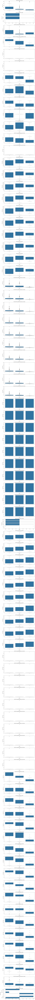

In [18]:
# #final_label= [0, 0, 2, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 2, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 3, 3, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 2, 0, 0, 3, 0, 0, 0, 0, 0, 0, 2, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 3, 1, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 2, 1, 0, 2, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 0, 2, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 2, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 0, 0, 0, 0, 1, 0, 0, 1, 1, 2, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 2, 0, 0, 2, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 1, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 2, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 2, 1, 0, 2, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 2, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1]
# final_label= [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 3, 0, 1, 3, 0, 3, 0, 0, 0, 2, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 2, 0, 0, 1, 0, 2, 2, 0, 0, 2, 0, 0, 3, 0, 0, 0, 0, 0, 0, 1, 2, 2, 2, 2, 0, 0, 0, 0, 3, 2, 0, 0, 0, 0, 2, 2, 3, 0, 3, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 1, 1, 0, 0, 1, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 1, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 1, 0, 0, 3, 2, 0, 0, 0, 3, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 3, 0, 2, 0, 0, 0, 0, 1, 0, 2, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 2, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 2, 0, 3, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 3, 2, 2, 0, 3, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 1, 0, 0, 2, 0, 1, 0, 0, 0, 0, 0, 2, 0, 1, 3, 2, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 2, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 3, 3, 1, 0, 0, 0, 3, 0, 0, 3, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 2, 3, 0, 0, 0, 0, 3, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 3, 1, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 3, 2, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 2, 0, 0, 0, 0, 0, 0, 0, 0, 3, 2, 0, 0, 0, 2, 0, 3, 0]
# plot_box_plots_for_all_features_by_cluster(df_actual, final_label)
# Load the labels from labels.csv
labels_file = 'labels.csv'  # Replace with the correct path if needed
labels_df = pd.read_csv(labels_file, header=None)  # No header in the file

# Exclude the first row and convert the remaining column to a list
labels_array = labels_df[0].iloc[1:].tolist()

# Print the labels array
print(labels_array)


plot_box_plots_for_all_features_by_cluster(df_actual, labels_array)


In [19]:
df_actual['labels'] = labels_array
df_actual = df_actual.drop(columns=['Cluster'])
df_copy['labels'] = labels_array

c0= df_actual[df_actual['labels']==0]
c1= df_actual[df_actual['labels']==1]
c2= df_actual[df_actual['labels']==2]
#c3= df_actual[df_actual['labels']==3]

df_actual.head()


,age,gender,years_job_experience,computer_science_knowledge,antiPhishing_course,phishing_attack,time_on_internet,educationField_id,educationLevel_id,employmentType_id,...,openness,scarcity,consistency,social_proof,gratitude,authority,result,education_job_interaction,region,labels
0,26,Male,0,5,0,0,5,4,2,5,...,4,3,4,1,4,4,3,8,Europe,0
1,26,Female,10,2,0,0,10,15,1,9,...,3,1,3,3,3,5,4,15,Europe,1
2,50,Female,0,1,0,0,4,9,1,2,...,2,2,3,2,5,2,7,9,Europe,0
3,27,Female,0,5,0,0,5,4,3,1,...,3,1,5,2,5,5,4,12,Europe,0
4,17,Female,0,2,0,1,5,15,1,5,...,2,3,5,0,5,3,4,15,Europe,1


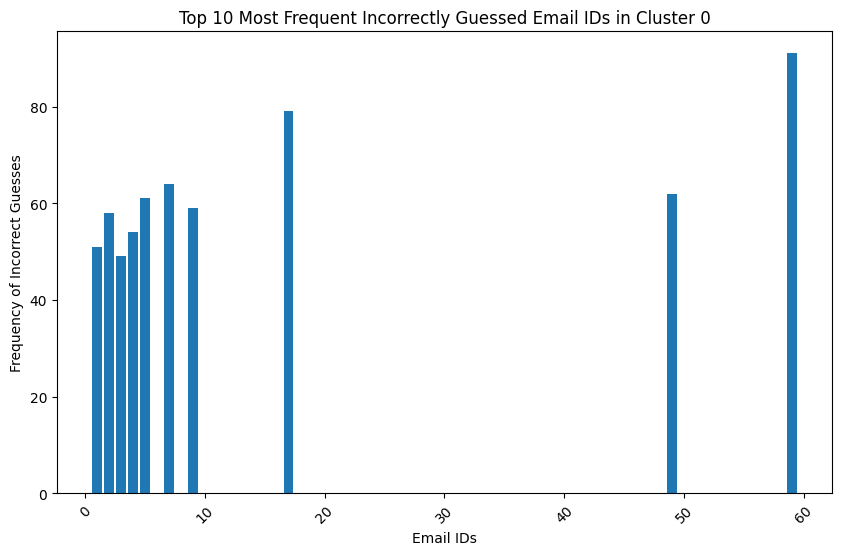

Incorrect emails in cluster 0: [59, 17, 7, 49, 5, 9, 2, 4, 1, 3, 22, 60, 26, 71, 6, 8, 25, 53, 20, 104, 21, 100, 132, 86, 13, 95, 131, 98, 51, 52, 30, 39, 55, 67, 56, 14, 48, 103, 135, 58, 61, 32, 65, 91, 11, 19, 12, 88, 47, 50, 84, 89, 15, 10, 62, 68, 130, 66, 127, 28, 29, 97, 126, 110, 18, 36, 107, 73, 94, 111, 129, 153, 33, 31, 23, 35, 77, 90, 70, 69, 75, 63, 37, 38, 24, 128, 99, 74, 109, 116, 125, 108, 114, 64, 167, 164, 152, 161, 57, 27, 40, 44, 83, 112, 134, 113, 87, 133, 102, 160, 174, 54, 34, 106, 146, 41, 93, 163, 139, 170, 162, 81, 45, 96, 149, 148, 72, 82, 123, 143, 151, 157, 16, 92, 158, 155, 156, 144, 142, 46, 79, 171, 165, 147, 145, 176, 141, 105, 43, 78, 117, 138, 101, 169, 137, 154, 136, 175, 166, 42, 80, 121, 124, 159, 172, 150, 173, 118, 140]


In [20]:
import matplotlib.pyplot as plt
from collections import Counter



def get_incorrectly_guessed_emails_with_plot(df, cluster_number):
    # Filter the DataFrame based on the cluster number
    cluster_df = df[df_actual['labels'] == cluster_number]

    # Initialize a counter to collect frequency of unique, incorrectly guessed email IDs
    incorrect_guesses = Counter()

    # Iterate over each row in the filtered DataFrame
    for _, row in cluster_df.iterrows():
        # Iterate over columns in pairs (test_answer_{num}, email_id_{num})
        for num in range(1, 11):  # Assuming test_answer and email_id columns up to {10}
            test_answer_col = f'test_answer_{num}'
            email_id_col = f'email_id_{num}'

            # Check if columns exist to avoid KeyErrors
            if test_answer_col in row and email_id_col in row:
                test_answer = row[test_answer_col]
                email_id = row[email_id_col]

                # Increment counter for email IDs that were guessed incorrectly
                if (test_answer == 0.0 and email_id in phishing_ids) or (test_answer == 1.0 and email_id in legitimate_ids):
                    incorrect_guesses[email_id] += 1

    # Plot the top 10 most frequent incorrectly guessed email IDs
    if incorrect_guesses:
        top_incorrect_guesses = incorrect_guesses.most_common(10)
        email_ids, frequencies = zip(*top_incorrect_guesses)

        plt.figure(figsize=(10, 6))
        plt.bar(email_ids, frequencies)
        plt.xlabel('Email IDs')
        plt.ylabel('Frequency of Incorrect Guesses')
        plt.title(f'Top 10 Most Frequent Incorrectly Guessed Email IDs in Cluster {cluster_number}')
        plt.xticks(rotation=45)
        plt.show()

    # Return email IDs sorted by frequency in descending order
    return [email_id for email_id, _ in incorrect_guesses.most_common()]


incorrect_emails_c0 = get_incorrectly_guessed_emails_with_plot(df_clusters, 0)
print("Incorrect emails in cluster 0:", incorrect_emails_c0)

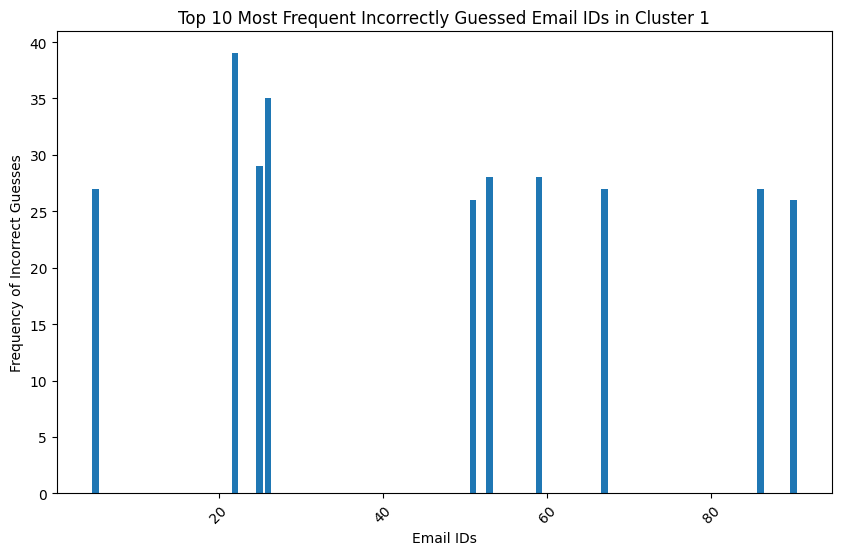

Incorrect emails in cluster 1: [22, 26, 25, 59, 53, 5, 67, 86, 51, 90, 91, 71, 65, 131, 8, 49, 32, 20, 52, 89, 55, 7, 29, 23, 94, 40, 79, 2, 66, 69, 28, 104, 153, 37, 3, 36, 39, 88, 75, 77, 81, 30, 60, 38, 73, 164, 14, 68, 95, 21, 9, 24, 72, 108, 70, 130, 103, 152, 10, 4, 33, 31, 74, 107, 62, 6, 48, 12, 114, 63, 158, 167, 132, 44, 83, 111, 135, 137, 149, 165, 139, 161, 100, 47, 17, 34, 84, 175, 174, 106, 46, 18, 45, 96, 78, 134, 129, 35, 171, 160, 155, 156, 151, 145, 146, 123, 98, 162, 170, 1, 13, 11, 41, 27, 16, 126, 157, 163, 87, 148, 58, 61, 64, 116, 127, 15, 50, 136, 93, 143, 138, 169, 176, 56, 92, 42, 117, 110, 147, 105, 112, 113, 43, 57, 97, 144, 159, 166, 125, 102, 99, 82, 140, 118, 128, 109, 101, 19, 80, 119, 142, 173, 172, 141, 133, 54, 122, 150, 154, 121, 168]


In [21]:
incorrect_emails_c1 = get_incorrectly_guessed_emails_with_plot(df_clusters, 1)
print("Incorrect emails in cluster 1:", incorrect_emails_c1)

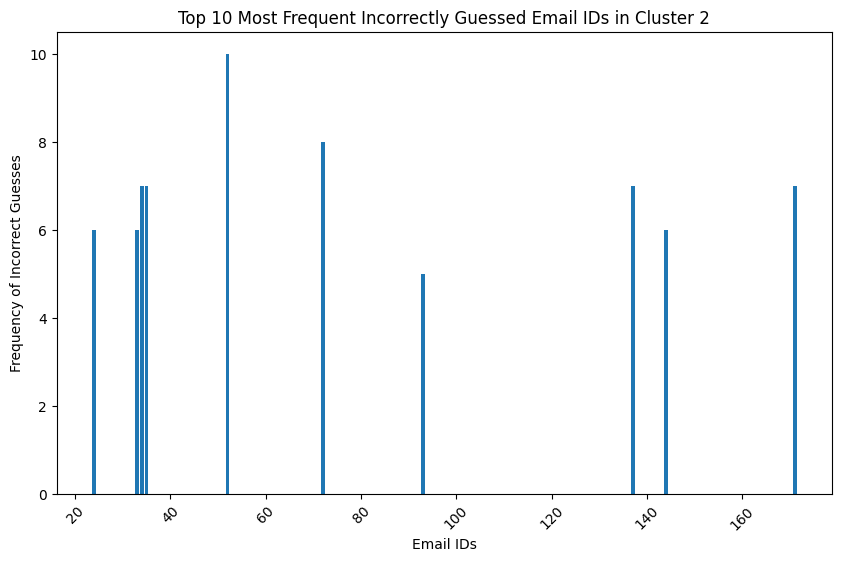

Incorrect emails in cluster 1: [52, 72, 34, 35, 171, 137, 33, 24, 144, 93, 69, 36, 138, 145, 142, 74, 136, 50, 39, 22, 43, 46, 71, 96, 78, 143, 175, 141, 68, 32, 65, 73, 29, 45, 31, 94, 42, 167, 169, 146, 140, 131, 25, 87, 62, 95, 23, 37, 27, 70, 59, 44, 7, 28, 75, 156, 149, 170, 40, 84, 41, 38, 53, 66, 63, 21, 77, 79, 60, 26, 88, 13, 11, 57, 5, 16, 17, 54, 4, 80, 90, 160, 158, 163, 172, 154, 151, 150, 147, 152, 174, 176, 173, 139, 91, 67, 89, 64, 86, 30, 20, 106, 107, 8, 155, 101, 83, 47]


In [22]:
incorrect_emails_c2 = get_incorrectly_guessed_emails_with_plot(df_clusters, 2)
print("Incorrect emails in cluster 1:", incorrect_emails_c2)

In [23]:
# Overall level summary
df_profile_overall = df_actual.describe().T

# using mean; use appropriate summarization (median, count, etc.) for each feature
df_profile_overall['Overall Dataset'] = df_profile_overall[['mean']]
df_profile_overall = df_profile_overall[['Overall Dataset']]

# Cluster ID level summary
df_cluster_summary = df_actual.groupby('labels').describe().T.reset_index()
df_cluster_summary = df_cluster_summary.rename(columns={'level_0':'column','level_1':'metric'})

# using mean; use appropriate summarization (median, count, etc.) for each feature
df_cluster_summary = df_cluster_summary[df_cluster_summary['metric'] == "mean"]
df_cluster_summary = df_cluster_summary.set_index('column')

# join into single summary dataset
df_profile = df_cluster_summary.join(df_profile_overall) # joins on Index
df_profile


,metric,0,1,2,Overall Dataset
column,,,,,
age,mean,35.716186,24.268293,20.901639,31.033422
years_job_experience,mean,10.461197,2.118199,3.901639,7.221257
computer_science_knowledge,mean,3.453437,2.110694,0.524590,2.855615
antiPhishing_course,mean,0.089800,0.046904,0.000000,0.070856
phishing_attack,mean,0.178492,0.125704,0.000000,0.152406
...,...,...,...,...,...
social_proof,mean,2.329268,2.356473,0.672131,2.271390
gratitude,mean,3.541020,2.787992,0.622951,3.153743
authority,mean,3.270510,3.178236,0.786885,3.136364


In [24]:

def approximate_cluster_values(df_profile):
    # Dictionary to store the approximated values for each cluster
    cluster_approximations = {}

    # Loop through each cluster column, excluding 'Overall Dataset'
    for cluster in df_profile.columns[df_profile.columns != 'Overall Dataset']:
        # Filter out non-numeric values (ensure only numeric data is processed)
        numeric_data = pd.to_numeric(df_profile[cluster], errors='coerce')

        # Drop NaN values that resulted from non-numeric entries
        numeric_data = numeric_data.dropna()

        # Round the numeric values to the nearest whole number and convert to integers
        approximated_values = numeric_data.round().astype(int)

        # Store the approximated values along with their index in the dictionary
        cluster_approximations[cluster] = approximated_values

    return cluster_approximations

# Example usage with the df_profile DataFrame
approximated_clusters = approximate_cluster_values(df_profile)

# Print the approximated values for each cluster along with their index (column names)
for cluster, values in approximated_clusters.items():
    print(f"Cluster {cluster} approximated values:")
    for index, value in values.items():
        print(f"  {index}: {value}")


Cluster metric approximated values:
Cluster 0 approximated values:
  age: 36
  years_job_experience: 10
  computer_science_knowledge: 3
  antiPhishing_course: 0
  phishing_attack: 0
  time_on_internet: 6
  educationField_id: 7
  educationLevel_id: 2
  employmentType_id: 5
  jobField_id: 7
  work_hours_prior_test: 4
  antiPhishing_course_ever: 0
  id_1: 8504
  id_2: 8505
  id_3: 8506
  id_4: 8507
  id_5: 8508
  id_6: 8509
  id_7: 8510
  id_8: 8511
  id_9: 8512
  id_10: 8513
  time_taken_to_answer_1: 38
  time_taken_to_answer_2: 27
  time_taken_to_answer_3: 25
  time_taken_to_answer_4: 22
  time_taken_to_answer_5: 22
  time_taken_to_answer_6: 21
  time_taken_to_answer_7: 20
  time_taken_to_answer_8: 19
  time_taken_to_answer_9: 19
  time_taken_to_answer_10: 18
  test_answer_1: 1
  test_answer_2: 1
  test_answer_3: 1
  test_answer_4: 1
  test_answer_5: 1
  test_answer_6: 1
  test_answer_7: 1
  test_answer_8: 1
  test_answer_9: 1
  test_answer_10: 1
  email_id_1: 63
  email_id_2: 62
  emai

# **Predictive Clustering**

In [25]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

# Assuming df_actual is your DataFrame and 'labels' is the target column
X = df_copy.drop('labels', axis=1)
y = df_copy['labels']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### Tree-Based Models

Random Forest, GBM, XGBoost


Random Forest:
Accuracy: 0.910913140311804
              precision    recall  f1-score   support

           0       0.93      0.94      0.93       281
           1       0.87      0.86      0.87       150
           2       0.94      0.89      0.91        18

    accuracy                           0.91       449
   macro avg       0.91      0.90      0.90       449
weighted avg       0.91      0.91      0.91       449



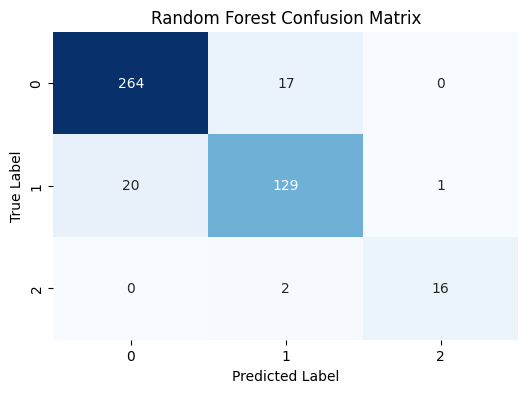

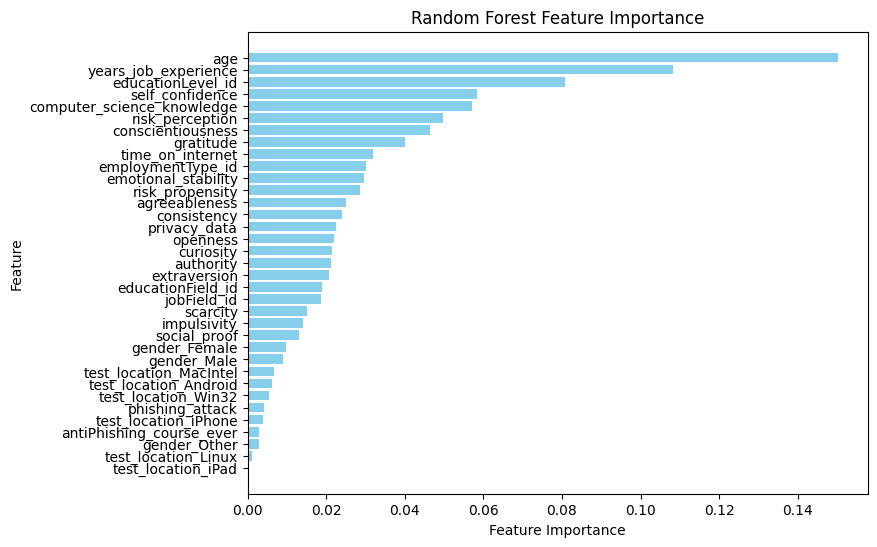


Gradient Boosting Machine:
Accuracy: 0.9309576837416481
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       281
           1       0.89      0.91      0.90       150
           2       0.94      0.89      0.91        18

    accuracy                           0.93       449
   macro avg       0.93      0.91      0.92       449
weighted avg       0.93      0.93      0.93       449



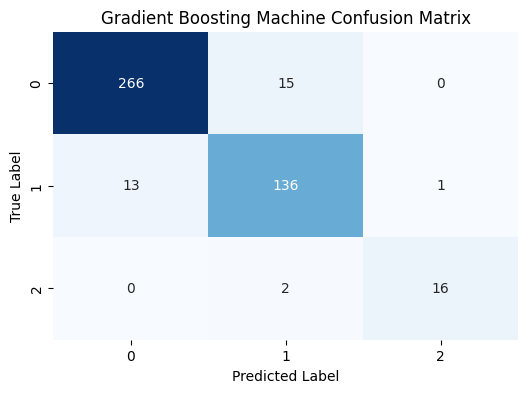

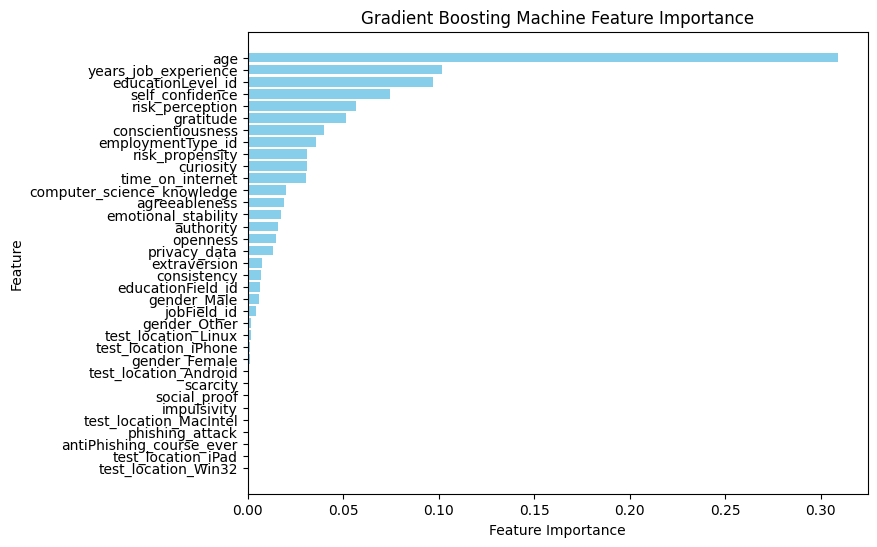


XGBoost:
Accuracy: 0.9265033407572383
              precision    recall  f1-score   support

           0       0.94      0.95      0.95       281
           1       0.89      0.89      0.89       150
           2       0.94      0.89      0.91        18

    accuracy                           0.93       449
   macro avg       0.93      0.91      0.92       449
weighted avg       0.93      0.93      0.93       449



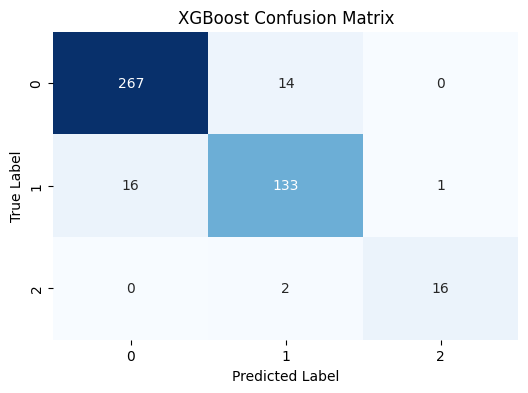

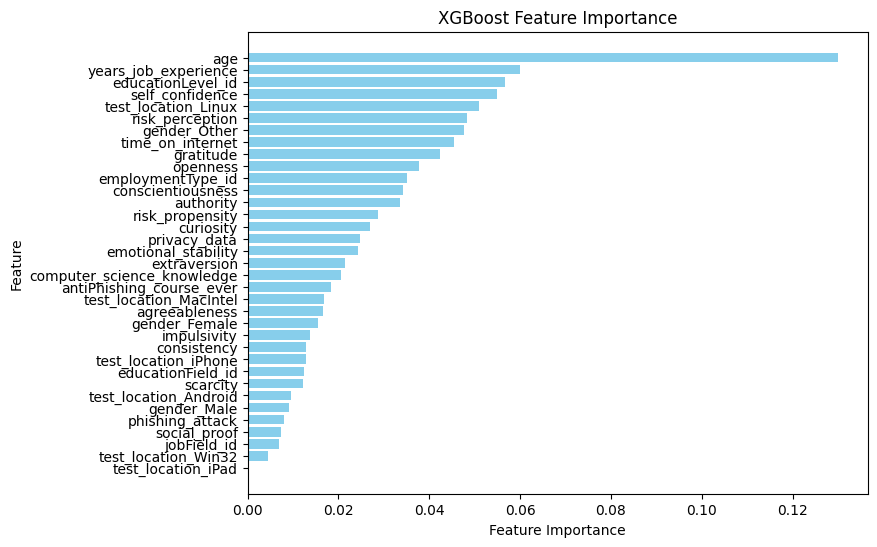


Model Accuracy Comparison:
Random Forest Accuracy: 0.910913140311804
Gradient Boosting Machine Accuracy: 0.9309576837416481
XGBoost Accuracy: 0.9265033407572383


In [26]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

def evaluate_predictive_clustering_models(df, label_column):
    # Split data into features and labels
    X = df.drop(columns=[label_column])
    y = df[label_column]

    # Split into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Initialize models
    rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
    gbm_model = GradientBoostingClassifier(n_estimators=100, random_state=42)
    xgb_model = XGBClassifier(n_estimators=100, random_state=42)

    # Dictionary to store results
    results = {}

    # Function to evaluate a model
    def evaluate_model(model, model_name):
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        accuracy = accuracy_score(y_test, predictions)
        class_report = classification_report(y_test, predictions, output_dict=True)
        conf_matrix = confusion_matrix(y_test, predictions)

        # Store results
        results[model_name] = {
            "accuracy": accuracy,
            "classification_report": class_report,
            "confusion_matrix": conf_matrix
        }

        # Print results
        print(f"\n{model_name}:")
        print(f"Accuracy: {accuracy}")
        print(classification_report(y_test, predictions))

        # Plot confusion matrix
        plt.figure(figsize=(6, 4))
        sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
        plt.xlabel("Predicted Label")
        plt.ylabel("True Label")
        plt.title(f"{model_name} Confusion Matrix")
        plt.show()

        # Plot feature importance if available
        if hasattr(model, "feature_importances_"):
            feature_importance = model.feature_importances_
            sorted_idx = np.argsort(feature_importance)[::-1]
            plt.figure(figsize=(8, 6))
            plt.barh(np.array(X.columns)[sorted_idx], feature_importance[sorted_idx], color="skyblue")
            plt.xlabel("Feature Importance")
            plt.ylabel("Feature")
            plt.title(f"{model_name} Feature Importance")
            plt.gca().invert_yaxis()
            plt.show()

        return accuracy, class_report, conf_matrix

    # Evaluate each model
    rf_results = evaluate_model(rf_model, "Random Forest")
    gbm_results = evaluate_model(gbm_model, "Gradient Boosting Machine")
    xgb_results = evaluate_model(xgb_model, "XGBoost")

    return results

# Example usage
label_column = "labels"  # Replace with the actual label column name
results = evaluate_predictive_clustering_models(df_copy, label_column)

# Example comparison of model accuracy
rf_accuracy = results["Random Forest"]["accuracy"]
rf_precision = results["Random Forest"]["classification_report"]["weighted avg"]["precision"]
rf_recall = results["Random Forest"]["classification_report"]["weighted avg"]["recall"]
rf_f1_score = results["Random Forest"]["classification_report"]["weighted avg"]["f1-score"]

gbm_accuracy = results["Gradient Boosting Machine"]["accuracy"]
gbm_precision = results["Gradient Boosting Machine"]["classification_report"]["weighted avg"]["precision"]
gbm_recall = results["Gradient Boosting Machine"]["classification_report"]["weighted avg"]["recall"]
gbm_f1_score = results["Gradient Boosting Machine"]["classification_report"]["weighted avg"]["f1-score"]

xgb_accuracy = results["XGBoost"]["accuracy"]
xgb_precision = results["XGBoost"]["classification_report"]["weighted avg"]["precision"]
xgb_recall = results["XGBoost"]["classification_report"]["weighted avg"]["recall"]
xgb_f1_score = results["XGBoost"]["classification_report"]["weighted avg"]["f1-score"]

print("\nModel Accuracy Comparison:")
print(f"Random Forest Accuracy: {rf_accuracy}")
print(f"Gradient Boosting Machine Accuracy: {gbm_accuracy}")
print(f"XGBoost Accuracy: {xgb_accuracy}")


###Support Vector Machines (SVM)


SVM with Linear Kernel:
Accuracy: 0.9198218262806236
              precision    recall  f1-score   support

           0       0.96      0.94      0.95       281
           1       0.88      0.89      0.88       150
           2       0.70      0.89      0.78        18

    accuracy                           0.92       449
   macro avg       0.84      0.91      0.87       449
weighted avg       0.92      0.92      0.92       449



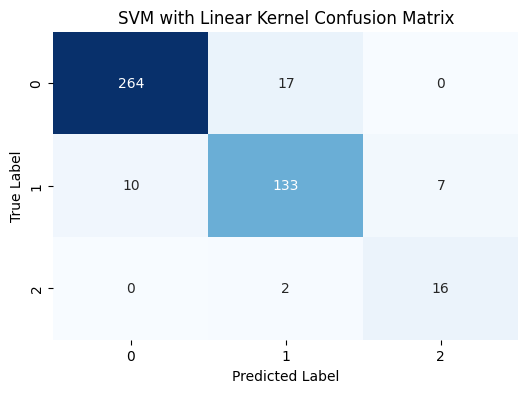


SVM with RBF Kernel:
Accuracy: 0.9420935412026726
              precision    recall  f1-score   support

           0       0.97      0.96      0.97       281
           1       0.89      0.95      0.92       150
           2       0.92      0.61      0.73        18

    accuracy                           0.94       449
   macro avg       0.93      0.84      0.87       449
weighted avg       0.94      0.94      0.94       449



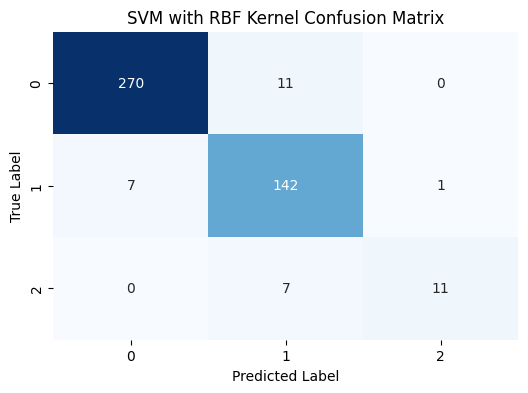


Model Accuracy Comparison:
SVM with Linear Kernel Accuracy: 0.9198218262806236
SVM with RBF Kernel Accuracy: 0.9420935412026726


In [27]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split

def evaluate_svm_models(X, y, test_size=0.3):
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=42)

    # Dictionary to store results
    results = {}

    # Function to evaluate an SVM model
    def evaluate_model(model, model_name):
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        accuracy = accuracy_score(y_test, predictions)
        class_report = classification_report(y_test, predictions, output_dict=True)
        conf_matrix = confusion_matrix(y_test, predictions)

        # Store results
        results[model_name] = {
            "accuracy": accuracy,
            "classification_report": class_report,
            "confusion_matrix": conf_matrix
        }

        # Print results
        print(f"\n{model_name}:")
        print(f"Accuracy: {accuracy}")
        print(classification_report(y_test, predictions))

        # Plot confusion matrix
        plt.figure(figsize=(6, 4))
        sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
        plt.xlabel("Predicted Label")
        plt.ylabel("True Label")
        plt.title(f"{model_name} Confusion Matrix")
        plt.show()

        # Plot decision boundary if data is 2D
        if X.shape[1] == 2:
            h = 0.02
            x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
            y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
            xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
            Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
            Z = Z.reshape(xx.shape)
            plt.contourf(xx, yy, Z, cmap="coolwarm", alpha=0.8)
            plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap="coolwarm", edgecolors="k", marker="o", s=20, label="Train")
            plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap="coolwarm", edgecolors="k", marker="x", s=30, label="Test")
            plt.xlabel("Feature 1")
            plt.ylabel("Feature 2")
            plt.title(f"{model_name} Decision Boundary")
            plt.legend(loc="upper left")
            plt.show()

        return accuracy, class_report, conf_matrix

    # Evaluate SVM with Linear Kernel
    linear_svm = SVC(kernel='linear', random_state=42)
    linear_results = evaluate_model(linear_svm, "SVM with Linear Kernel")

    # Evaluate SVM with RBF Kernel
    rbf_svm = SVC(kernel='rbf', random_state=42)
    rbf_results = evaluate_model(rbf_svm, "SVM with RBF Kernel")

    return results


results = evaluate_svm_models(X, y)

# Example comparison of model accuracy
linear_accuracy = results["SVM with Linear Kernel"]["accuracy"]
linear_precision = results["SVM with Linear Kernel"]["classification_report"]["weighted avg"]["precision"]
linear_recall = results["SVM with Linear Kernel"]["classification_report"]["weighted avg"]["recall"]
linear_f1_score = results["SVM with Linear Kernel"]["classification_report"]["weighted avg"]["f1-score"]

rbf_accuracy = results["SVM with RBF Kernel"]["accuracy"]
rbf_precision = results["SVM with RBF Kernel"]["classification_report"]["weighted avg"]["precision"]
rbf_recall = results["SVM with RBF Kernel"]["classification_report"]["weighted avg"]["recall"]
rbf_f1_score = results["SVM with RBF Kernel"]["classification_report"]["weighted avg"]["f1-score"]

print("\nModel Accuracy Comparison:")
print(f"SVM with Linear Kernel Accuracy: {linear_accuracy}")
print(f"SVM with RBF Kernel Accuracy: {rbf_accuracy}")


### Bayesian Models

Naive Bayes Model Performance:
Accuracy: 0.7766666666666666
              precision    recall  f1-score   support

           0       0.79      0.98      0.88       189
           1       0.94      0.33      0.49        96
           2       0.47      1.00      0.64        15

    accuracy                           0.78       300
   macro avg       0.73      0.77      0.67       300
weighted avg       0.83      0.78      0.74       300



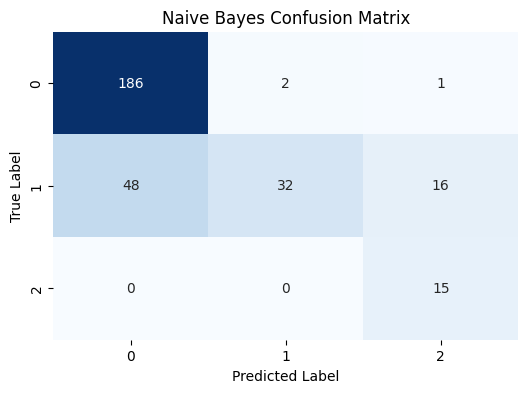

Naive Bayes Accuracy: 0.7766666666666666


In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

def evaluate_naive_bayes(X, y, test_size=0.3):

    # Initialize and train the Gaussian Naive Bayes model
    naive_bayes_model = GaussianNB()
    naive_bayes_model.fit(X_train, y_train)

    # Make predictions on the test set
    naive_bayes_predictions = naive_bayes_model.predict(X_test)

    # Calculate metrics
    accuracy = accuracy_score(y_test, naive_bayes_predictions)
    class_report = classification_report(y_test, naive_bayes_predictions, output_dict=True)
    conf_matrix = confusion_matrix(y_test, naive_bayes_predictions)

    # Print results
    print("Naive Bayes Model Performance:")
    print(f"Accuracy: {accuracy}")
    print(classification_report(y_test, naive_bayes_predictions))

    # Visualize confusion matrix
    plt.figure(figsize=(6, 4))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Naive Bayes Confusion Matrix")
    plt.show()

    # Return results
    return {
        "accuracy": accuracy,
        "classification_report": class_report,
        "confusion_matrix": conf_matrix
    }


# Call the function to evaluate Naive Bayes and store the results
naive_bayes_results = evaluate_naive_bayes(X, y)
nb_accuracy= naive_bayes_results["accuracy"]
nb_precision = naive_bayes_results["classification_report"]["weighted avg"]["precision"]
nb_recall = naive_bayes_results["classification_report"]["weighted avg"]["recall"]
nb_f1_score = naive_bayes_results["classification_report"]["weighted avg"]["f1-score"]

# Access and print specific metrics if needed
print("Naive Bayes Accuracy:", naive_bayes_results["accuracy"])


### Nearest Neighbor Models

k-Nearest Neighbors Model Performance (k=5):
Accuracy: 0.87
              precision    recall  f1-score   support

           0       0.93      0.90      0.92       189
           1       0.79      0.81      0.80        96
           2       0.68      0.87      0.76        15

    accuracy                           0.87       300
   macro avg       0.80      0.86      0.83       300
weighted avg       0.87      0.87      0.87       300



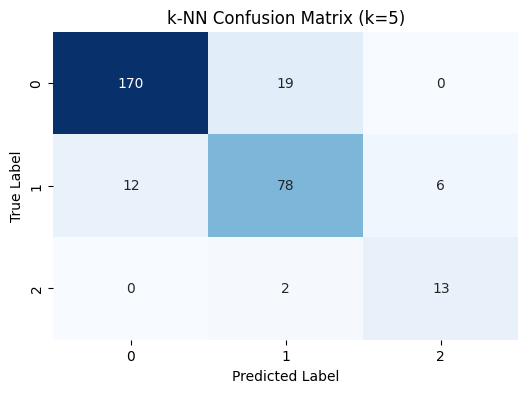

k-NN Accuracy: 0.87


In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

def evaluate_knn(X, y, k=5, test_size=0.3):

    # Initialize and train the k-NN model
    knn_model = KNeighborsClassifier(n_neighbors=k)
    knn_model.fit(X_train, y_train)

    # Make predictions on the test set
    knn_predictions = knn_model.predict(X_test)

    # Calculate metrics
    accuracy = accuracy_score(y_test, knn_predictions)
    class_report = classification_report(y_test, knn_predictions, output_dict=True)
    conf_matrix = confusion_matrix(y_test, knn_predictions)

    # Print results
    print(f"k-Nearest Neighbors Model Performance (k={k}):")
    print(f"Accuracy: {accuracy}")
    print(classification_report(y_test, knn_predictions))

    # Visualize confusion matrix
    plt.figure(figsize=(6, 4))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"k-NN Confusion Matrix (k={k})")
    plt.show()

    # Return results
    return {
        "accuracy": accuracy,
        "classification_report": class_report,
        "confusion_matrix": conf_matrix
    }

# Call the function to evaluate k-NN and store the results
knn_results = evaluate_knn(X, y, k=5)
knn_accuracy= knn_results["accuracy"]
knn_precision = knn_results["classification_report"]["weighted avg"]["precision"]
knn_recall = knn_results["classification_report"]["weighted avg"]["recall"]
knn_f1_score = knn_results["classification_report"]["weighted avg"]["f1-score"]

# Access and print specific metrics if needed
print("k-NN Accuracy:", knn_results["accuracy"])


### Neural Network Models

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 6s 77ms/step - accuracy: 0.5712 - loss: 0.8462 - val_accuracy: 0.8917 - val_loss: 0.4132
Epoch 2/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8389 - loss: 0.4263 - val_accuracy: 0.9167 - val_loss: 0.2593
Epoch 3/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8889 - loss: 0.2816 - val_accuracy: 0.9333 - val_loss: 0.2079
Epoch 4/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9184 - loss: 0.2439 - val_accuracy: 0.9333 - val_loss: 0.1889
Epoch 5/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9149 - loss: 0.2072 - val_accuracy: 0.9417 - val_loss: 0.1731
Epoch 6/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9375 - loss: 0.1724 - val_accuracy: 0.9417 - val_loss: 0.1644
Epoch 7/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9285 - loss: 0.1708 - val_accuracy: 0.9333 - val_loss: 0.1596
Epoch 8/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9221 - loss: 0.1842 - val_accuracy: 0.9333 - val_loss

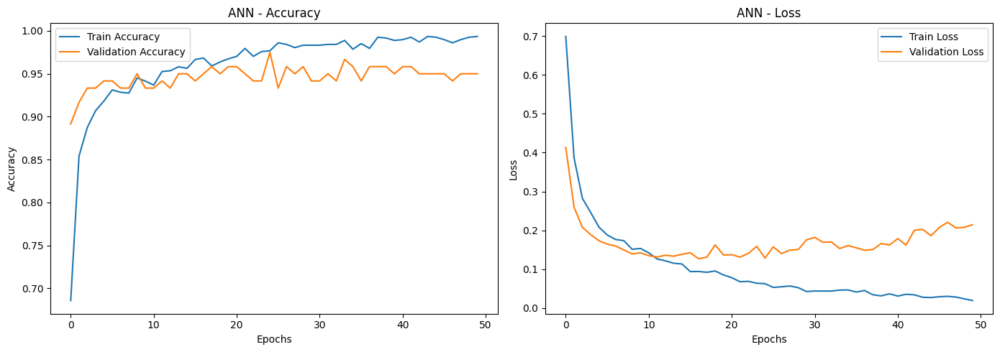

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
ANN - Test Accuracy: 0.9466666666666667

ANN - Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.98      0.97       189
           1       0.94      0.89      0.91        96
           2       0.93      0.87      0.90        15

    accuracy                           0.95       300
   macro avg       0.94      0.91      0.93       300
weighted avg       0.95      0.95      0.95       300



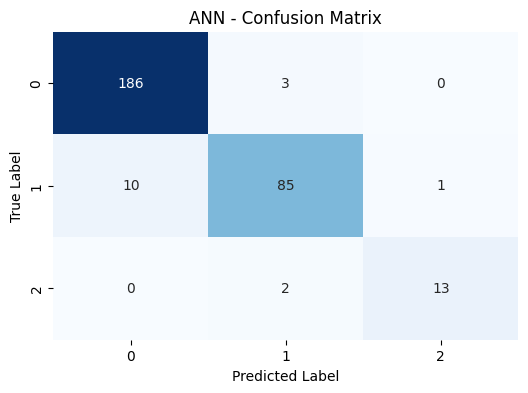

Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


34/34 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - accuracy: 0.6153 - loss: 0.7445 - val_accuracy: 0.8917 - val_loss: 0.3357
Epoch 2/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8462 - loss: 0.3658 - val_accuracy: 0.9000 - val_loss: 0.2393
Epoch 3/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8944 - loss: 0.2739 - val_accuracy: 0.9167 - val_loss: 0.2135
Epoch 4/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9087 - loss: 0.2493 - val_accuracy: 0.9250 - val_loss: 0.1805
Epoch 5/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9125 - loss: 0.2285 - val_accuracy: 0.9417 - val_loss: 0.1719
Epoch 6/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9235 - loss: 0.2133 - val_accuracy: 0.9333 - val_loss: 0.1548
Epoch 7/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9213 - loss: 0.2048 - val_accuracy: 0.9417 - val_loss: 0.1532
Epoch 8/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9207 - loss: 0.1832 - val_accuracy: 0.9333 - val_loss: 0.1583
Ep

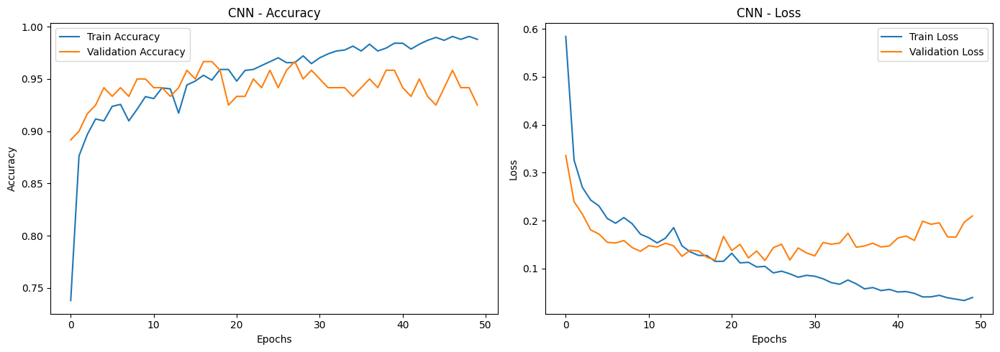

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step
CNN - Test Accuracy: 0.9366666666666666

CNN - Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.97      0.96       189
           1       0.92      0.88      0.90        96
           2       0.81      0.87      0.84        15

    accuracy                           0.94       300
   macro avg       0.90      0.91      0.90       300
weighted avg       0.94      0.94      0.94       300



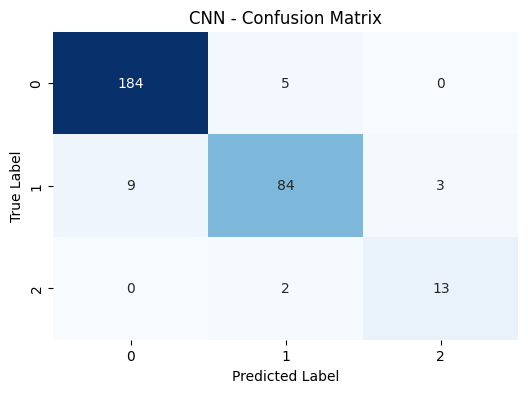

In [30]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Conv1D, MaxPooling1D, Flatten, LSTM

def plot_training_history(history, title):
    """
    Plot training and validation accuracy and loss.
    """
    plt.figure(figsize=(14, 5))

    # Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title(f'{title} - Accuracy')
    plt.legend()

    # Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'{title} - Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

def evaluate_model_performance(model, X_test, y_test, model_name):
    """
    Evaluate model metrics and plot confusion matrix.
    """
    y_pred = np.argmax(model.predict(X_test), axis=1)
    accuracy = accuracy_score(y_test, y_pred)
    class_report = classification_report(y_test, y_pred, output_dict=True)
    conf_matrix = confusion_matrix(y_test, y_pred)

    precision = class_report["weighted avg"]["precision"]
    recall = class_report["weighted avg"]["recall"]
    f1_score = class_report["weighted avg"]["f1-score"]

    print(f"{model_name} - Test Accuracy: {accuracy}")
    print(f"\n{model_name} - Classification Report:\n", classification_report(y_test, y_pred))

    # Confusion Matrix Visualization
    plt.figure(figsize=(6, 4))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"{model_name} - Confusion Matrix")
    plt.show()

    return {
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1_score": f1_score,
        "conf_matrix": conf_matrix
    }

def train_ann(X_train, y_train, X_test, y_test, num_classes):
    """
    Train an Artificial Neural Network (ANN) model.
    """
    model = Sequential([
        Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
        Dropout(0.2),
        Dense(64, activation='relu'),
        Dropout(0.2),
        Dense(num_classes, activation='softmax')
    ])
    model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.1)

    plot_training_history(history, 'ANN')
    return evaluate_model_performance(model, X_test, y_test, "ANN")

def train_cnn(X_train, y_train, X_test, y_test, num_classes):
    """
    Train a Convolutional Neural Network (CNN) model.
    """
    X_train_cnn = np.expand_dims(X_train, axis=-1)
    X_test_cnn = np.expand_dims(X_test, axis=-1)

    model = Sequential([
        Conv1D(64, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], 1)),
        MaxPooling1D(pool_size=2),
        Flatten(),
        Dense(100, activation='relu'),
        Dense(num_classes, activation='softmax')
    ])
    model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    history = model.fit(X_train_cnn, y_train, epochs=50, batch_size=32, validation_split=0.1)

    plot_training_history(history, 'CNN')
    return evaluate_model_performance(model, X_test_cnn, y_test, "CNN")


# Example usage
# Assuming X_train, X_test, y_train, y_test are pre-defined datasets with numeric encoding
# Replace `num_classes` with the actual number of unique classes in y_train/y_test
num_classes = len(np.unique(y_train))

# ANN model training and evaluation
ann_results = train_ann(X_train, y_train, X_test, y_test, num_classes)
ann_accuracy = ann_results["accuracy"]
ann_precision = ann_results["precision"]
ann_recall = ann_results["recall"]
ann_f1_score = ann_results["f1_score"]

# CNN model training and evaluation
cnn_results = train_cnn(X_train, y_train, X_test, y_test, num_classes)
cnn_accuracy = cnn_results["accuracy"]
cnn_precision = cnn_results["precision"]
cnn_recall = cnn_results["recall"]
cnn_f1_score = cnn_results["f1_score"]



### Summary Comparison

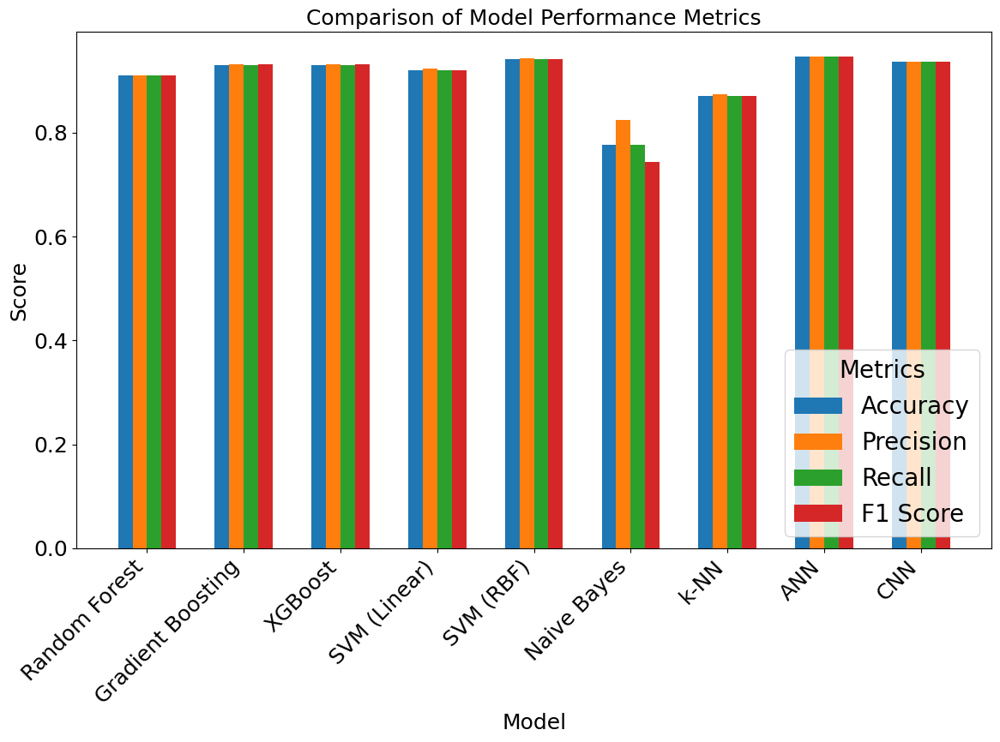

In [31]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Assume these are the metrics collected from each model's evaluation
# Replace these values with actual metrics from each model
metrics_data = {
    "Model": ["Random Forest", "Gradient Boosting", "XGBoost", "SVM (Linear)", "SVM (RBF)", "Naive Bayes", "k-NN", "ANN", "CNN"],
    "Accuracy": [rf_accuracy, gbm_accuracy, gbm_accuracy, linear_accuracy, rbf_accuracy, nb_accuracy, knn_accuracy, ann_accuracy, cnn_accuracy],
    "Precision": [rf_precision, gbm_precision, gbm_precision, linear_precision, rbf_precision, nb_precision, knn_precision, ann_precision, cnn_precision],
    "Recall": [rf_recall, gbm_recall, gbm_recall, linear_recall, rbf_recall, nb_recall, knn_recall, ann_recall, cnn_recall],
    "F1 Score": [rf_f1_score, gbm_f1_score, gbm_f1_score, linear_f1_score, rbf_f1_score, nb_f1_score, knn_f1_score, ann_f1_score, cnn_f1_score],
}

# Convert to DataFrame for easier plotting
metrics_df = pd.DataFrame(metrics_data)

# Set positions and width for bars
bar_width = 0.15
positions = np.arange(len(metrics_df["Model"]))

# Set global font size for all elements
plt.rcParams.update({'font.size': 18})  # Adjust the size as needed

# Create grouped bar chart for comparison
fig, ax = plt.subplots(figsize=(12, 9))

# Plot each metric as a bar
ax.bar(positions - 1.5 * bar_width, metrics_df["Accuracy"], width=bar_width, label="Accuracy")
ax.bar(positions - 0.5 * bar_width, metrics_df["Precision"], width=bar_width, label="Precision")
ax.bar(positions + 0.5 * bar_width, metrics_df["Recall"], width=bar_width, label="Recall")
ax.bar(positions + 1.5 * bar_width, metrics_df["F1 Score"], width=bar_width, label="F1 Score")

# Add labels, title, and legend
ax.set_xlabel("Model", fontsize=18)
ax.set_ylabel("Score", fontsize=18)
ax.set_title("Comparison of Model Performance Metrics", fontsize=18)
ax.set_xticks(positions)
ax.set_xticklabels(metrics_df["Model"], rotation=45, ha="right", fontsize=18)
ax.legend(title="Metrics", fontsize=20, title_fontsize=20, loc="lower right")

# Add values on top of each bar

# Display the chart
plt.tight_layout()
plt.show()


### Predictions


SVM with Linear Kernel:
Accuracy: 0.9198
              precision    recall  f1-score   support

           0       0.96      0.94      0.95       281
           1       0.88      0.89      0.88       150
           2       0.70      0.89      0.78        18

    accuracy                           0.92       449
   macro avg       0.84      0.91      0.87       449
weighted avg       0.92      0.92      0.92       449



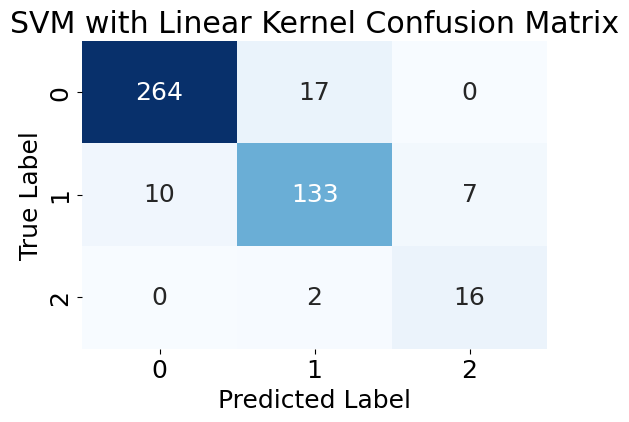


SVM with RBF Kernel:
Accuracy: 0.9421
              precision    recall  f1-score   support

           0       0.97      0.96      0.97       281
           1       0.89      0.95      0.92       150
           2       0.92      0.61      0.73        18

    accuracy                           0.94       449
   macro avg       0.93      0.84      0.87       449
weighted avg       0.94      0.94      0.94       449



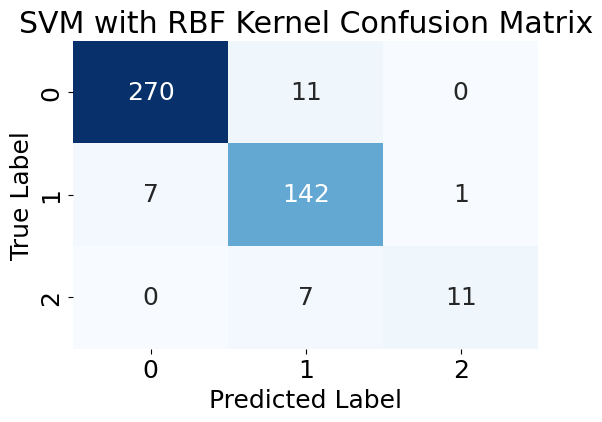

In [32]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split

def train_svm_models(X, y, test_size=0.3):
    """
    Trains SVM models with different kernels and evaluates them.

    Parameters:
    - X (pd.DataFrame or np.ndarray): Feature matrix.
    - y (pd.Series or np.ndarray): Target labels.
    - test_size (float): Proportion of the dataset to include in the test split.

    Returns:
    - dict: A dictionary containing accuracy, classification reports, and confusion matrices.
    - SVC: Trained linear SVM model.
    - SVC: Trained RBF SVM model.
    """

    # ✅ Step 1: Split Data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=42)

    # ✅ Step 2: Initialize Storage for Results
    results = {}

    # ✅ Step 3: Define Function to Evaluate Model
    def evaluate_model(model, model_name):
        """
        Trains and evaluates an SVM model, storing results.

        Parameters:
        - model (SVC): The SVM model instance.
        - model_name (str): The model name.

        Returns:
        - accuracy (float): Accuracy score.
        - class_report (dict): Classification report.
        - conf_matrix (ndarray): Confusion matrix.
        """

        # Train model
        model.fit(X_train, y_train)

        # Make predictions
        predictions = model.predict(X_test)

        # Compute metrics
        accuracy = accuracy_score(y_test, predictions)
        class_report = classification_report(y_test, predictions, output_dict=True)
        conf_matrix = confusion_matrix(y_test, predictions)

        # Store results
        results[model_name] = {
            "accuracy": accuracy,
            "classification_report": class_report,
            "confusion_matrix": conf_matrix
        }

        # Print results
        print(f"\n{model_name}:")
        print(f"Accuracy: {accuracy:.4f}")
        print(classification_report(y_test, predictions))

        # Plot Confusion Matrix
        plt.figure(figsize=(6, 4))
        sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
        plt.xlabel("Predicted Label")
        plt.ylabel("True Label")
        plt.title(f"{model_name} Confusion Matrix")
        plt.show()

        return accuracy, class_report, conf_matrix

    # ✅ Step 4: Train & Evaluate Models
    linear_svm = SVC(kernel='linear', random_state=42)
    rbf_svm = SVC(kernel='rbf', random_state=42)

    linear_results = evaluate_model(linear_svm, "SVM with Linear Kernel")
    rbf_results = evaluate_model(rbf_svm, "SVM with RBF Kernel")

    # ✅ Save trained linear SVM model
    with open("svm_model.pkl", "wb") as f:
        pickle.dump(linear_svm, f)


    # ✅ Return trained models and results
    return results, linear_svm, rbf_svm


# ✅ Train and Retrieve Models
results, linear_svm, rbf_svm = train_svm_models(X, y)



# ✅ Now you can use linear_svm.predict() anywhere!



In [33]:
# Modify the preprocess_data function to handle a combined DataFrame and return separated results


# ✅ Load stored mean and std values from original dataset
mean_values = pd.read_csv("mean_values.csv", index_col=0).squeeze()
std_values = pd.read_csv("std_values.csv", index_col=0).squeeze()

# ✅ Load stored fitted transformers
with open("quantile_transformer.pkl", "rb") as f:
    quantile_transformer = pickle.load(f)

with open("scaler.pkl", "rb") as f:
    scaler = pickle.load(f)


# Load trained SVM model
with open("svm_model.pkl", "rb") as f:
    svm_model = pickle.load(f)


def preprocess_data(df_LLM, new_row_df):
    """
    Preprocesses a dataset by appending a new single-row DataFrame to df_LLM,
    applying transformations to the entire dataset, and then separating the
    processed single-row dataset from the rest.

    Parameters:
        df_LLM (pd.DataFrame): The main dataset.
        new_row_df (pd.DataFrame): The new single-row dataset collected via the interface.

    Returns:
        tuple: (Processed df_LLM, Processed single-row dataset)
    """

    # Append new row to the dataset
    combined_df = pd.concat([df_LLM, new_row_df], ignore_index=True)

    # Define expected columns
    numerical_columns = [
        'age', 'years_job_experience', 'computer_science_knowledge', 'phishing_attack',
        'time_on_internet', 'educationField_id', 'educationLevel_id', 'employmentType_id',
        'jobField_id', 'antiPhishing_course_ever', 'self_confidence',
        'impulsivity', 'curiosity', 'risk_propensity', 'risk_perception', 'privacy_data',
        'extraversion', 'agreeableness', 'conscientiousness', 'emotional_stability', 'openness',
        'scarcity', 'consistency', 'social_proof', 'gratitude', 'authority'
    ]

    categorical_columns = ['gender', 'test_location']

    # Determine Encoding Using Kendall Tau
    encoding_decisions = determine_encoding(combined_df, categorical_columns, numerical_columns)

    # Convert numeric-like columns to float
    for col in combined_df.columns:
        if col not in categorical_columns:
            combined_df[col] = pd.to_numeric(combined_df[col], errors='coerce')

    # Apply Encoding Automatically
    label_encoders = {}
    for col, encoding_type in encoding_decisions.items():
        if encoding_type == 'Label Encoding':
            le = LabelEncoder()
            combined_df[col] = le.fit_transform(combined_df[col].astype(str))
            label_encoders[col] = le  # Save encoder for potential inverse transformation

        elif encoding_type == 'One-Hot Encoding':
            if col in ['gender', 'test_location']:
                one_hot = pd.get_dummies(combined_df[col], prefix=col, drop_first=False)  # Drop first category
            else:
                one_hot = pd.get_dummies(combined_df[col], prefix=col)
            combined_df = pd.concat([combined_df, one_hot], axis=1)
            combined_df.drop(columns=[col], inplace=True)

    # Convert numeric-like columns to float
    combined_df = combined_df.astype(float)

    # Apply Quantile Transformation & Standardization
    combined_df[numerical_columns] = quantile_transformer.transform(combined_df[numerical_columns])
    combined_df[numerical_columns] = scaler.transform(combined_df[numerical_columns])

    # Separate the processed single-row dataset from the rest
    processed_new_row_df = combined_df.iloc[[-1]].copy()  # Last row
    processed_df_LLM = combined_df.iloc[:-1].copy()  # All except last row

    # Confirmation message
    print("Updated preprocess_data function implemented successfully.")
    return processed_df_LLM, processed_new_row_df


In [34]:
import numpy as np
import pandas as pd
import ipywidgets as widgets
from IPython.display import display, clear_output
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, QuantileTransformer

# Define the feature names and possible values
feature_values = {
    'age': range(18, 101),
    'gender': {'Male': 0, 'Female': 1, 'Other': 2},
    'years_job_experience': range(0, 51),
    'computer_science_knowledge': {f"Level {i}": i for i in range(1, 6)},
    'phishing_attack': {'Never Experienced Phishing Attack': 0, 'Experienced Phishing Attack Before': 1},
    'time_on_internet': range(1, 11),
    'educationField_id': {'Natural Sciences': 1, 'Mathematics and Physics': 2, 'Information Technology': 3, 'Engineering': 4, 'Architecture and Building': 5,
                          'Agriculture and Related Studies': 6, 'Health': 7, 'Management and Commerce': 8, 'Society and Culture': 9, 'Arts and Entertainment': 10,
                          'Culinary, Hospitality': 11, 'Law': 12, 'Finance': 13, 'Psychology': 14, 'Other': 15},
    'educationLevel_id': {'High School': 1, 'Bachelor': 2, 'Master': 3, 'PhD': 4},
    'employmentType_id': {'Trainee': 1, 'Employee': 2, 'Manager': 3, 'Executive': 4, 'Student': 5, 'Teacher': 6, 'R&D': 7, 'Entrepreneur': 8, 'Freelancer': 9},
    'jobField_id': {'Natural Sciences': 1, 'Mathematics and Physics': 2, 'Information Technology': 3, 'Engineering': 4, 'Architecture and Building': 5,
                    'Agriculture and Related Studies': 6, 'Health': 7, 'Management and Commerce': 8, 'Society and Culture': 9, 'Arts and Entertainment': 10,
                    'Culinary, Hospitality': 11, 'Law': 12, 'Finance': 13, 'Psychology': 14, 'Other': 15},
    'antiPhishing_course_ever': {'Never': 0, 'Experienced': 1},
    'test_location': {'Android':0, 'Linux':1, 'MacIntel':2, 'Win32':3, 'iPad':4, 'iPhone':5},
    'self_confidence': {f"Level {i}": i for i in range(6)},
    'impulsivity': {f"Level {i}": i for i in range(6)},
    'curiosity': {f"Level {i}": i for i in range(6)},
    'risk_propensity': {f"Level {i}": i for i in range(6)},
    'risk_perception': {f"Level {i}": i for i in range(6)},
    'privacy_data': {f"Level {i}": i for i in range(6)},
    'extraversion': {f"Level {i}": i for i in range(6)},
    'agreeableness': {f"Level {i}": i for i in range(6)},
    'conscientiousness': {f"Level {i}": i for i in range(6)},
    'emotional_stability': {f"Level {i}": i for i in range(6)},
    'openness': {f"Level {i}": i for i in range(6)},
    'scarcity': {f"Level {i}": i for i in range(6)},
    'consistency': {f"Level {i}": i for i in range(6)},
    'social_proof': {f"Level {i}": i for i in range(6)},
    'gratitude': {f"Level {i}": i for i in range(6)},
    'authority': {f"Level {i}": i for i in range(6)},
}



# Create dropdown widgets for user input
inputs = {}
encoded_inputs = {}
for feature, values in feature_values.items():
    if isinstance(values, range):
        inputs[feature] = widgets.IntSlider(value=values.start, min=values.start, max=values.stop - 1, step=1, description=feature)
    else:
        display_values = list(values)  # ✅ FIXED: Convert set to list
        inputs[feature] = widgets.Dropdown(options=display_values, description=feature)
        encoded_inputs[feature] = values  # Store encoding mapping

submit_button = widgets.Button(description="Submit")
output_area = widgets.Output()


def predict_label(input_data):


    # Ensure input is 2D with (1, features)
    input_array = np.array(input_data)  # ✅ Ensure it's an array

    prediction = svm_model.predict(input_array)[0]  # ✅ Ensure correct shape before prediction
    return prediction


    # prediction = svm_model.predict(processed_array)[0]  # Predict label

# Global storage for text_inputs_array
text_inputs_array_storage = []
predicted_label_for_LLM = []


def on_submit_clicked(b):
    clear_output(wait=True)
    with output_area:
        text_inputs_array = []  # Raw textual values for LLM API
        encoded_inputs_array = []  # Encoded numerical values for SVM model


        for feature, widget in inputs.items():
            raw_value = widget.value
            text_inputs_array.append(raw_value)


            # Convert to encoded value if categorical
            if feature in encoded_inputs:
                encoded_value = encoded_inputs[feature][raw_value]
            else:
                encoded_value = raw_value
            encoded_inputs_array.append(encoded_value)

        text_inputs_array_storage.clear()
        predicted_label_for_LLM.clear()
        print(encoded_inputs_array)

        # ✅ Convert to a properly structured DataFrame (Fixing shape issue)
        df_temp = pd.DataFrame([encoded_inputs_array], columns=df_LLM.columns)

        # ✅ Apply preprocessing
        processed_df_LLM, processed_df = preprocess_data(df_LLM, df_temp)

        # ✅ Convert processed_df to a 2D array properly (fixing shape issue)
        processed_array = processed_df.values  # Already (1, 36), no need to reshape

        # ✅ Predict the label using the trained SVM model
        predicted_label = predict_label(processed_array)
        print(f"Predicted Label: {predicted_label}")

        # Display raw inputs for API
        print("\nInputs for LLM API:")
        print(text_inputs_array)
        text_inputs_array_storage.extend(text_inputs_array)
        predicted_label_for_LLM.append(predicted_label)



# Link the button to the callback
submit_button.on_click(on_submit_clicked)

# Display the UI
for widget in inputs.values():
    display(widget)
display(submit_button, output_area)


IntSlider(value=18, description='age', min=18)

Dropdown(description='gender', options=('Male', 'Female', 'Other'), value='Male')

IntSlider(value=0, description='years_job_experience', max=50)

Dropdown(description='computer_science_knowledge', options=('Level 1', 'Level 2', 'Level 3', 'Level 4', 'Level…

Dropdown(description='phishing_attack', options=('Never Experienced Phishing Attack', 'Experienced Phishing At…

IntSlider(value=1, description='time_on_internet', max=10, min=1)

Dropdown(description='educationField_id', options=('Natural Sciences', 'Mathematics and Physics', 'Information…

Dropdown(description='educationLevel_id', options=('High School', 'Bachelor', 'Master', 'PhD'), value='High Sc…

Dropdown(description='employmentType_id', options=('Trainee', 'Employee', 'Manager', 'Executive', 'Student', '…

Dropdown(description='jobField_id', options=('Natural Sciences', 'Mathematics and Physics', 'Information Techn…

Dropdown(description='antiPhishing_course_ever', options=('Never', 'Experienced'), value='Never')

Dropdown(description='test_location', options=('Android', 'Linux', 'MacIntel', 'Win32', 'iPad', 'iPhone'), val…

Dropdown(description='self_confidence', options=('Level 0', 'Level 1', 'Level 2', 'Level 3', 'Level 4', 'Level…

Dropdown(description='impulsivity', options=('Level 0', 'Level 1', 'Level 2', 'Level 3', 'Level 4', 'Level 5')…

Dropdown(description='curiosity', options=('Level 0', 'Level 1', 'Level 2', 'Level 3', 'Level 4', 'Level 5'), …

Dropdown(description='risk_propensity', options=('Level 0', 'Level 1', 'Level 2', 'Level 3', 'Level 4', 'Level…

Dropdown(description='risk_perception', options=('Level 0', 'Level 1', 'Level 2', 'Level 3', 'Level 4', 'Level…

Dropdown(description='privacy_data', options=('Level 0', 'Level 1', 'Level 2', 'Level 3', 'Level 4', 'Level 5'…

Dropdown(description='extraversion', options=('Level 0', 'Level 1', 'Level 2', 'Level 3', 'Level 4', 'Level 5'…

Dropdown(description='agreeableness', options=('Level 0', 'Level 1', 'Level 2', 'Level 3', 'Level 4', 'Level 5…

Dropdown(description='conscientiousness', options=('Level 0', 'Level 1', 'Level 2', 'Level 3', 'Level 4', 'Lev…

Dropdown(description='emotional_stability', options=('Level 0', 'Level 1', 'Level 2', 'Level 3', 'Level 4', 'L…

Dropdown(description='openness', options=('Level 0', 'Level 1', 'Level 2', 'Level 3', 'Level 4', 'Level 5'), v…

Dropdown(description='scarcity', options=('Level 0', 'Level 1', 'Level 2', 'Level 3', 'Level 4', 'Level 5'), v…

Dropdown(description='consistency', options=('Level 0', 'Level 1', 'Level 2', 'Level 3', 'Level 4', 'Level 5')…

Dropdown(description='social_proof', options=('Level 0', 'Level 1', 'Level 2', 'Level 3', 'Level 4', 'Level 5'…

Dropdown(description='gratitude', options=('Level 0', 'Level 1', 'Level 2', 'Level 3', 'Level 4', 'Level 5'), …

Dropdown(description='authority', options=('Level 0', 'Level 1', 'Level 2', 'Level 3', 'Level 4', 'Level 5'), …

Button(description='Submit', style=ButtonStyle())

Output()

# **Generative AI Model**

In [ ]:
!pip install cohere


In [ ]:
text_inputs_array = text_inputs_array_storage
print(text_inputs_array)
print(predicted_label_for_LLM)

[18, 'Male', 0, 'Level 1', 'Never Experienced Phishing Attack', 1, 'Natural Sciences', 'High School', 'Trainee', 'Natural Sciences', 'Never', 'Android', 'Level 0', 'Level 0', 'Level 0', 'Level 0', 'Level 0', 'Level 0', 'Level 0', 'Level 0', 'Level 0', 'Level 0', 'Level 0', 'Level 0', 'Level 0', 'Level 0', 'Level 0', 'Level 0']
[2]


In [ ]:
import cohere
import pandas as pd

df_scheme = pd.read_csv("/content/EmailsScheme.csv")

# Initialize Cohere client with your API key
cohere_client = cohere.Client('664uPgGi02o8u9tl95OuvvGyqjHR34Al7aIuyKba')

def generate_emails_from_ids(
    dataframe,
    email_ids,
    text_inputs_array
):
    """
    Generates professional emails based on an array of ID numbers from a dataframe
    containing email characteristics, using the dynamic text_inputs_array for
    user traits.
    """
    emails = {}
    for email_id in email_ids:
        email_data = dataframe.loc[dataframe['id'] == email_id] # for each row of the seleted IDs
        if email_data.empty:
            emails[email_id] = f"ID {email_id} not found in the dataframe."
            continue

        # email_data = email_data.iloc[0]

        # # Extract data from the row
        # label = email_data['label']
        # sender_name = email_data['sender_name']
        # body_greetings = email_data['body_greetings']
        # subject = email_data['subject']
        # subject_forward = email_data['subject_forward']
        # subject_response = email_data['subject_response']
        # context_result = email_data['context_result']

    # Construct the prompt using the provided text_inputs_array
    prompt = f"""
        You are an AI assistant specializing in cybersecurity and personalized education. Using the following dynamically provided input features and email data, generate a tailored set of instructions to raise the user's awareness about phishing email risks. Ensure the recommendations are personalized, practical, and adapt to the user's unique profile traits. Update the content based on the input values for each individual to ensure relevance.

        Input Details for the AI Assistant to know about and tailor the response accordingly (don't display it to the user):
           a) User Profile Features :
              Features dynamically provided for each individual include:

              Behavioral traits (the higher the levels the better): age={text_inputs_array[0]}, gender={text_inputs_array[1]}, self confidence level={text_inputs_array[13]}, impulsivity level={text_inputs_array[14]}, curiosity level={text_inputs_array[15]}, risk propensity level={text_inputs_array[16]}, risk perception level={text_inputs_array[17]}, and level of caring about data privacy={text_inputs_array[18]}.
              Job characteristics : job experience of {text_inputs_array[2]} years, education Field of {text_inputs_array[6]}, Education level= {text_inputs_array[7]}, employment Type {text_inputs_array[8]}  and job Field {text_inputs_array[9]}.
              Psychological factors (the higher the levels the better): extraversion level={text_inputs_array[19]}, agreeableness level={text_inputs_array[20]}, conscientiousness level={text_inputs_array[21]}, emotional stability level={text_inputs_array[22]}, openness level={text_inputs_array[23]}.
              Previous phishing experiences: {text_inputs_array[4]}.

              These values are dynamically populated for each user, and your instructions should adjust accordingly.

           b) Email Data Analysis :
              Provided email data includes:

              An array of email IDs {email_ids} and a dataframe {dataframe} containing email characteristics each identified in a separate column.
              You are expected to:

                  1. Study well the dataset {dataframe}
                  2. Analyze common traits in the same columns for each email referenced by the given IDs to list them clearly to the user.
                  3. Identify to the user the common characteristics of specified phishing email IDs (e.g., Tone of writing the email, urgent subject lines, suspicious attachments, etc..).

        Output Requirements (thetailored response that will be displayed to the user):
          User-Specific Awareness Instructions:
              1. Provide an intro of the common traits in emails referenced by the given IDs to list them clearly to the user as the cluster that he/she belongs to usually for for these traits.
              2. Tailor the raising awareness recommendations dynamically based on the provided user profile features.
              3. Address the user's specific traits and tendencies (e.g., for someone with high impulsivity: “Pause and verify links before clicking on them.”).
              4. Offer practical examples that align with their unique profile (e.g., "Since you frequently work online late at night, always verify the sender's email domain before responding.").

          Email Pattern Insights:
              1. Dynamically analyze common phishing traits found in the provided email IDs.
              2. Highlight actionable advice to detect these traits in the user's email inbox (e.g., "Emails with urgent subject lines often signal phishing attempts. Double-check the sender domain if the email requests immediate action.").

        Instructions for the AI Model:
            1. Use clear, professional language that adapts dynamically to the input values for relevance and precision.
            2. Focus on empowering the user by highlighting their vulnerabilities and strengths through actionable knowledge.
            3. Ensure the recommendations are concise, personalized, and easy to follow.

        Example Outputs (Dynamic):
            If the user has high impulsivity level and low risk perception:
            "Take a moment to pause and evaluate the content of urgent-looking emails. Phishing attacks often exploit urgency to bypass rational decision-making. Verify the sender using a secondary medium before acting."

            If emails exhibit frequent domain squatting:
            "Many of your emails display domain squatting (e.g., using slight typos in domains like 'goggle.com'). Always check the spelling of domains, especially if the email requests sensitive information."
        By adapting each instruction dynamically based on the user's profile and email data, ensure the user gains actionable knowledge to protect themselves effectively against phishing risks.
        """

    # LLM Query (Cohere Example)
    response = cohere_client.generate(
        model='command-r-08-2024',
        prompt=prompt,
        max_tokens=1000,  # Increased token limit for more detailed emails
        temperature=0.5,  # Lower temperature for more focused output
    )

    # Store the generated email text
    result = response.generations[0].text.strip()

    return result

# Example usage:

result = generate_emails_from_ids(df_scheme, incorrect_emails_c0, text_inputs_array)

print(result)
# for email_id, email_text in generated_emails.items():
#     print(f"Email for ID {email_id}:\n{email_text}\n")


User-Specific Awareness Instructions:

Hello there! It's important to be vigilant about phishing attempts, especially considering your profile and the email patterns you encounter. Here are some tailored recommendations to enhance your awareness:

- **Email Traits in Your Cluster:** Based on the email IDs provided, your cluster tends to receive emails with a focus on urgency and a professional tone. These emails often have subject lines indicating time-sensitive matters and may include phrases like "Urgent Request" or "Include license number." The senders typically represent official organizations or departments within your organization.

- **Impulsivity and Risk Perception:** Given your higher impulsivity and lower risk perception levels, it's crucial to develop a habit of pausing before taking action on emails. Phishing attacks often exploit urgency, so taking a moment to verify the sender's identity and the content's legitimacy can significantly reduce your risk of falling victim.



In [ ]:
output_file_path = '/content/sample_data/df_copy.csv'
df_copy.to_csv(output_file_path, index=False)

# Gradio APP Interface

In [35]:
!pip install gradio
!pip install cohere


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 MB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.1/322.1 kB 25.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.9/94.9 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.2/11.2 MB 107.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 5.6 MB/s eta 0:00:00
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 3.0.2
    Uninstalling MarkupSafe-3.0.2:
      Successfully uninstalled MarkupSafe-3.0.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 253.9/253.9 kB 18.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 75.1 MB/s eta 0:00:00


In [36]:
df_LLM

,age,gender,years_job_experience,computer_science_knowledge,phishing_attack,time_on_internet,educationField_id,educationLevel_id,employmentType_id,jobField_id,...,extraversion,agreeableness,conscientiousness,emotional_stability,openness,scarcity,consistency,social_proof,gratitude,authority
0,26,Male,0,5,0,5,4,2,5,4,...,3,5,2,2,4,3,4,1,4,4
1,26,Female,10,2,0,10,15,1,9,15,...,2,3,2,1,3,1,3,3,3,5
2,50,Female,0,1,0,4,9,1,2,9,...,5,5,5,3,2,2,3,2,5,2
3,27,Female,0,5,0,5,4,3,1,4,...,1,5,5,3,3,1,5,2,5,5
4,17,Female,0,2,1,5,15,1,5,15,...,1,4,2,3,2,3,5,0,5,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1491,19,Female,0,0,0,7,15,2,5,15,...,1,5,2,2,4,2,3,3,5,3
1492,23,Female,1,4,0,7,3,2,6,3,...,3,4,5,4,4,3,3,3,4,3
1493,54,Male,28,2,0,2,10,2,3,3,...,2,3,2,1,1,1,3,2,3,4
1494,90,Female,40,3,1,6,7,4,4,7,...,5,5,5,5,5,0,5,5,5,3


In [37]:
import gradio as gr
import pandas as pd
import numpy as np
import joblib
import os
import cohere
import sklearn.preprocessing as skl_preprocessing
import logging

# Global storage for text_inputs_array
text_inputs_array_storage = []
predicted_label_for_LLM = []

# Configure logging to display debug information
logging.basicConfig(level=logging.DEBUG, format='%(asctime)s - %(levelname)s - %(message)s')

# Load data and models (replace paths with your actual file locations)
scaler = joblib.load('/content/scaler.pkl')  # Load your trained scaler
svm_model = joblib.load('/content/svm_model.pkl')  # Load your trained SVM model
df_scheme = pd.read_csv("/content/EmailsScheme.csv")

# Define feature names and their possible values
feature_values = {
    'age': range(18, 101),
    'gender': {'Male': 'Male', 'Female': 'Female', 'Other': 'Other'},
    'years_job_experience': range(0, 51),
    'computer_science_knowledge': {f"Level {i}": i for i in range(1, 6)},
    'phishing_attack': {'Never Experienced Phishing Attack': 0, 'Experienced Phishing Attack Before': 1},
    'time_on_internet': range(1, 11),
    'educationField_id': {
        'Natural Sciences': 1, 'Mathematics and Physics': 2, 'Information Technology': 3, 'Engineering': 4,
        'Architecture and Building': 5, 'Agriculture and Related Studies': 6, 'Health': 7, 'Management and Commerce': 8,
        'Society and Culture': 9, 'Arts and Entertainment': 10, 'Culinary, Hospitality': 11, 'Law': 12, 'Finance': 13,
        'Psychology': 14, 'Other': 15
    },
    'educationLevel_id': {'High School': 1, 'Bachelor': 2, 'Master': 3, 'PhD': 4},
    'employmentType_id': {
        'Trainee': 1, 'Employee': 2, 'Manager': 3, 'Executive': 4, 'Student': 5, 'Teacher': 6, 'R&D': 7,
        'Entrepreneur': 8, 'Freelancer': 9
    },
    'jobField_id': {
        'Natural Sciences': 1, 'Mathematics and Physics': 2, 'Information Technology': 3, 'Engineering': 4,
        'Architecture and Building': 5, 'Agriculture and Related Studies': 6, 'Health': 7, 'Management and Commerce': 8,
        'Society and Culture': 9, 'Arts and Entertainment': 10, 'Culinary, Hospitality': 11, 'Law': 12, 'Finance': 13,
        'Psychology': 14, 'Other': 15
    },
    'antiPhishing_course_ever': {'Never': 0, 'Experienced': 1},
    'test_location': {'Android': 'Android', 'Linux': 'Linux', 'MacIntel': 'MacIntel', 'Win32': 'Win32', 'iPad': 'iPad', 'iPhone': 'iPhone'},
    'self_confidence': {f"Level {i}": i for i in range(6)},
    'impulsivity': {f"Level {i}": i for i in range(6)},
    'curiosity': {f"Level {i}": i for i in range(6)},
    'risk_propensity': {f"Level {i}": i for i in range(6)},
    'risk_perception': {f"Level {i}": i for i in range(6)},
    'privacy_data': {f"Level {i}": i for i in range(6)},
    'extraversion': {f"Level {i}": i for i in range(6)},
    'agreeableness': {f"Level {i}": i for i in range(6)},
    'conscientiousness': {f"Level {i}": i for i in range(6)},
    'emotional_stability': {f"Level {i}": i for i in range(6)},
    'openness': {f"Level {i}": i for i in range(6)},
    'scarcity': {f"Level {i}": i for i in range(6)},
    'consistency': {f"Level {i}": i for i in range(6)},
    'social_proof': {f"Level {i}": i for i in range(6)},
    'gratitude': {f"Level {i}": i for i in range(6)},
    'authority': {f"Level {i}": i for i in range(6)},
}

# Helper function to determine if a feature is level-based
def is_level_feature(values):
    if not isinstance(values, dict):
        return False
    keys = list(values.keys())
    try:
        levels = [int(k.split()[1]) for k in keys if k.startswith("Level ")]
        if len(levels) != len(keys):
            return False
        min_val = min(levels)
        max_val = max(levels)
        expected_keys = [f"Level {i}" for i in range(min_val, max_val + 1)]
        return keys == expected_keys
    except:
        return False

# Define feature categories for tabbed layout
categories = {
    "Personal Information": ['age', 'gender', 'educationField_id', 'educationLevel_id'],
    "Job Information": ['years_job_experience', 'employmentType_id', 'jobField_id'],
    "Technical Knowledge": ['computer_science_knowledge', 'time_on_internet', 'test_location'],
    "Phishing Experience": ['phishing_attack', 'antiPhishing_course_ever'],
    "Psychological Traits": [
        'self_confidence', 'impulsivity', 'curiosity', 'risk_propensity', 'risk_perception', 'privacy_data',
        'extraversion', 'agreeableness', 'conscientiousness', 'emotional_stability', 'openness', 'scarcity',
        'consistency', 'social_proof', 'gratitude', 'authority'
    ]
}

# Define the prediction and response generation function with debugging
def predict_and_generate(*args):
    try:
        if len(args) != len(feature_values):
              raise ValueError(f"Expected {len(feature_values)} inputs, got {len(args)}")

        text_inputs_array = list(args)
        encoded_array = []
        for feature, value in zip(feature_values.keys(), args):
            if isinstance(feature_values[feature], range):
                encoded_array.append(value)  # Directly append numeric values
            else:
                # Directly map numeric values for level-based features
                if is_level_feature(feature_values[feature]):
                    if value not in feature_values[feature].values():
                        raise ValueError(f"Invalid value '{value}' for feature '{feature}'")
                    encoded_array.append(value)  # Append numeric value directly
                else:
                    if value not in feature_values[feature]:
                        raise ValueError(f"Invalid value '{value}' for feature '{feature}'")
                    encoded_array.append(feature_values[feature][value])  # Convert categorical to numeric
        print("encoded_array:",encoded_array)

        text_inputs_array_storage.clear()
        predicted_label_for_LLM.clear()

        # ✅ Convert to a properly structured DataFrame (Fixing shape issue)
        df_temp = pd.DataFrame([encoded_array], columns=df_LLM.columns)
        print("fixed shaping issue")

        # ✅ Apply preprocessing
        processed_df_LLM, processed_df = preprocess_data(df_LLM, df_temp)
        print(processed_df)

        # ✅ Convert processed_df to a 2D array properly (fixing shape issue)
        processed_array = processed_df.values  # Already (1, 36), no need to reshape
        print("Converted processed_df to a 2D array properly")

        # ✅ Predict the label using the trained SVM model
        predicted_label = predict_label(processed_array)
        print(f"Predicted Label: {predicted_label}")

        # Display raw inputs for API
        print("\nInputs for LLM API:")
        print(text_inputs_array)
        text_inputs_array_storage.extend(text_inputs_array)
        predicted_label_for_LLM.append(predicted_label)


        dataframe = pd.read_csv("/content/EmailsScheme.csv")

        # Retrieve email IDs
        if predicted_label == 0:
            email_ids = incorrect_emails_c0
        elif predicted_label == 1:
            email_ids = incorrect_emails_c1
        elif predicted_label == 2:
            email_ids = incorrect_emails_c2
        emails = {}
        for email_id in email_ids:
            email_data = dataframe.loc[dataframe['id'] == email_id] # for each row of the seleted IDs
            if email_data.empty:
                emails[email_id] = f"ID {email_id} not found in the dataframe."
                continue

        filtered_df = dataframe[dataframe['id'].isin(email_ids)]
        print(filtered_df)

        # Construct the prompt for Cohere API
        print("Constructing prompt for Cohere API")
        prompt = f"""
        You are an AI assistant with expertise in cybersecurity and personalized education. Your task is to analyze both user profile features and email data, then generate a detailed, personalized set of instructions aimed at increasing the user’s awareness of phishing email risks. Your response must be well-structured, concise, and tailored to the unique characteristics of the user.

        ---
        Input Details:

        1. **User Profile Features:**

          - **Behavioral Traits:**
            - Age: {text_inputs_array[0]}
            - Gender: {text_inputs_array[1]}
            - Self-Confidence Level: {text_inputs_array[13]}
            - Impulsivity Level: {text_inputs_array[14]}
            - Curiosity Level: {text_inputs_array[15]}
            - Risk Propensity Level: {text_inputs_array[16]}
            - Risk Perception Level: {text_inputs_array[17]}
            - Data Privacy Concern Level: {text_inputs_array[18]}

          - **Job Characteristics:**
            - Years of Job Experience: {text_inputs_array[2]}
            - Education Field: {text_inputs_array[6]}
            - Education Level: {text_inputs_array[7]}
            - Employment Type: {text_inputs_array[8]}
            - Job Field: {text_inputs_array[9]}

          - **Psychological Factors:**
            - Extraversion Level: {text_inputs_array[19]}
            - Agreeableness Level: {text_inputs_array[20]}
            - Conscientiousness Level: {text_inputs_array[21]}
            - Emotional Stability Level: {text_inputs_array[22]}
            - Openness Level: {text_inputs_array[23]}

          - **Previous Phishing Experiences:**
            - Details: {text_inputs_array[4]}

        2. **Email Data Analysis:**

          - **Top Manipulative Emails DataFrame:**
            {filtered_df.to_string()}

          - **Email Pattern Analysis:**
            - Analyze the top 10 email records to identify common traits (e.g., authority tone, urgent language, etc.) that correlate with this user profile.
            - If the analysis is inconclusive, continue iterating through the dataset until clear patterns emerge.

        ---
        Output Requirements:

        Your response should include the following sections:

        1. **User-Specific Awareness Instructions:**
          - Introduce and explain the common traits identified in the phishing emails, referencing the email cluster labeled as {predicted_label}.
          - Provide personalized recommendations based on the user’s profile features. For example, if the user has a high impulsivity level, include advice such as: “Since you tend to act quickly, pause and verify the source before clicking any links.”
          - Include practical, actionable examples and tips tailored to the user's specific job and behavioral characteristics.

        2. **Email Pattern Insights:**
          - Clearly list the common phishing traits found in the analyzed emails.
          - Offer step-by-step actionable advice to help the user recognize and respond to these traits.

        ---
        Instructions for Tone and Style:
        - Use clear, professional, and concise language.
        - Empower the user by highlighting both vulnerabilities and strengths.
        - Ensure all feedback is directly tied to the dynamic input values for each individual, enhancing relevance and personalization.

        Your final output should be a comprehensive, well-organized set of personalized instructions that effectively educates the user about phishing risks while taking into account their unique profile and email patterns.

        """
        print("Prompt constructed for Cohere API")

        # Initialize Cohere client
        print("Initializing Cohere client")
        cohere_client = cohere.Client('664uPgGi02o8u9tl95OuvvGyqjHR34Al7aIuyKba')

        # Generate response using Cohere API
        print("Generating response from Cohere API")
        response = cohere_client.generate(
            model='command-r-08-2024',
            prompt=prompt,
            max_tokens=4000,  # Increased max_tokens to allow for longer responses
            temperature=0.5,
            stop_sequences=None  # Removed stop_sequences to avoid premature truncation
        )
        llm_response = response.generations[0].text.strip()
        print("Response generated from Cohere API")

        return f"### Cluster Prediction\nYou belong to cluster {predicted_label}.", f"### Personalized Phishing Awareness Response\n{llm_response}"

    except Exception as e:
        logging.error(f"Error in predict_and_generate: {str(e)}")
        return "An error occurred while generating the awareness instructions. Please check the logs for more details.", ""

# Create the enhanced Gradio interface with Blocks
with gr.Blocks(theme="default") as demo:
    gr.Markdown("# Phishing Awareness Tool")
    gr.Markdown("Enter your details below to receive a cluster prediction and personalized phishing awareness instructions tailored to your profile.")

    components = {}

    with gr.Tabs():
        for category, features in categories.items():
            with gr.TabItem(category):
                if category == "Psychological Traits":
                    psych_traits = features
                    with gr.Row():
                        with gr.Column():
                            for feature in psych_traits[:len(psych_traits) // 2]:
                                values = feature_values[feature]
                                min_val = min(values.values())
                                max_val = max(values.values())
                                component = gr.Slider(
                                    minimum=min_val,
                                    maximum=max_val,
                                    step=1,
                                    label=feature.replace('_', ' ').title()
                                )
                                components[feature] = component
                        with gr.Column():
                            for feature in psych_traits[len(psych_traits) // 2:]:
                                values = feature_values[feature]
                                min_val = min(values.values())
                                max_val = max(values.values())
                                component = gr.Slider(
                                    minimum=min_val,
                                    maximum=max_val,
                                    step=1,
                                    label=feature.replace('_', ' ').title()
                                )
                                components[feature] = component
                else:
                    for feature in features:
                        values = feature_values[feature]
                        if isinstance(values, range):
                            component = gr.Slider(
                                minimum=values.start,
                                maximum=values.stop - 1,
                                step=1,
                                label=feature.replace('_', ' ').title()
                            )
                        elif is_level_feature(values):
                            min_val = min(values.values())
                            max_val = max(values.values())
                            component = gr.Slider(
                                minimum=min_val,
                                maximum=max_val,
                                step=1,
                                label=feature.replace('_', ' ').title()
                            )
                        elif len(values) <= 3:
                            component = gr.Radio(
                                choices=list(values.keys()),
                                label=feature.replace('_', ' ').title()
                            )
                        else:
                            component = gr.Dropdown(
                                choices=list(values.keys()),
                                label=feature.replace('_', ' ').title()
                            )
                        components[feature] = component

    submit_btn = gr.Button("Generate Awareness Instructions")
    cluster_output = gr.Markdown()
    response_output = gr.Markdown()

    input_components = [components[feature] for feature in feature_values.keys()]

    submit_btn.click(
        fn=predict_and_generate,
        inputs=input_components,
        outputs=[cluster_output, response_output]
    )

# Launch the interface with debugging enabled
if __name__ == "__main__":
    demo.launch(
        server_name="0.0.0.0",
        server_port=7882,
        share=True,  # Generates a public URL
        debug=True   # Enables Gradio's debug mode for additional logs
    )

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://0fadc08fad75eef860.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


encoded_array: [18, 'Male', 0, 1, 0, 1, 1, 1, 1, 1, 0, 'Android', 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
fixed shaping issue
Updated preprocess_data function implemented successfully.
           age  years_job_experience  computer_science_knowledge  \
1496 -0.819102             -1.346663                   -0.608801   

      phishing_attack  time_on_internet  educationField_id  educationLevel_id  \
1496        -0.424041         -1.003728          -2.260542          -1.066519   

      employmentType_id  jobField_id  antiPhishing_course_ever  ...  \
1496          -2.933455    -2.332385                 -0.353287  ...   

      authority  gender_Female  gender_Male  gender_Other  \
1496  -2.535279            0.0          1.0           0.0   

      test_location_Android  test_location_Linux  test_location_MacIntel  \
1496                    1.0                  0.0                     0.0   

      test_location_Win32  test_location_iPad  test_location_iPhone  
1496              

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


      id                     label borderline              sender_name  \
3      4  Corporate communications       True   Procurement Department   
4      5  Corporate communications       True           Direct Manager   
6      7      Financial management      False      Banking Institution   
7      8  Corporate communications       True                Colleague   
10    11      Financial management      False      Postal Service Info   
..   ...                       ...        ...                      ...   
171  172                     Sport        NaN       Promotional Offers   
172  173                    Social        NaN  Government Organization   
173  174                    Social        NaN          Design Platform   
174  175                     Event        NaN     Marketing Department   
175  176                     Other        NaN        Real Estate Agent   

                              from  \
3       ufficio_acquisti@jiaky.com   
4          stefano.botta@jiaky.com 